In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout, GRU
import matplotlib.pyplot as plt

In [2]:
file= '../data/production.csv'
data=pd.read_csv(file)

grouped_data = data.groupby(['county', 'product_type', 'is_business'])

df = grouped_data.get_group((0, 1, 0))

train_size = int(len(df) * 0.8)
train_df = df[:train_size]
test_df = df[train_size:]

In [3]:
cluster=pd.read_csv('../clustering/clutser_client_production_pdf.csv')
clustering=pd.merge(data,cluster, on=['county', 'product_type', 'is_business'],how='inner')

In [4]:
df.columns

Index(['Unnamed: 0', 'datetime', 'product_type', 'county', 'eic_count',
       'installed_capacity', 'is_business', 'date', 'target',
       'prediction_unit_id', 'temperature', 'dewpoint', 'rain', 'snowfall',
       'surface_pressure', 'cloudcover_total', 'windspeed_10m',
       'winddirection_10m', 'shortwave_radiation', 'direct_solar_radiation',
       'diffuse_radiation', 'lowest_price_per_mwh', 'highest_price_per_mwh',
       'elect_prices', 'hour', 'dayofweek', 'quarter', 'month', 'year',
       'dayofyear', 'day'],
      dtype='object')

# cluster 2 using complicated GRU (64 units , 32 units , 16 units)

trainX shape == (5547, 48, 17).
trainY shape == (5547, 1).
Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_4 (GRU)                 (None, 48, 64)            15936     
                                                                 
 gru_5 (GRU)                 (None, 32)                9408      
                                                                 
 dropout_2 (Dropout)         (None, 32)                0         
                                                                 
 dense_2 (Dense)             (None, 1)                 33        
                                                                 
Total params: 25,377
Trainable params: 25,377
Non-trainable params: 0
_________________________________________________________________
Epoch 1/100
500/500 [==============================] - 15s 17ms/step - loss: 0.5645 - val_loss: 0.0419
Epoch 2/100
500/500 

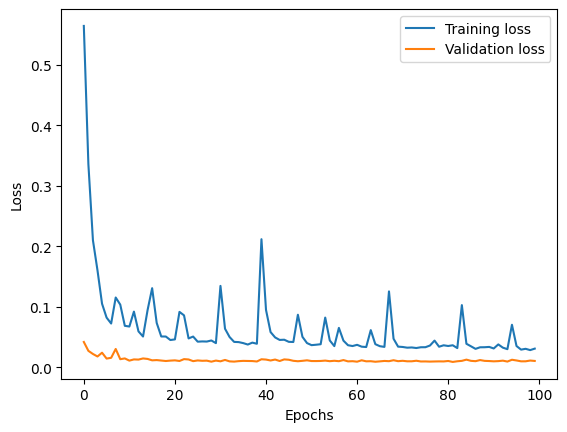

In [10]:

from sklearn.model_selection import KFold
from keras.regularizers import l2

# Define the columns for training
cols = ['eic_count', 'installed_capacity', 'temperature', 'dewpoint',
        'rain', 'snowfall', 'surface_pressure', 'cloudcover_total', 'windspeed_10m',
        'winddirection_10m', 'shortwave_radiation', 'direct_solar_radiation',
        'diffuse_radiation', 'lowest_price_per_mwh', 'highest_price_per_mwh',
        'elect_prices', 'target']

# Initialize an empty DataFrame to store the scaled data
scaled_data = pd.DataFrame()

df_for_training = train_df[cols].astype(float)
scaler = StandardScaler()
df_for_training_scaled = scaler.fit_transform(df_for_training)

trainX = []
trainY = []
n_future = 1  # Number of days we want to look into the future based on the past days.
n_past = 48 # Number of past days we want to use to predict the future.

for i in range(n_past, len(df_for_training_scaled) - n_future + 1):
    trainX.append(df_for_training_scaled[i - n_past:i])
    trainY.append(df_for_training_scaled[i + n_future - 1:i + n_future, -1])  # Target column is the last one

trainX, trainY = np.array(trainX), np.array(trainY)

print('trainX shape == {}.'.format(trainX.shape))
print('trainY shape == {}.'.format(trainY.shape))


model = Sequential()
model.add(GRU(64, activation='tanh', recurrent_activation='sigmoid', input_shape=(trainX.shape[1], trainX.shape[2]), return_sequences=True))
model.add(GRU(32, activation='tanh', recurrent_activation='sigmoid', return_sequences=False))
model.add(Dropout(0.2))
model.add(Dense(1, kernel_regularizer=l2(0.01)))  # Output dimension is 1 as we're predicting a single value

model.compile(optimizer='adam', loss='mse')
model.summary() 


history = model.fit(trainX, trainY, epochs=100, batch_size=10, validation_split=0.1, verbose=1)
plt.plot(history.history['loss'], label='Training loss')
plt.plot(history.history['val_loss'], label='Validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()




6/6 [==============================] - 1s 11ms/step


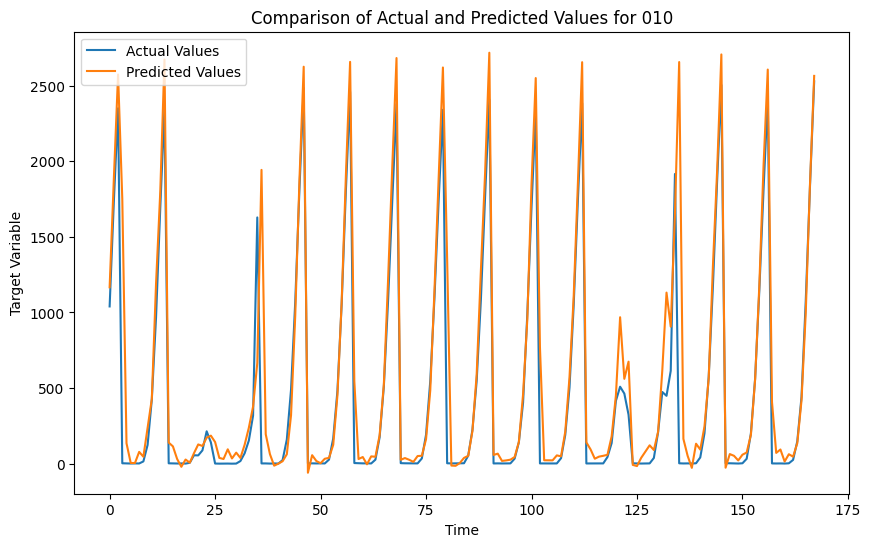

Group: 010
R2 Score: 0.7888658032885181
MSE: 119551.11683377814
RMSE: 345.7616474303912
MAE: 137.4771454756345



In [11]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from keras.models import load_model
import matplotlib.pyplot as plt

df_test = test_df[cols].astype(float)



# Use the scaler from the training to transform the test data
df_test_scaled1= scaler.fit(df_test)
df_test_scaled = scaler.transform(df_test)

# Initialize the lists for testX and testY
testX = []
testY = []


# Prepare testX and testY
for i in range(n_past, len(df_test_scaled) - n_future + 1):
    testX.append(df_test_scaled[i - n_past:i])
    testY.append(df_test_scaled[i + n_future - 1:i + n_future, -1])  # Assuming the last column is still the target

testX, testY = np.array(testX), np.array(testY)



n_days_for_prediction = 168




target_scaler = StandardScaler()
target_scaler.fit(df_test[['target']])


# Predict on the last n_days_for_prediction
prediction_scaled = model.predict(testX[-n_days_for_prediction:])
prediction = target_scaler.inverse_transform(prediction_scaled)
actual = target_scaler.inverse_transform(testY[-n_days_for_prediction:])

# Calculate the metrics
r2 = r2_score(actual, prediction)
mse = mean_squared_error(actual, prediction)
rmse = np.sqrt(mse)
mae = mean_absolute_error(actual, prediction)

# Plotting
plt.figure(figsize=(10,6))
plt.plot(actual, label='Actual Values')
plt.plot(prediction, label='Predicted Values')
plt.title(f'Comparison of Actual and Predicted Values for 010')
plt.xlabel('Time')
plt.ylabel('Target Variable')
plt.legend()
plt.show()

# Print metrics
print(f"Group: 010")
print(f"R2 Score: {r2}")
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")
print(f"MAE: {mae}\n")

6/6 [==============================] - 0s 14ms/step
{'group': (0, 0, 1), 'r2': 0.6495113449535812, 'mse': 4090.0855903348574, 'rmse': 63.95377698255872, 'mae': 25.697353299920582}


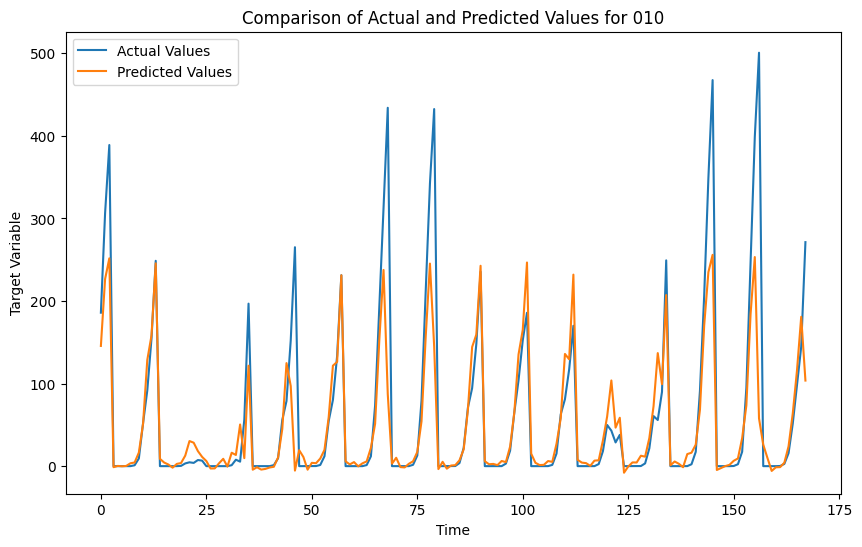

6/6 [==============================] - 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.6495113449535812, 'mse': 4090.0855903348574, 'rmse': 63.95377698255872, 'mae': 25.697353299920582}
{'group': (0, 1, 0), 'r2': 0.6818191861444658, 'mse': 180164.42738307462, 'rmse': 424.4578040077419, 'mae': 172.30040628936177}


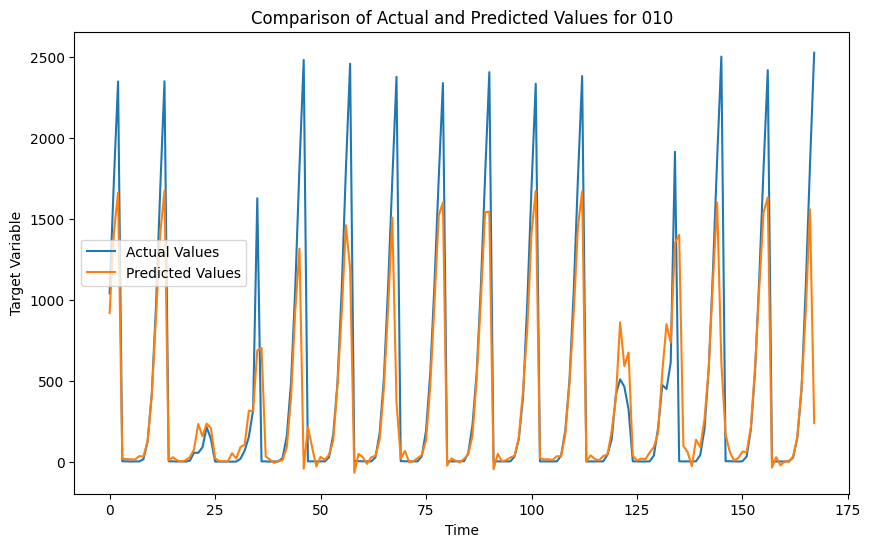

6/6 [==============================] - 0s 12ms/step
{'group': (0, 0, 1), 'r2': 0.6495113449535812, 'mse': 4090.0855903348574, 'rmse': 63.95377698255872, 'mae': 25.697353299920582}
{'group': (0, 1, 0), 'r2': 0.6818191861444658, 'mse': 180164.42738307462, 'rmse': 424.4578040077419, 'mae': 172.30040628936177}
{'group': (0, 1, 1), 'r2': 0.5206574259182031, 'mse': 53258.305801620045, 'rmse': 230.7776111359593, 'mae': 87.73261241808392}


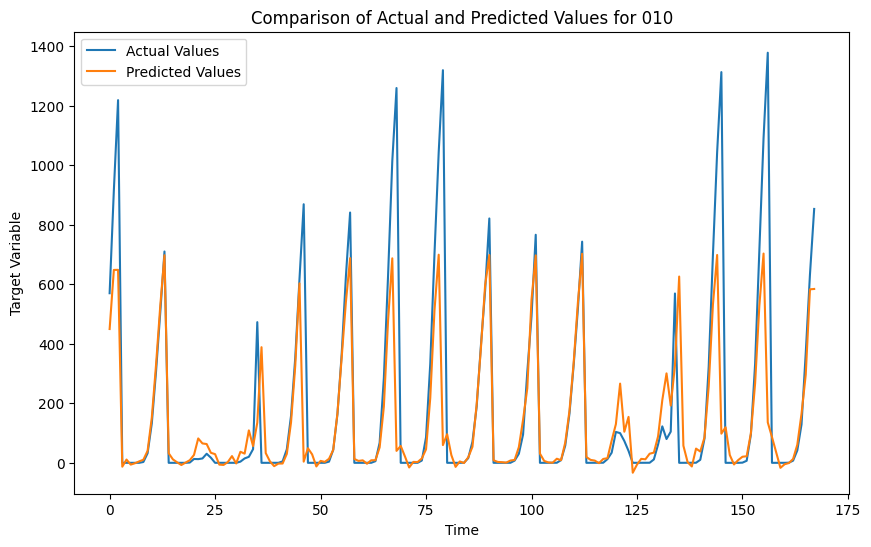

6/6 [==============================] - 0s 10ms/step
{'group': (0, 0, 1), 'r2': 0.6495113449535812, 'mse': 4090.0855903348574, 'rmse': 63.95377698255872, 'mae': 25.697353299920582}
{'group': (0, 1, 0), 'r2': 0.6818191861444658, 'mse': 180164.42738307462, 'rmse': 424.4578040077419, 'mae': 172.30040628936177}
{'group': (0, 1, 1), 'r2': 0.5206574259182031, 'mse': 53258.305801620045, 'rmse': 230.7776111359593, 'mae': 87.73261241808392}
{'group': (0, 2, 1), 'r2': 0.8692724021386904, 'mse': 19.250354886509616, 'rmse': 4.3875226365808775, 'mae': 2.3691888909424392}


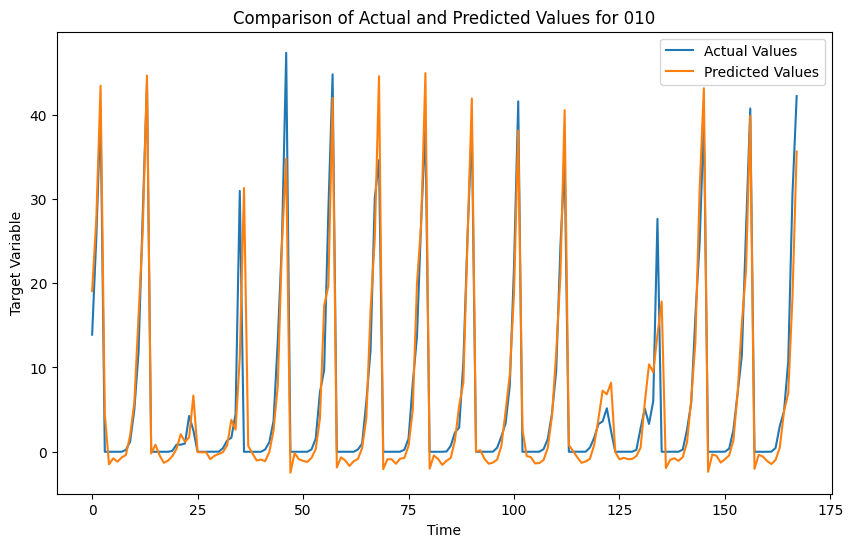

6/6 [==============================] - 0s 8ms/step
{'group': (0, 0, 1), 'r2': 0.6495113449535812, 'mse': 4090.0855903348574, 'rmse': 63.95377698255872, 'mae': 25.697353299920582}
{'group': (0, 1, 0), 'r2': 0.6818191861444658, 'mse': 180164.42738307462, 'rmse': 424.4578040077419, 'mae': 172.30040628936177}
{'group': (0, 1, 1), 'r2': 0.5206574259182031, 'mse': 53258.305801620045, 'rmse': 230.7776111359593, 'mae': 87.73261241808392}
{'group': (0, 2, 1), 'r2': 0.8692724021386904, 'mse': 19.250354886509616, 'rmse': 4.3875226365808775, 'mae': 2.3691888909424392}
{'group': (0, 3, 0), 'r2': 0.5731344919230292, 'mse': 2812662.5170924217, 'rmse': 1677.099435660397, 'mae': 665.5877618690445}


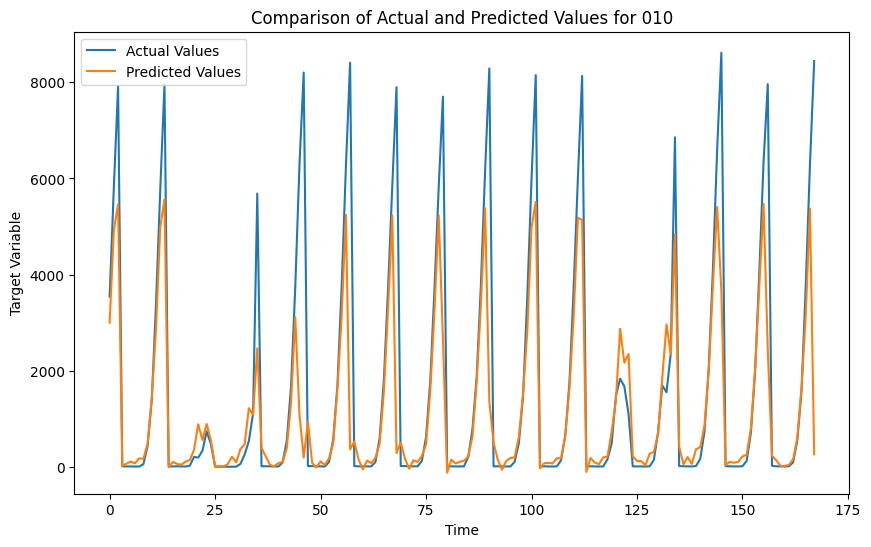

6/6 [==============================] - 0s 7ms/step
{'group': (0, 0, 1), 'r2': 0.6495113449535812, 'mse': 4090.0855903348574, 'rmse': 63.95377698255872, 'mae': 25.697353299920582}
{'group': (0, 1, 0), 'r2': 0.6818191861444658, 'mse': 180164.42738307462, 'rmse': 424.4578040077419, 'mae': 172.30040628936177}
{'group': (0, 1, 1), 'r2': 0.5206574259182031, 'mse': 53258.305801620045, 'rmse': 230.7776111359593, 'mae': 87.73261241808392}
{'group': (0, 2, 1), 'r2': 0.8692724021386904, 'mse': 19.250354886509616, 'rmse': 4.3875226365808775, 'mae': 2.3691888909424392}
{'group': (0, 3, 0), 'r2': 0.5731344919230292, 'mse': 2812662.5170924217, 'rmse': 1677.099435660397, 'mae': 665.5877618690445}
{'group': (0, 3, 1), 'r2': 0.7110708447155554, 'mse': 1391978.03673639, 'rmse': 1179.8211884588231, 'mae': 471.5787190924826}


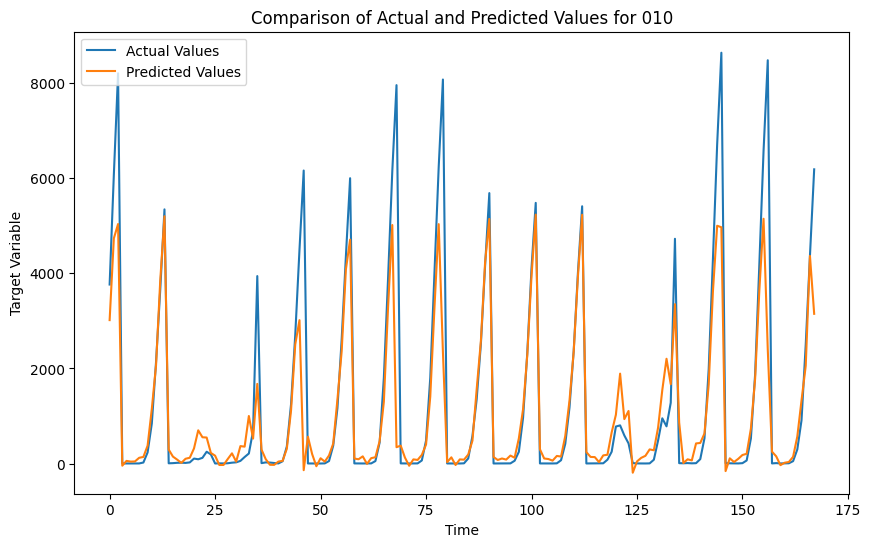

6/6 [==============================] - 0s 7ms/step
{'group': (0, 0, 1), 'r2': 0.6495113449535812, 'mse': 4090.0855903348574, 'rmse': 63.95377698255872, 'mae': 25.697353299920582}
{'group': (0, 1, 0), 'r2': 0.6818191861444658, 'mse': 180164.42738307462, 'rmse': 424.4578040077419, 'mae': 172.30040628936177}
{'group': (0, 1, 1), 'r2': 0.5206574259182031, 'mse': 53258.305801620045, 'rmse': 230.7776111359593, 'mae': 87.73261241808392}
{'group': (0, 2, 1), 'r2': 0.8692724021386904, 'mse': 19.250354886509616, 'rmse': 4.3875226365808775, 'mae': 2.3691888909424392}
{'group': (0, 3, 0), 'r2': 0.5731344919230292, 'mse': 2812662.5170924217, 'rmse': 1677.099435660397, 'mae': 665.5877618690445}
{'group': (0, 3, 1), 'r2': 0.7110708447155554, 'mse': 1391978.03673639, 'rmse': 1179.8211884588231, 'mae': 471.5787190924826}
{'group': (1, 1, 0), 'r2': 0.870327906357944, 'mse': 113.94284142919977, 'rmse': 10.674401221108367, 'mae': 4.546082382031981}


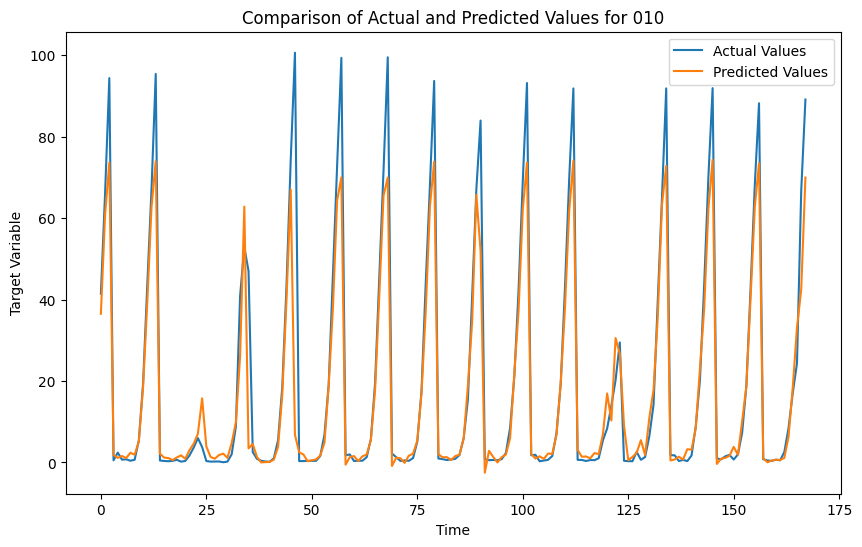

6/6 [==============================] - 0s 10ms/step
{'group': (0, 0, 1), 'r2': 0.6495113449535812, 'mse': 4090.0855903348574, 'rmse': 63.95377698255872, 'mae': 25.697353299920582}
{'group': (0, 1, 0), 'r2': 0.6818191861444658, 'mse': 180164.42738307462, 'rmse': 424.4578040077419, 'mae': 172.30040628936177}
{'group': (0, 1, 1), 'r2': 0.5206574259182031, 'mse': 53258.305801620045, 'rmse': 230.7776111359593, 'mae': 87.73261241808392}
{'group': (0, 2, 1), 'r2': 0.8692724021386904, 'mse': 19.250354886509616, 'rmse': 4.3875226365808775, 'mae': 2.3691888909424392}
{'group': (0, 3, 0), 'r2': 0.5731344919230292, 'mse': 2812662.5170924217, 'rmse': 1677.099435660397, 'mae': 665.5877618690445}
{'group': (0, 3, 1), 'r2': 0.7110708447155554, 'mse': 1391978.03673639, 'rmse': 1179.8211884588231, 'mae': 471.5787190924826}
{'group': (1, 1, 0), 'r2': 0.870327906357944, 'mse': 113.94284142919977, 'rmse': 10.674401221108367, 'mae': 4.546082382031981}
{'group': (1, 3, 0), 'r2': 0.962539964771558, 'mse': 382

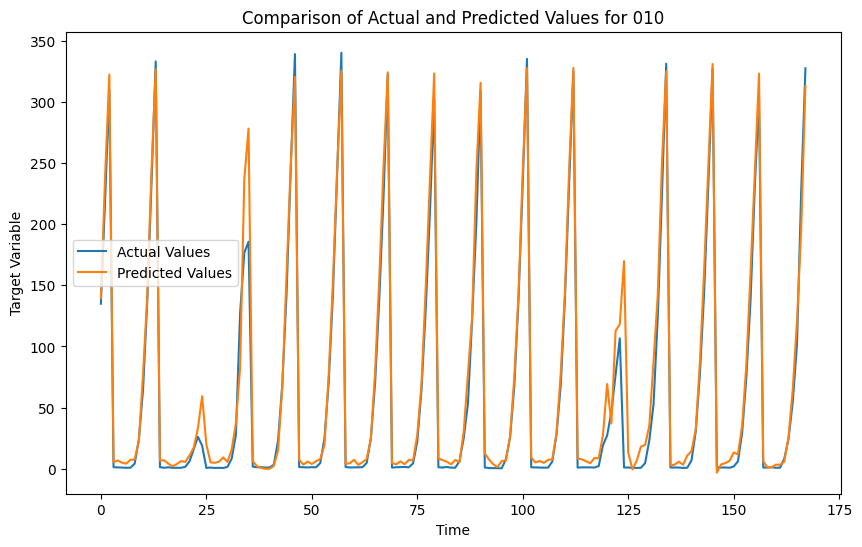

6/6 [==============================] - 0s 8ms/step
{'group': (0, 0, 1), 'r2': 0.6495113449535812, 'mse': 4090.0855903348574, 'rmse': 63.95377698255872, 'mae': 25.697353299920582}
{'group': (0, 1, 0), 'r2': 0.6818191861444658, 'mse': 180164.42738307462, 'rmse': 424.4578040077419, 'mae': 172.30040628936177}
{'group': (0, 1, 1), 'r2': 0.5206574259182031, 'mse': 53258.305801620045, 'rmse': 230.7776111359593, 'mae': 87.73261241808392}
{'group': (0, 2, 1), 'r2': 0.8692724021386904, 'mse': 19.250354886509616, 'rmse': 4.3875226365808775, 'mae': 2.3691888909424392}
{'group': (0, 3, 0), 'r2': 0.5731344919230292, 'mse': 2812662.5170924217, 'rmse': 1677.099435660397, 'mae': 665.5877618690445}
{'group': (0, 3, 1), 'r2': 0.7110708447155554, 'mse': 1391978.03673639, 'rmse': 1179.8211884588231, 'mae': 471.5787190924826}
{'group': (1, 1, 0), 'r2': 0.870327906357944, 'mse': 113.94284142919977, 'rmse': 10.674401221108367, 'mae': 4.546082382031981}
{'group': (1, 3, 0), 'r2': 0.962539964771558, 'mse': 382.

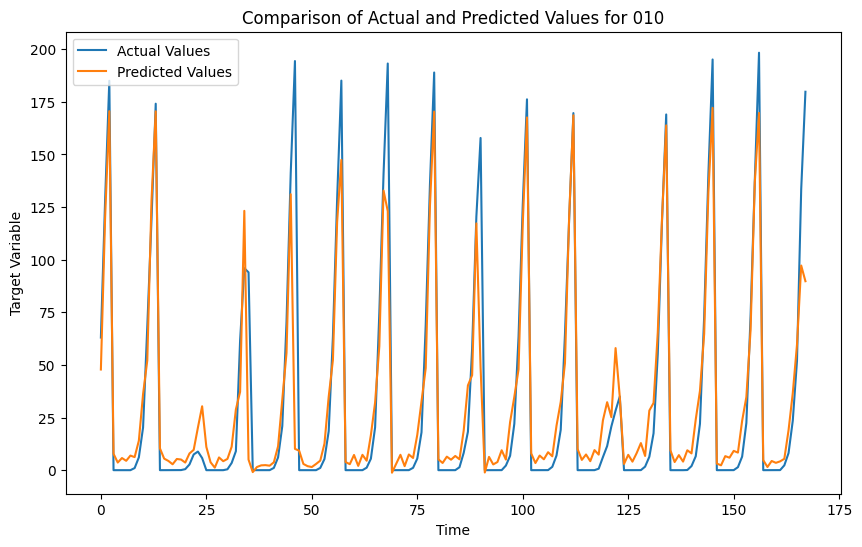

6/6 [==============================] - 0s 9ms/step
{'group': (0, 0, 1), 'r2': 0.6495113449535812, 'mse': 4090.0855903348574, 'rmse': 63.95377698255872, 'mae': 25.697353299920582}
{'group': (0, 1, 0), 'r2': 0.6818191861444658, 'mse': 180164.42738307462, 'rmse': 424.4578040077419, 'mae': 172.30040628936177}
{'group': (0, 1, 1), 'r2': 0.5206574259182031, 'mse': 53258.305801620045, 'rmse': 230.7776111359593, 'mae': 87.73261241808392}
{'group': (0, 2, 1), 'r2': 0.8692724021386904, 'mse': 19.250354886509616, 'rmse': 4.3875226365808775, 'mae': 2.3691888909424392}
{'group': (0, 3, 0), 'r2': 0.5731344919230292, 'mse': 2812662.5170924217, 'rmse': 1677.099435660397, 'mae': 665.5877618690445}
{'group': (0, 3, 1), 'r2': 0.7110708447155554, 'mse': 1391978.03673639, 'rmse': 1179.8211884588231, 'mae': 471.5787190924826}
{'group': (1, 1, 0), 'r2': 0.870327906357944, 'mse': 113.94284142919977, 'rmse': 10.674401221108367, 'mae': 4.546082382031981}
{'group': (1, 3, 0), 'r2': 0.962539964771558, 'mse': 382.

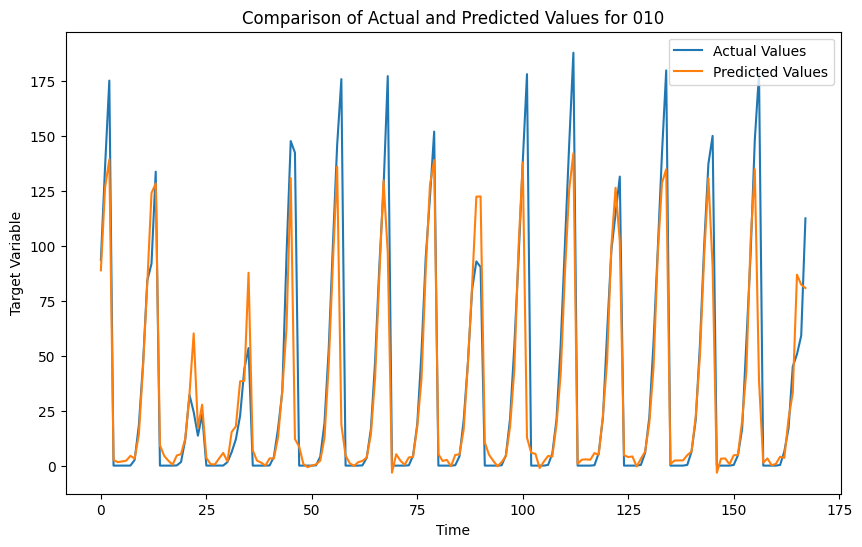

6/6 [==============================] - 0s 8ms/step
{'group': (0, 0, 1), 'r2': 0.6495113449535812, 'mse': 4090.0855903348574, 'rmse': 63.95377698255872, 'mae': 25.697353299920582}
{'group': (0, 1, 0), 'r2': 0.6818191861444658, 'mse': 180164.42738307462, 'rmse': 424.4578040077419, 'mae': 172.30040628936177}
{'group': (0, 1, 1), 'r2': 0.5206574259182031, 'mse': 53258.305801620045, 'rmse': 230.7776111359593, 'mae': 87.73261241808392}
{'group': (0, 2, 1), 'r2': 0.8692724021386904, 'mse': 19.250354886509616, 'rmse': 4.3875226365808775, 'mae': 2.3691888909424392}
{'group': (0, 3, 0), 'r2': 0.5731344919230292, 'mse': 2812662.5170924217, 'rmse': 1677.099435660397, 'mae': 665.5877618690445}
{'group': (0, 3, 1), 'r2': 0.7110708447155554, 'mse': 1391978.03673639, 'rmse': 1179.8211884588231, 'mae': 471.5787190924826}
{'group': (1, 1, 0), 'r2': 0.870327906357944, 'mse': 113.94284142919977, 'rmse': 10.674401221108367, 'mae': 4.546082382031981}
{'group': (1, 3, 0), 'r2': 0.962539964771558, 'mse': 382.

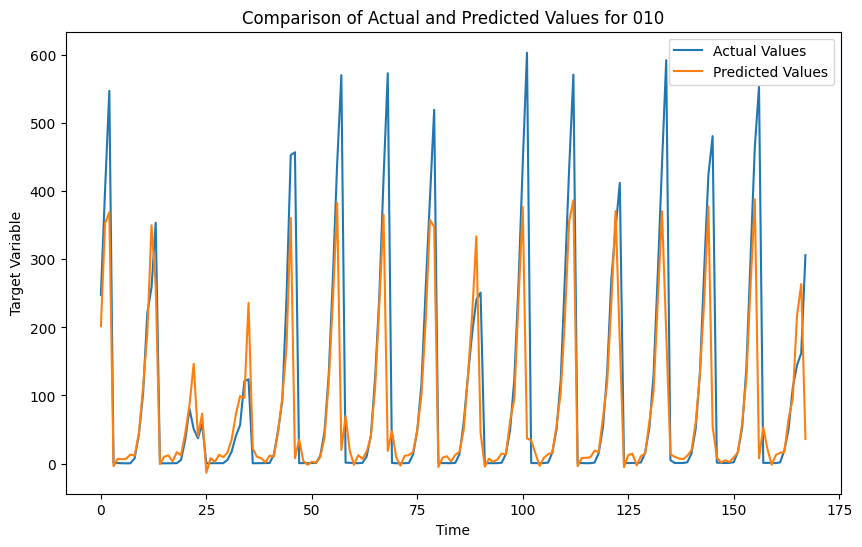

6/6 [==============================] - 0s 8ms/step
{'group': (0, 0, 1), 'r2': 0.6495113449535812, 'mse': 4090.0855903348574, 'rmse': 63.95377698255872, 'mae': 25.697353299920582}
{'group': (0, 1, 0), 'r2': 0.6818191861444658, 'mse': 180164.42738307462, 'rmse': 424.4578040077419, 'mae': 172.30040628936177}
{'group': (0, 1, 1), 'r2': 0.5206574259182031, 'mse': 53258.305801620045, 'rmse': 230.7776111359593, 'mae': 87.73261241808392}
{'group': (0, 2, 1), 'r2': 0.8692724021386904, 'mse': 19.250354886509616, 'rmse': 4.3875226365808775, 'mae': 2.3691888909424392}
{'group': (0, 3, 0), 'r2': 0.5731344919230292, 'mse': 2812662.5170924217, 'rmse': 1677.099435660397, 'mae': 665.5877618690445}
{'group': (0, 3, 1), 'r2': 0.7110708447155554, 'mse': 1391978.03673639, 'rmse': 1179.8211884588231, 'mae': 471.5787190924826}
{'group': (1, 1, 0), 'r2': 0.870327906357944, 'mse': 113.94284142919977, 'rmse': 10.674401221108367, 'mae': 4.546082382031981}
{'group': (1, 3, 0), 'r2': 0.962539964771558, 'mse': 382.

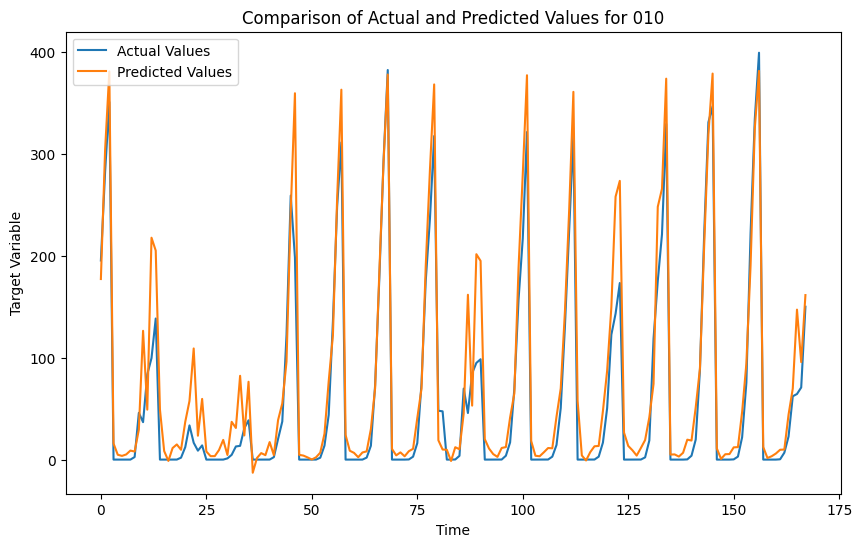

6/6 [==============================] - 0s 7ms/step
{'group': (0, 0, 1), 'r2': 0.6495113449535812, 'mse': 4090.0855903348574, 'rmse': 63.95377698255872, 'mae': 25.697353299920582}
{'group': (0, 1, 0), 'r2': 0.6818191861444658, 'mse': 180164.42738307462, 'rmse': 424.4578040077419, 'mae': 172.30040628936177}
{'group': (0, 1, 1), 'r2': 0.5206574259182031, 'mse': 53258.305801620045, 'rmse': 230.7776111359593, 'mae': 87.73261241808392}
{'group': (0, 2, 1), 'r2': 0.8692724021386904, 'mse': 19.250354886509616, 'rmse': 4.3875226365808775, 'mae': 2.3691888909424392}
{'group': (0, 3, 0), 'r2': 0.5731344919230292, 'mse': 2812662.5170924217, 'rmse': 1677.099435660397, 'mae': 665.5877618690445}
{'group': (0, 3, 1), 'r2': 0.7110708447155554, 'mse': 1391978.03673639, 'rmse': 1179.8211884588231, 'mae': 471.5787190924826}
{'group': (1, 1, 0), 'r2': 0.870327906357944, 'mse': 113.94284142919977, 'rmse': 10.674401221108367, 'mae': 4.546082382031981}
{'group': (1, 3, 0), 'r2': 0.962539964771558, 'mse': 382.

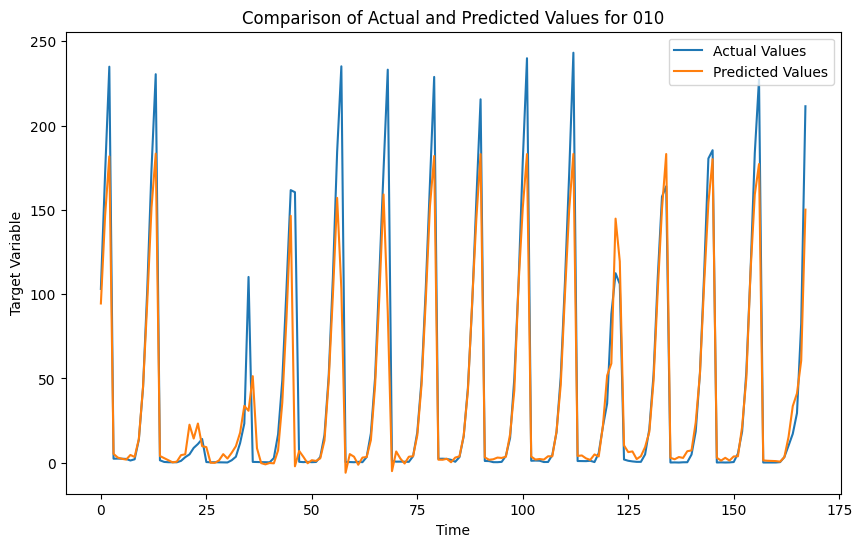

6/6 [==============================] - 0s 12ms/step
{'group': (0, 0, 1), 'r2': 0.6495113449535812, 'mse': 4090.0855903348574, 'rmse': 63.95377698255872, 'mae': 25.697353299920582}
{'group': (0, 1, 0), 'r2': 0.6818191861444658, 'mse': 180164.42738307462, 'rmse': 424.4578040077419, 'mae': 172.30040628936177}
{'group': (0, 1, 1), 'r2': 0.5206574259182031, 'mse': 53258.305801620045, 'rmse': 230.7776111359593, 'mae': 87.73261241808392}
{'group': (0, 2, 1), 'r2': 0.8692724021386904, 'mse': 19.250354886509616, 'rmse': 4.3875226365808775, 'mae': 2.3691888909424392}
{'group': (0, 3, 0), 'r2': 0.5731344919230292, 'mse': 2812662.5170924217, 'rmse': 1677.099435660397, 'mae': 665.5877618690445}
{'group': (0, 3, 1), 'r2': 0.7110708447155554, 'mse': 1391978.03673639, 'rmse': 1179.8211884588231, 'mae': 471.5787190924826}
{'group': (1, 1, 0), 'r2': 0.870327906357944, 'mse': 113.94284142919977, 'rmse': 10.674401221108367, 'mae': 4.546082382031981}
{'group': (1, 3, 0), 'r2': 0.962539964771558, 'mse': 382

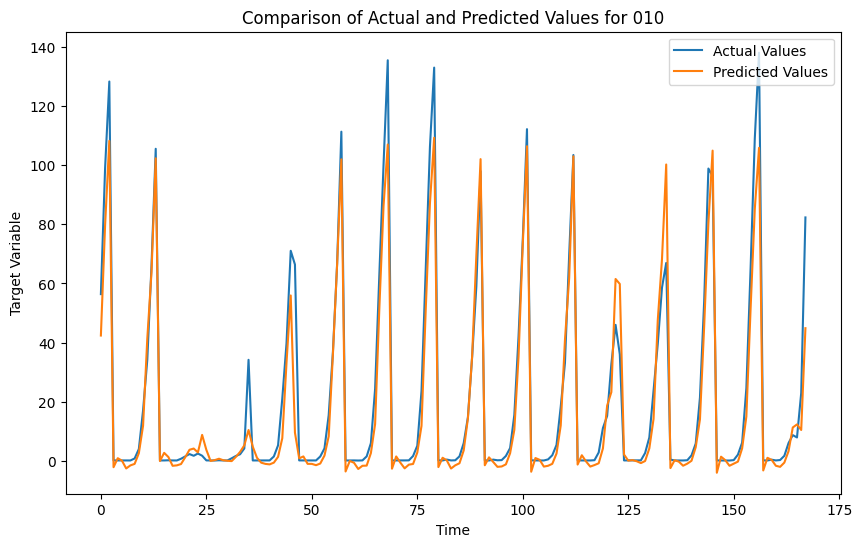

6/6 [==============================] - 0s 8ms/step
{'group': (0, 0, 1), 'r2': 0.6495113449535812, 'mse': 4090.0855903348574, 'rmse': 63.95377698255872, 'mae': 25.697353299920582}
{'group': (0, 1, 0), 'r2': 0.6818191861444658, 'mse': 180164.42738307462, 'rmse': 424.4578040077419, 'mae': 172.30040628936177}
{'group': (0, 1, 1), 'r2': 0.5206574259182031, 'mse': 53258.305801620045, 'rmse': 230.7776111359593, 'mae': 87.73261241808392}
{'group': (0, 2, 1), 'r2': 0.8692724021386904, 'mse': 19.250354886509616, 'rmse': 4.3875226365808775, 'mae': 2.3691888909424392}
{'group': (0, 3, 0), 'r2': 0.5731344919230292, 'mse': 2812662.5170924217, 'rmse': 1677.099435660397, 'mae': 665.5877618690445}
{'group': (0, 3, 1), 'r2': 0.7110708447155554, 'mse': 1391978.03673639, 'rmse': 1179.8211884588231, 'mae': 471.5787190924826}
{'group': (1, 1, 0), 'r2': 0.870327906357944, 'mse': 113.94284142919977, 'rmse': 10.674401221108367, 'mae': 4.546082382031981}
{'group': (1, 3, 0), 'r2': 0.962539964771558, 'mse': 382.

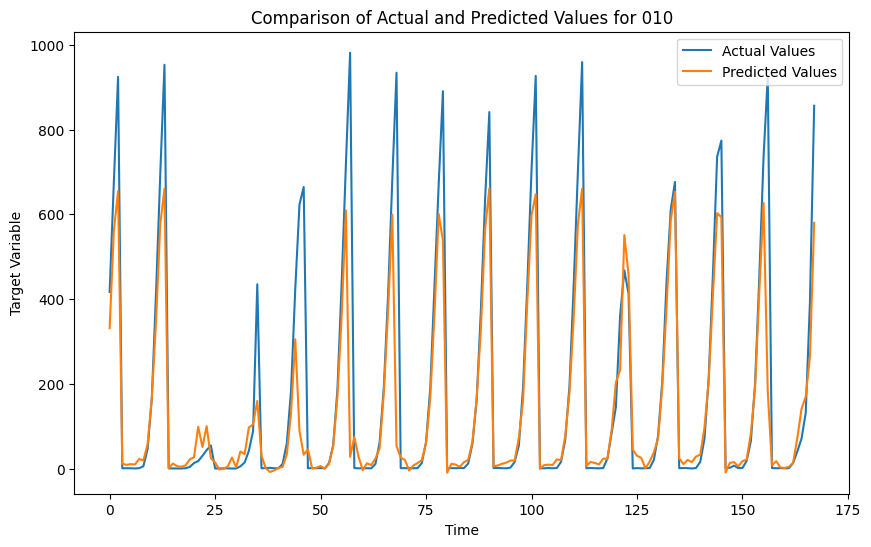

6/6 [==============================] - 0s 10ms/step
{'group': (0, 0, 1), 'r2': 0.6495113449535812, 'mse': 4090.0855903348574, 'rmse': 63.95377698255872, 'mae': 25.697353299920582}
{'group': (0, 1, 0), 'r2': 0.6818191861444658, 'mse': 180164.42738307462, 'rmse': 424.4578040077419, 'mae': 172.30040628936177}
{'group': (0, 1, 1), 'r2': 0.5206574259182031, 'mse': 53258.305801620045, 'rmse': 230.7776111359593, 'mae': 87.73261241808392}
{'group': (0, 2, 1), 'r2': 0.8692724021386904, 'mse': 19.250354886509616, 'rmse': 4.3875226365808775, 'mae': 2.3691888909424392}
{'group': (0, 3, 0), 'r2': 0.5731344919230292, 'mse': 2812662.5170924217, 'rmse': 1677.099435660397, 'mae': 665.5877618690445}
{'group': (0, 3, 1), 'r2': 0.7110708447155554, 'mse': 1391978.03673639, 'rmse': 1179.8211884588231, 'mae': 471.5787190924826}
{'group': (1, 1, 0), 'r2': 0.870327906357944, 'mse': 113.94284142919977, 'rmse': 10.674401221108367, 'mae': 4.546082382031981}
{'group': (1, 3, 0), 'r2': 0.962539964771558, 'mse': 382

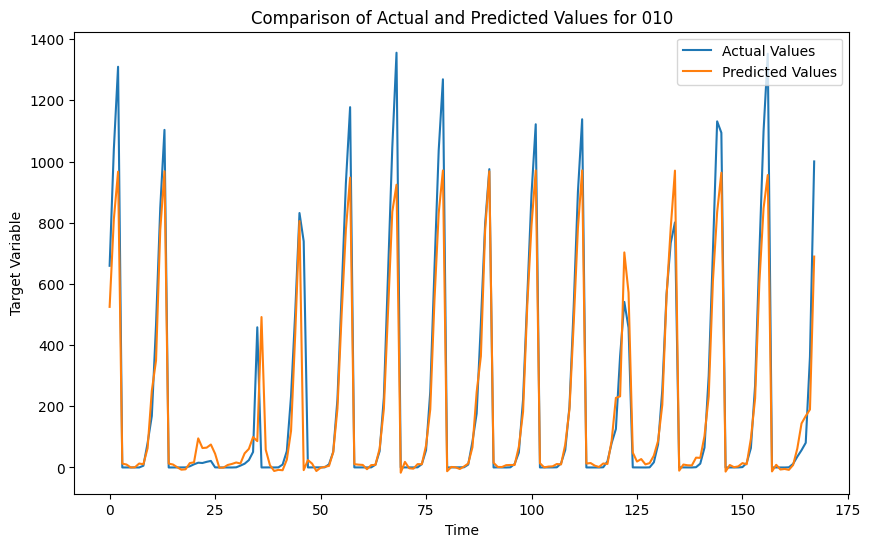

6/6 [==============================] - 0s 9ms/step
{'group': (0, 0, 1), 'r2': 0.6495113449535812, 'mse': 4090.0855903348574, 'rmse': 63.95377698255872, 'mae': 25.697353299920582}
{'group': (0, 1, 0), 'r2': 0.6818191861444658, 'mse': 180164.42738307462, 'rmse': 424.4578040077419, 'mae': 172.30040628936177}
{'group': (0, 1, 1), 'r2': 0.5206574259182031, 'mse': 53258.305801620045, 'rmse': 230.7776111359593, 'mae': 87.73261241808392}
{'group': (0, 2, 1), 'r2': 0.8692724021386904, 'mse': 19.250354886509616, 'rmse': 4.3875226365808775, 'mae': 2.3691888909424392}
{'group': (0, 3, 0), 'r2': 0.5731344919230292, 'mse': 2812662.5170924217, 'rmse': 1677.099435660397, 'mae': 665.5877618690445}
{'group': (0, 3, 1), 'r2': 0.7110708447155554, 'mse': 1391978.03673639, 'rmse': 1179.8211884588231, 'mae': 471.5787190924826}
{'group': (1, 1, 0), 'r2': 0.870327906357944, 'mse': 113.94284142919977, 'rmse': 10.674401221108367, 'mae': 4.546082382031981}
{'group': (1, 3, 0), 'r2': 0.962539964771558, 'mse': 382.

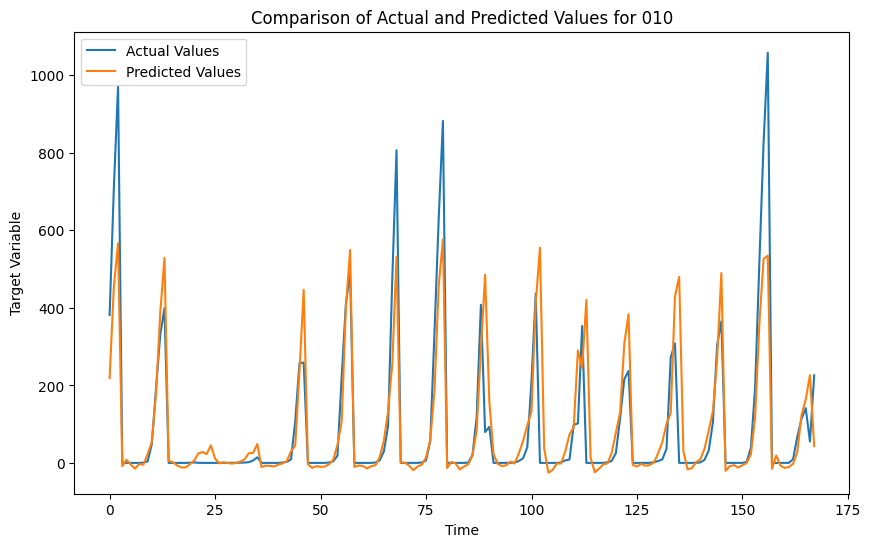

6/6 [==============================] - 0s 9ms/step
{'group': (0, 0, 1), 'r2': 0.6495113449535812, 'mse': 4090.0855903348574, 'rmse': 63.95377698255872, 'mae': 25.697353299920582}
{'group': (0, 1, 0), 'r2': 0.6818191861444658, 'mse': 180164.42738307462, 'rmse': 424.4578040077419, 'mae': 172.30040628936177}
{'group': (0, 1, 1), 'r2': 0.5206574259182031, 'mse': 53258.305801620045, 'rmse': 230.7776111359593, 'mae': 87.73261241808392}
{'group': (0, 2, 1), 'r2': 0.8692724021386904, 'mse': 19.250354886509616, 'rmse': 4.3875226365808775, 'mae': 2.3691888909424392}
{'group': (0, 3, 0), 'r2': 0.5731344919230292, 'mse': 2812662.5170924217, 'rmse': 1677.099435660397, 'mae': 665.5877618690445}
{'group': (0, 3, 1), 'r2': 0.7110708447155554, 'mse': 1391978.03673639, 'rmse': 1179.8211884588231, 'mae': 471.5787190924826}
{'group': (1, 1, 0), 'r2': 0.870327906357944, 'mse': 113.94284142919977, 'rmse': 10.674401221108367, 'mae': 4.546082382031981}
{'group': (1, 3, 0), 'r2': 0.962539964771558, 'mse': 382.

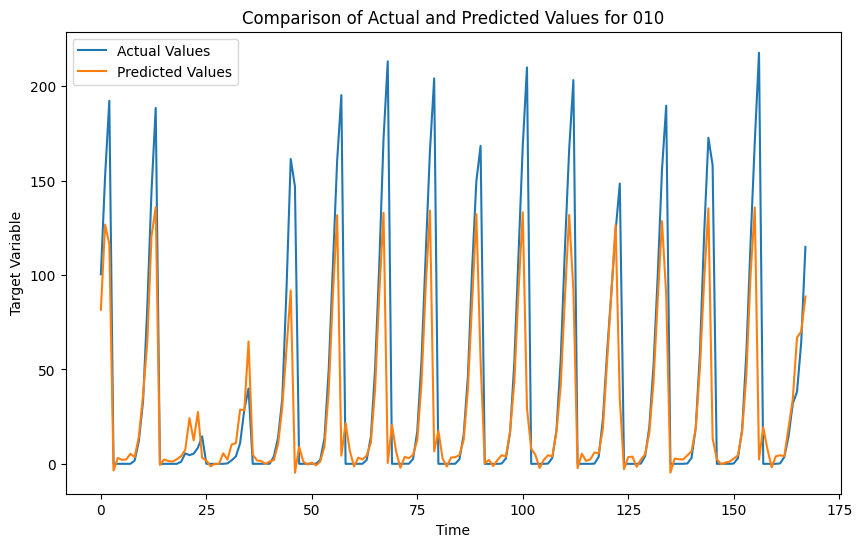

6/6 [==============================] - 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.6495113449535812, 'mse': 4090.0855903348574, 'rmse': 63.95377698255872, 'mae': 25.697353299920582}
{'group': (0, 1, 0), 'r2': 0.6818191861444658, 'mse': 180164.42738307462, 'rmse': 424.4578040077419, 'mae': 172.30040628936177}
{'group': (0, 1, 1), 'r2': 0.5206574259182031, 'mse': 53258.305801620045, 'rmse': 230.7776111359593, 'mae': 87.73261241808392}
{'group': (0, 2, 1), 'r2': 0.8692724021386904, 'mse': 19.250354886509616, 'rmse': 4.3875226365808775, 'mae': 2.3691888909424392}
{'group': (0, 3, 0), 'r2': 0.5731344919230292, 'mse': 2812662.5170924217, 'rmse': 1677.099435660397, 'mae': 665.5877618690445}
{'group': (0, 3, 1), 'r2': 0.7110708447155554, 'mse': 1391978.03673639, 'rmse': 1179.8211884588231, 'mae': 471.5787190924826}
{'group': (1, 1, 0), 'r2': 0.870327906357944, 'mse': 113.94284142919977, 'rmse': 10.674401221108367, 'mae': 4.546082382031981}
{'group': (1, 3, 0), 'r2': 0.962539964771558, 'mse': 382

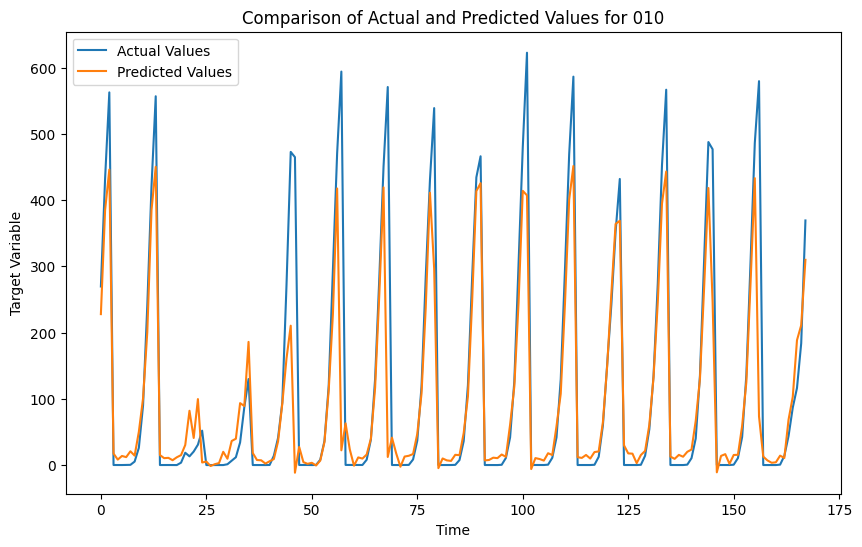

6/6 [==============================] - 0s 20ms/step
{'group': (0, 0, 1), 'r2': 0.6495113449535812, 'mse': 4090.0855903348574, 'rmse': 63.95377698255872, 'mae': 25.697353299920582}
{'group': (0, 1, 0), 'r2': 0.6818191861444658, 'mse': 180164.42738307462, 'rmse': 424.4578040077419, 'mae': 172.30040628936177}
{'group': (0, 1, 1), 'r2': 0.5206574259182031, 'mse': 53258.305801620045, 'rmse': 230.7776111359593, 'mae': 87.73261241808392}
{'group': (0, 2, 1), 'r2': 0.8692724021386904, 'mse': 19.250354886509616, 'rmse': 4.3875226365808775, 'mae': 2.3691888909424392}
{'group': (0, 3, 0), 'r2': 0.5731344919230292, 'mse': 2812662.5170924217, 'rmse': 1677.099435660397, 'mae': 665.5877618690445}
{'group': (0, 3, 1), 'r2': 0.7110708447155554, 'mse': 1391978.03673639, 'rmse': 1179.8211884588231, 'mae': 471.5787190924826}
{'group': (1, 1, 0), 'r2': 0.870327906357944, 'mse': 113.94284142919977, 'rmse': 10.674401221108367, 'mae': 4.546082382031981}
{'group': (1, 3, 0), 'r2': 0.962539964771558, 'mse': 382

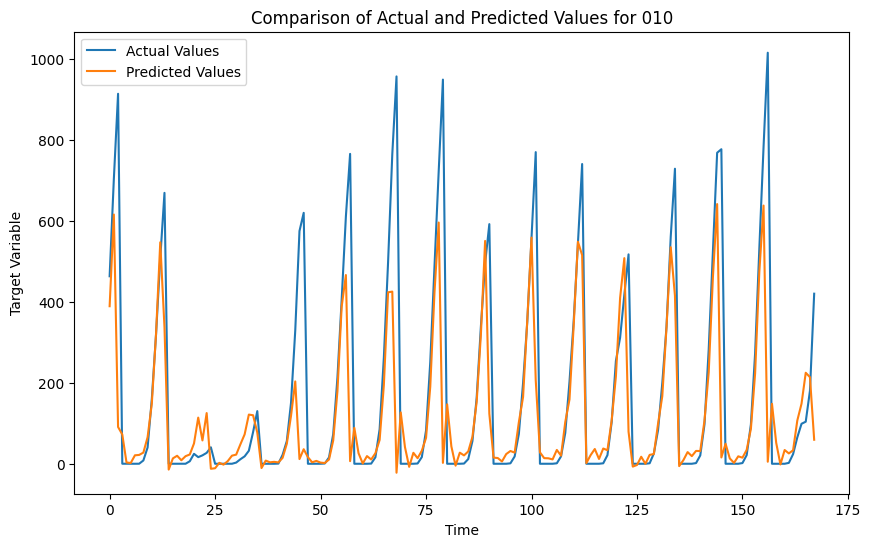

6/6 [==============================] - 0s 9ms/step
{'group': (0, 0, 1), 'r2': 0.6495113449535812, 'mse': 4090.0855903348574, 'rmse': 63.95377698255872, 'mae': 25.697353299920582}
{'group': (0, 1, 0), 'r2': 0.6818191861444658, 'mse': 180164.42738307462, 'rmse': 424.4578040077419, 'mae': 172.30040628936177}
{'group': (0, 1, 1), 'r2': 0.5206574259182031, 'mse': 53258.305801620045, 'rmse': 230.7776111359593, 'mae': 87.73261241808392}
{'group': (0, 2, 1), 'r2': 0.8692724021386904, 'mse': 19.250354886509616, 'rmse': 4.3875226365808775, 'mae': 2.3691888909424392}
{'group': (0, 3, 0), 'r2': 0.5731344919230292, 'mse': 2812662.5170924217, 'rmse': 1677.099435660397, 'mae': 665.5877618690445}
{'group': (0, 3, 1), 'r2': 0.7110708447155554, 'mse': 1391978.03673639, 'rmse': 1179.8211884588231, 'mae': 471.5787190924826}
{'group': (1, 1, 0), 'r2': 0.870327906357944, 'mse': 113.94284142919977, 'rmse': 10.674401221108367, 'mae': 4.546082382031981}
{'group': (1, 3, 0), 'r2': 0.962539964771558, 'mse': 382.

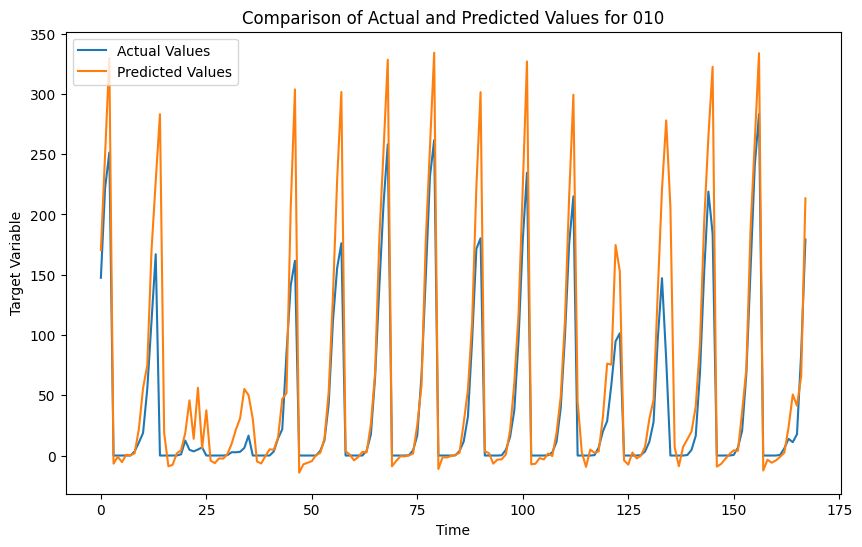

6/6 [==============================] - 0s 8ms/step
{'group': (0, 0, 1), 'r2': 0.6495113449535812, 'mse': 4090.0855903348574, 'rmse': 63.95377698255872, 'mae': 25.697353299920582}
{'group': (0, 1, 0), 'r2': 0.6818191861444658, 'mse': 180164.42738307462, 'rmse': 424.4578040077419, 'mae': 172.30040628936177}
{'group': (0, 1, 1), 'r2': 0.5206574259182031, 'mse': 53258.305801620045, 'rmse': 230.7776111359593, 'mae': 87.73261241808392}
{'group': (0, 2, 1), 'r2': 0.8692724021386904, 'mse': 19.250354886509616, 'rmse': 4.3875226365808775, 'mae': 2.3691888909424392}
{'group': (0, 3, 0), 'r2': 0.5731344919230292, 'mse': 2812662.5170924217, 'rmse': 1677.099435660397, 'mae': 665.5877618690445}
{'group': (0, 3, 1), 'r2': 0.7110708447155554, 'mse': 1391978.03673639, 'rmse': 1179.8211884588231, 'mae': 471.5787190924826}
{'group': (1, 1, 0), 'r2': 0.870327906357944, 'mse': 113.94284142919977, 'rmse': 10.674401221108367, 'mae': 4.546082382031981}
{'group': (1, 3, 0), 'r2': 0.962539964771558, 'mse': 382.

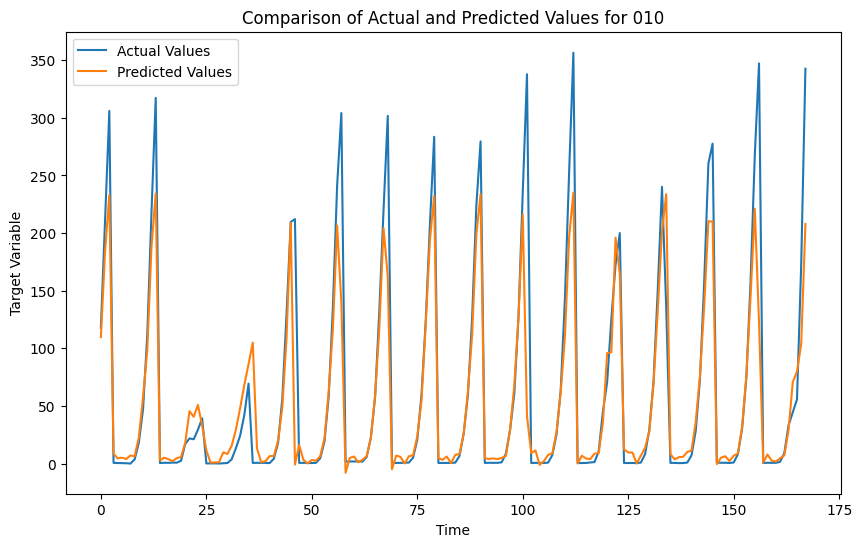

6/6 [==============================] - 0s 9ms/step
{'group': (0, 0, 1), 'r2': 0.6495113449535812, 'mse': 4090.0855903348574, 'rmse': 63.95377698255872, 'mae': 25.697353299920582}
{'group': (0, 1, 0), 'r2': 0.6818191861444658, 'mse': 180164.42738307462, 'rmse': 424.4578040077419, 'mae': 172.30040628936177}
{'group': (0, 1, 1), 'r2': 0.5206574259182031, 'mse': 53258.305801620045, 'rmse': 230.7776111359593, 'mae': 87.73261241808392}
{'group': (0, 2, 1), 'r2': 0.8692724021386904, 'mse': 19.250354886509616, 'rmse': 4.3875226365808775, 'mae': 2.3691888909424392}
{'group': (0, 3, 0), 'r2': 0.5731344919230292, 'mse': 2812662.5170924217, 'rmse': 1677.099435660397, 'mae': 665.5877618690445}
{'group': (0, 3, 1), 'r2': 0.7110708447155554, 'mse': 1391978.03673639, 'rmse': 1179.8211884588231, 'mae': 471.5787190924826}
{'group': (1, 1, 0), 'r2': 0.870327906357944, 'mse': 113.94284142919977, 'rmse': 10.674401221108367, 'mae': 4.546082382031981}
{'group': (1, 3, 0), 'r2': 0.962539964771558, 'mse': 382.

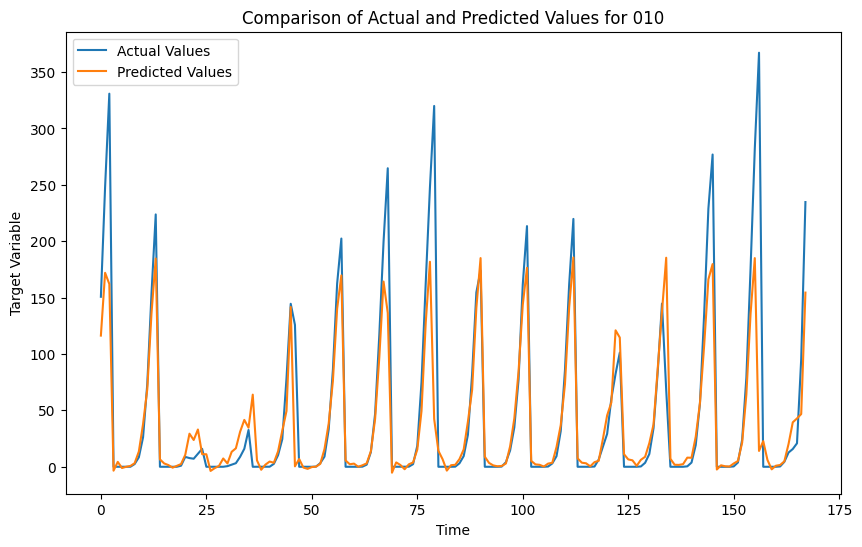

6/6 [==============================] - 0s 7ms/step
{'group': (0, 0, 1), 'r2': 0.6495113449535812, 'mse': 4090.0855903348574, 'rmse': 63.95377698255872, 'mae': 25.697353299920582}
{'group': (0, 1, 0), 'r2': 0.6818191861444658, 'mse': 180164.42738307462, 'rmse': 424.4578040077419, 'mae': 172.30040628936177}
{'group': (0, 1, 1), 'r2': 0.5206574259182031, 'mse': 53258.305801620045, 'rmse': 230.7776111359593, 'mae': 87.73261241808392}
{'group': (0, 2, 1), 'r2': 0.8692724021386904, 'mse': 19.250354886509616, 'rmse': 4.3875226365808775, 'mae': 2.3691888909424392}
{'group': (0, 3, 0), 'r2': 0.5731344919230292, 'mse': 2812662.5170924217, 'rmse': 1677.099435660397, 'mae': 665.5877618690445}
{'group': (0, 3, 1), 'r2': 0.7110708447155554, 'mse': 1391978.03673639, 'rmse': 1179.8211884588231, 'mae': 471.5787190924826}
{'group': (1, 1, 0), 'r2': 0.870327906357944, 'mse': 113.94284142919977, 'rmse': 10.674401221108367, 'mae': 4.546082382031981}
{'group': (1, 3, 0), 'r2': 0.962539964771558, 'mse': 382.

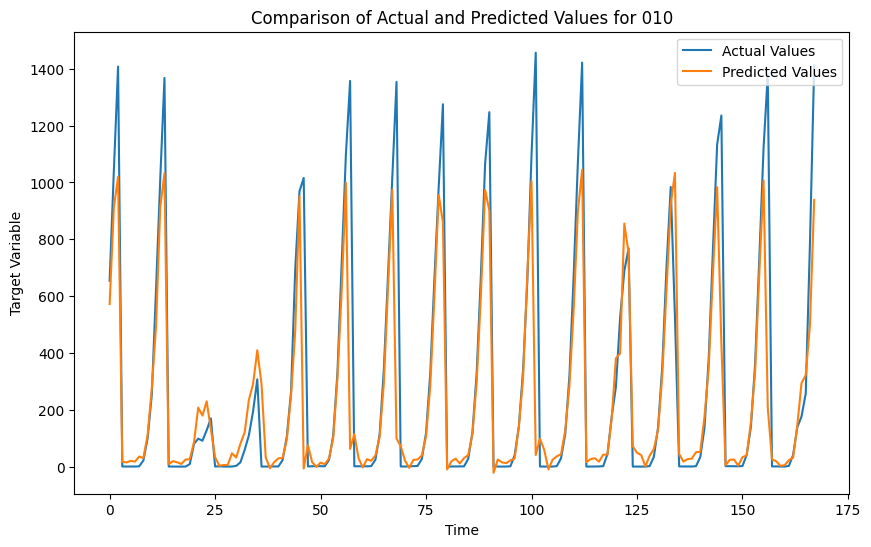

6/6 [==============================] - 0s 10ms/step
{'group': (0, 0, 1), 'r2': 0.6495113449535812, 'mse': 4090.0855903348574, 'rmse': 63.95377698255872, 'mae': 25.697353299920582}
{'group': (0, 1, 0), 'r2': 0.6818191861444658, 'mse': 180164.42738307462, 'rmse': 424.4578040077419, 'mae': 172.30040628936177}
{'group': (0, 1, 1), 'r2': 0.5206574259182031, 'mse': 53258.305801620045, 'rmse': 230.7776111359593, 'mae': 87.73261241808392}
{'group': (0, 2, 1), 'r2': 0.8692724021386904, 'mse': 19.250354886509616, 'rmse': 4.3875226365808775, 'mae': 2.3691888909424392}
{'group': (0, 3, 0), 'r2': 0.5731344919230292, 'mse': 2812662.5170924217, 'rmse': 1677.099435660397, 'mae': 665.5877618690445}
{'group': (0, 3, 1), 'r2': 0.7110708447155554, 'mse': 1391978.03673639, 'rmse': 1179.8211884588231, 'mae': 471.5787190924826}
{'group': (1, 1, 0), 'r2': 0.870327906357944, 'mse': 113.94284142919977, 'rmse': 10.674401221108367, 'mae': 4.546082382031981}
{'group': (1, 3, 0), 'r2': 0.962539964771558, 'mse': 382

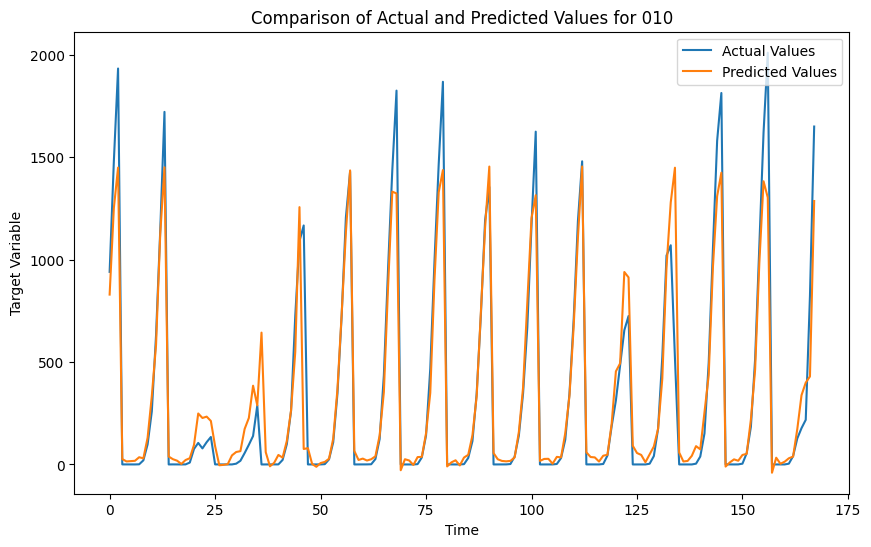

6/6 [==============================] - 0s 7ms/step
{'group': (0, 0, 1), 'r2': 0.6495113449535812, 'mse': 4090.0855903348574, 'rmse': 63.95377698255872, 'mae': 25.697353299920582}
{'group': (0, 1, 0), 'r2': 0.6818191861444658, 'mse': 180164.42738307462, 'rmse': 424.4578040077419, 'mae': 172.30040628936177}
{'group': (0, 1, 1), 'r2': 0.5206574259182031, 'mse': 53258.305801620045, 'rmse': 230.7776111359593, 'mae': 87.73261241808392}
{'group': (0, 2, 1), 'r2': 0.8692724021386904, 'mse': 19.250354886509616, 'rmse': 4.3875226365808775, 'mae': 2.3691888909424392}
{'group': (0, 3, 0), 'r2': 0.5731344919230292, 'mse': 2812662.5170924217, 'rmse': 1677.099435660397, 'mae': 665.5877618690445}
{'group': (0, 3, 1), 'r2': 0.7110708447155554, 'mse': 1391978.03673639, 'rmse': 1179.8211884588231, 'mae': 471.5787190924826}
{'group': (1, 1, 0), 'r2': 0.870327906357944, 'mse': 113.94284142919977, 'rmse': 10.674401221108367, 'mae': 4.546082382031981}
{'group': (1, 3, 0), 'r2': 0.962539964771558, 'mse': 382.

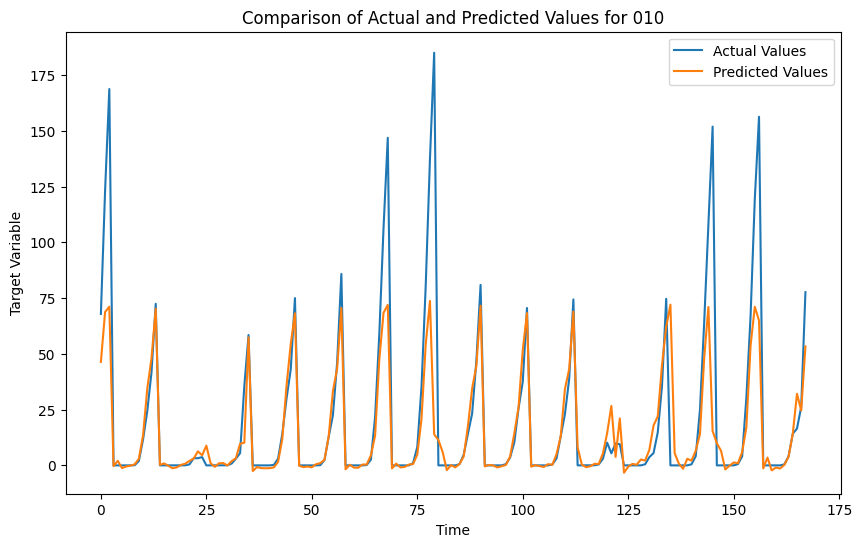

6/6 [==============================] - 0s 8ms/step
{'group': (0, 0, 1), 'r2': 0.6495113449535812, 'mse': 4090.0855903348574, 'rmse': 63.95377698255872, 'mae': 25.697353299920582}
{'group': (0, 1, 0), 'r2': 0.6818191861444658, 'mse': 180164.42738307462, 'rmse': 424.4578040077419, 'mae': 172.30040628936177}
{'group': (0, 1, 1), 'r2': 0.5206574259182031, 'mse': 53258.305801620045, 'rmse': 230.7776111359593, 'mae': 87.73261241808392}
{'group': (0, 2, 1), 'r2': 0.8692724021386904, 'mse': 19.250354886509616, 'rmse': 4.3875226365808775, 'mae': 2.3691888909424392}
{'group': (0, 3, 0), 'r2': 0.5731344919230292, 'mse': 2812662.5170924217, 'rmse': 1677.099435660397, 'mae': 665.5877618690445}
{'group': (0, 3, 1), 'r2': 0.7110708447155554, 'mse': 1391978.03673639, 'rmse': 1179.8211884588231, 'mae': 471.5787190924826}
{'group': (1, 1, 0), 'r2': 0.870327906357944, 'mse': 113.94284142919977, 'rmse': 10.674401221108367, 'mae': 4.546082382031981}
{'group': (1, 3, 0), 'r2': 0.962539964771558, 'mse': 382.

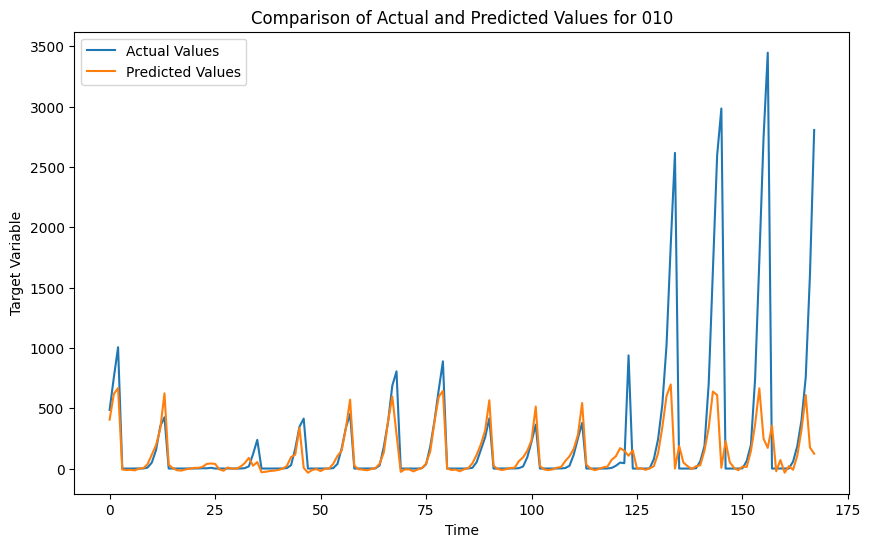

6/6 [==============================] - 0s 16ms/step
{'group': (0, 0, 1), 'r2': 0.6495113449535812, 'mse': 4090.0855903348574, 'rmse': 63.95377698255872, 'mae': 25.697353299920582}
{'group': (0, 1, 0), 'r2': 0.6818191861444658, 'mse': 180164.42738307462, 'rmse': 424.4578040077419, 'mae': 172.30040628936177}
{'group': (0, 1, 1), 'r2': 0.5206574259182031, 'mse': 53258.305801620045, 'rmse': 230.7776111359593, 'mae': 87.73261241808392}
{'group': (0, 2, 1), 'r2': 0.8692724021386904, 'mse': 19.250354886509616, 'rmse': 4.3875226365808775, 'mae': 2.3691888909424392}
{'group': (0, 3, 0), 'r2': 0.5731344919230292, 'mse': 2812662.5170924217, 'rmse': 1677.099435660397, 'mae': 665.5877618690445}
{'group': (0, 3, 1), 'r2': 0.7110708447155554, 'mse': 1391978.03673639, 'rmse': 1179.8211884588231, 'mae': 471.5787190924826}
{'group': (1, 1, 0), 'r2': 0.870327906357944, 'mse': 113.94284142919977, 'rmse': 10.674401221108367, 'mae': 4.546082382031981}
{'group': (1, 3, 0), 'r2': 0.962539964771558, 'mse': 382

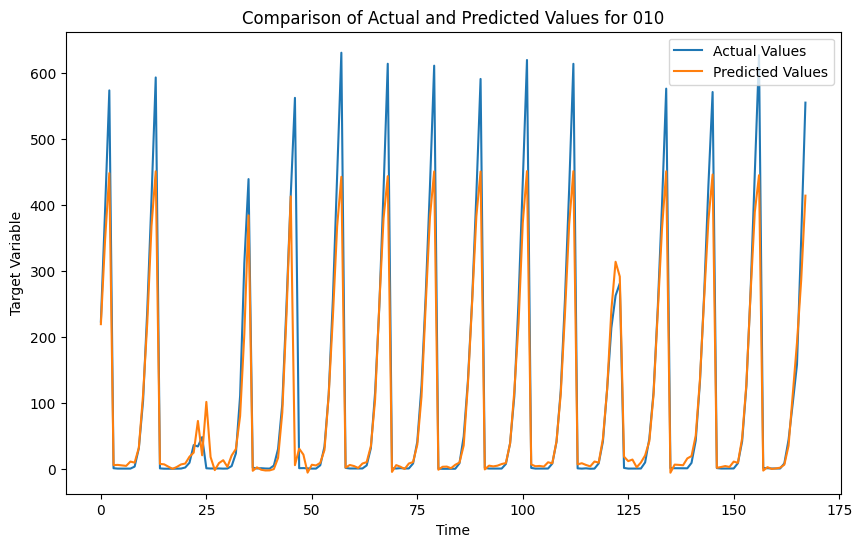

6/6 [==============================] - 0s 10ms/step
{'group': (0, 0, 1), 'r2': 0.6495113449535812, 'mse': 4090.0855903348574, 'rmse': 63.95377698255872, 'mae': 25.697353299920582}
{'group': (0, 1, 0), 'r2': 0.6818191861444658, 'mse': 180164.42738307462, 'rmse': 424.4578040077419, 'mae': 172.30040628936177}
{'group': (0, 1, 1), 'r2': 0.5206574259182031, 'mse': 53258.305801620045, 'rmse': 230.7776111359593, 'mae': 87.73261241808392}
{'group': (0, 2, 1), 'r2': 0.8692724021386904, 'mse': 19.250354886509616, 'rmse': 4.3875226365808775, 'mae': 2.3691888909424392}
{'group': (0, 3, 0), 'r2': 0.5731344919230292, 'mse': 2812662.5170924217, 'rmse': 1677.099435660397, 'mae': 665.5877618690445}
{'group': (0, 3, 1), 'r2': 0.7110708447155554, 'mse': 1391978.03673639, 'rmse': 1179.8211884588231, 'mae': 471.5787190924826}
{'group': (1, 1, 0), 'r2': 0.870327906357944, 'mse': 113.94284142919977, 'rmse': 10.674401221108367, 'mae': 4.546082382031981}
{'group': (1, 3, 0), 'r2': 0.962539964771558, 'mse': 382

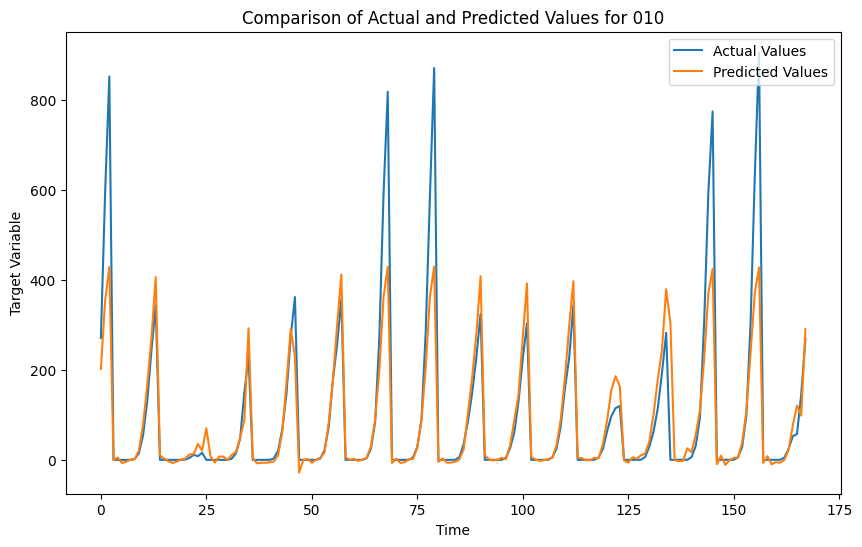

6/6 [==============================] - 0s 8ms/step
{'group': (0, 0, 1), 'r2': 0.6495113449535812, 'mse': 4090.0855903348574, 'rmse': 63.95377698255872, 'mae': 25.697353299920582}
{'group': (0, 1, 0), 'r2': 0.6818191861444658, 'mse': 180164.42738307462, 'rmse': 424.4578040077419, 'mae': 172.30040628936177}
{'group': (0, 1, 1), 'r2': 0.5206574259182031, 'mse': 53258.305801620045, 'rmse': 230.7776111359593, 'mae': 87.73261241808392}
{'group': (0, 2, 1), 'r2': 0.8692724021386904, 'mse': 19.250354886509616, 'rmse': 4.3875226365808775, 'mae': 2.3691888909424392}
{'group': (0, 3, 0), 'r2': 0.5731344919230292, 'mse': 2812662.5170924217, 'rmse': 1677.099435660397, 'mae': 665.5877618690445}
{'group': (0, 3, 1), 'r2': 0.7110708447155554, 'mse': 1391978.03673639, 'rmse': 1179.8211884588231, 'mae': 471.5787190924826}
{'group': (1, 1, 0), 'r2': 0.870327906357944, 'mse': 113.94284142919977, 'rmse': 10.674401221108367, 'mae': 4.546082382031981}
{'group': (1, 3, 0), 'r2': 0.962539964771558, 'mse': 382.

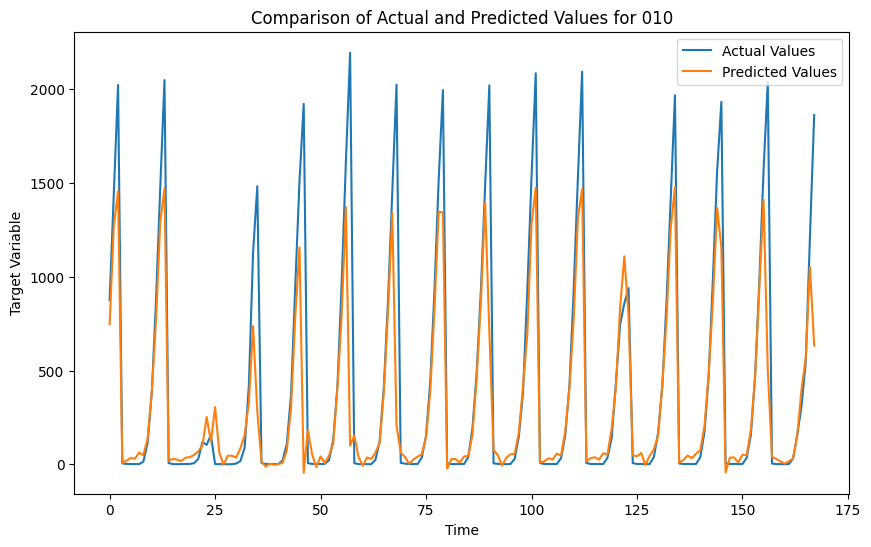

6/6 [==============================] - 0s 8ms/step
{'group': (0, 0, 1), 'r2': 0.6495113449535812, 'mse': 4090.0855903348574, 'rmse': 63.95377698255872, 'mae': 25.697353299920582}
{'group': (0, 1, 0), 'r2': 0.6818191861444658, 'mse': 180164.42738307462, 'rmse': 424.4578040077419, 'mae': 172.30040628936177}
{'group': (0, 1, 1), 'r2': 0.5206574259182031, 'mse': 53258.305801620045, 'rmse': 230.7776111359593, 'mae': 87.73261241808392}
{'group': (0, 2, 1), 'r2': 0.8692724021386904, 'mse': 19.250354886509616, 'rmse': 4.3875226365808775, 'mae': 2.3691888909424392}
{'group': (0, 3, 0), 'r2': 0.5731344919230292, 'mse': 2812662.5170924217, 'rmse': 1677.099435660397, 'mae': 665.5877618690445}
{'group': (0, 3, 1), 'r2': 0.7110708447155554, 'mse': 1391978.03673639, 'rmse': 1179.8211884588231, 'mae': 471.5787190924826}
{'group': (1, 1, 0), 'r2': 0.870327906357944, 'mse': 113.94284142919977, 'rmse': 10.674401221108367, 'mae': 4.546082382031981}
{'group': (1, 3, 0), 'r2': 0.962539964771558, 'mse': 382.

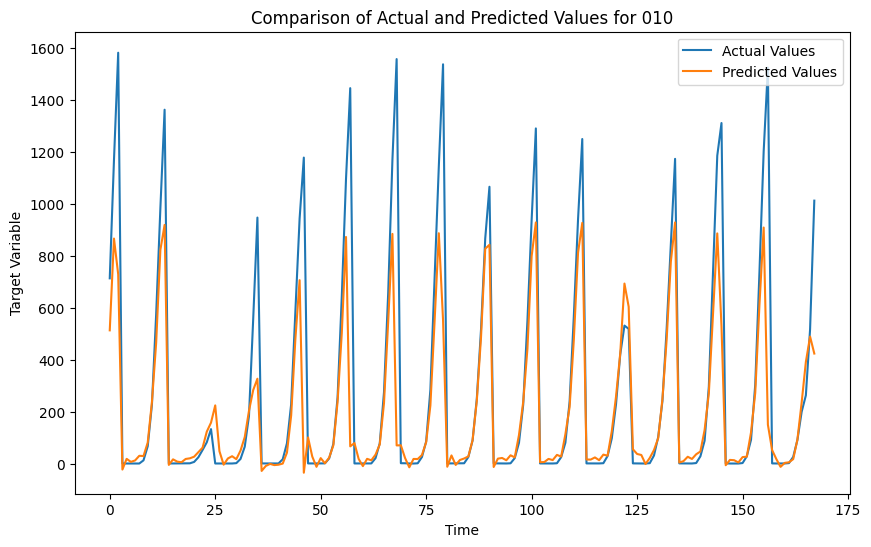

6/6 [==============================] - 0s 10ms/step
{'group': (0, 0, 1), 'r2': 0.6495113449535812, 'mse': 4090.0855903348574, 'rmse': 63.95377698255872, 'mae': 25.697353299920582}
{'group': (0, 1, 0), 'r2': 0.6818191861444658, 'mse': 180164.42738307462, 'rmse': 424.4578040077419, 'mae': 172.30040628936177}
{'group': (0, 1, 1), 'r2': 0.5206574259182031, 'mse': 53258.305801620045, 'rmse': 230.7776111359593, 'mae': 87.73261241808392}
{'group': (0, 2, 1), 'r2': 0.8692724021386904, 'mse': 19.250354886509616, 'rmse': 4.3875226365808775, 'mae': 2.3691888909424392}
{'group': (0, 3, 0), 'r2': 0.5731344919230292, 'mse': 2812662.5170924217, 'rmse': 1677.099435660397, 'mae': 665.5877618690445}
{'group': (0, 3, 1), 'r2': 0.7110708447155554, 'mse': 1391978.03673639, 'rmse': 1179.8211884588231, 'mae': 471.5787190924826}
{'group': (1, 1, 0), 'r2': 0.870327906357944, 'mse': 113.94284142919977, 'rmse': 10.674401221108367, 'mae': 4.546082382031981}
{'group': (1, 3, 0), 'r2': 0.962539964771558, 'mse': 382

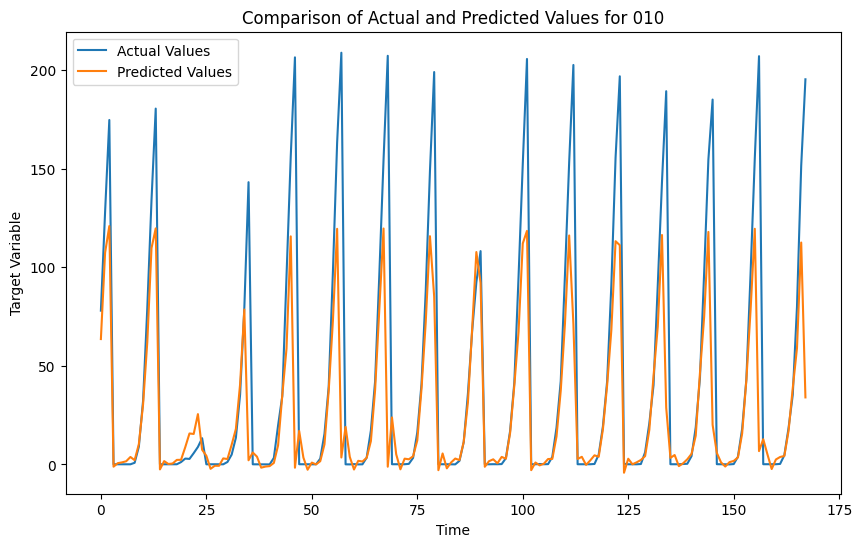

6/6 [==============================] - 0s 9ms/step
{'group': (0, 0, 1), 'r2': 0.6495113449535812, 'mse': 4090.0855903348574, 'rmse': 63.95377698255872, 'mae': 25.697353299920582}
{'group': (0, 1, 0), 'r2': 0.6818191861444658, 'mse': 180164.42738307462, 'rmse': 424.4578040077419, 'mae': 172.30040628936177}
{'group': (0, 1, 1), 'r2': 0.5206574259182031, 'mse': 53258.305801620045, 'rmse': 230.7776111359593, 'mae': 87.73261241808392}
{'group': (0, 2, 1), 'r2': 0.8692724021386904, 'mse': 19.250354886509616, 'rmse': 4.3875226365808775, 'mae': 2.3691888909424392}
{'group': (0, 3, 0), 'r2': 0.5731344919230292, 'mse': 2812662.5170924217, 'rmse': 1677.099435660397, 'mae': 665.5877618690445}
{'group': (0, 3, 1), 'r2': 0.7110708447155554, 'mse': 1391978.03673639, 'rmse': 1179.8211884588231, 'mae': 471.5787190924826}
{'group': (1, 1, 0), 'r2': 0.870327906357944, 'mse': 113.94284142919977, 'rmse': 10.674401221108367, 'mae': 4.546082382031981}
{'group': (1, 3, 0), 'r2': 0.962539964771558, 'mse': 382.

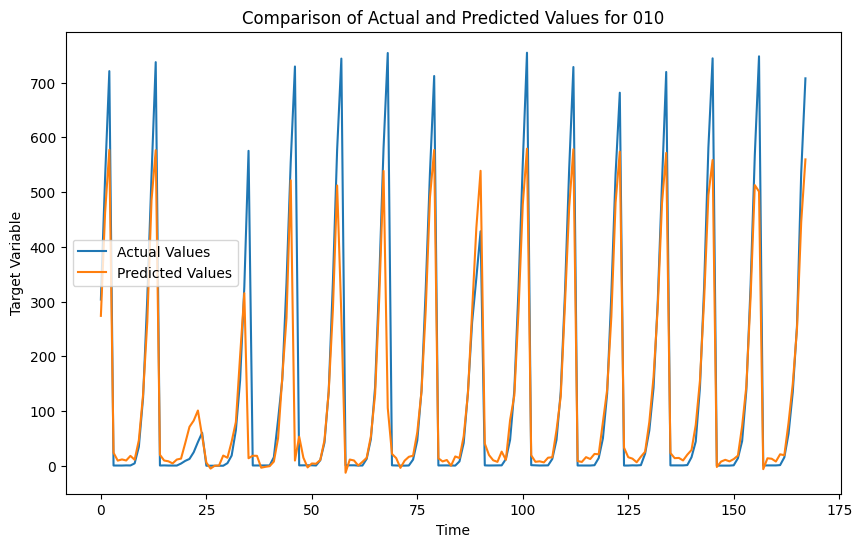

6/6 [==============================] - 0s 9ms/step
{'group': (0, 0, 1), 'r2': 0.6495113449535812, 'mse': 4090.0855903348574, 'rmse': 63.95377698255872, 'mae': 25.697353299920582}
{'group': (0, 1, 0), 'r2': 0.6818191861444658, 'mse': 180164.42738307462, 'rmse': 424.4578040077419, 'mae': 172.30040628936177}
{'group': (0, 1, 1), 'r2': 0.5206574259182031, 'mse': 53258.305801620045, 'rmse': 230.7776111359593, 'mae': 87.73261241808392}
{'group': (0, 2, 1), 'r2': 0.8692724021386904, 'mse': 19.250354886509616, 'rmse': 4.3875226365808775, 'mae': 2.3691888909424392}
{'group': (0, 3, 0), 'r2': 0.5731344919230292, 'mse': 2812662.5170924217, 'rmse': 1677.099435660397, 'mae': 665.5877618690445}
{'group': (0, 3, 1), 'r2': 0.7110708447155554, 'mse': 1391978.03673639, 'rmse': 1179.8211884588231, 'mae': 471.5787190924826}
{'group': (1, 1, 0), 'r2': 0.870327906357944, 'mse': 113.94284142919977, 'rmse': 10.674401221108367, 'mae': 4.546082382031981}
{'group': (1, 3, 0), 'r2': 0.962539964771558, 'mse': 382.

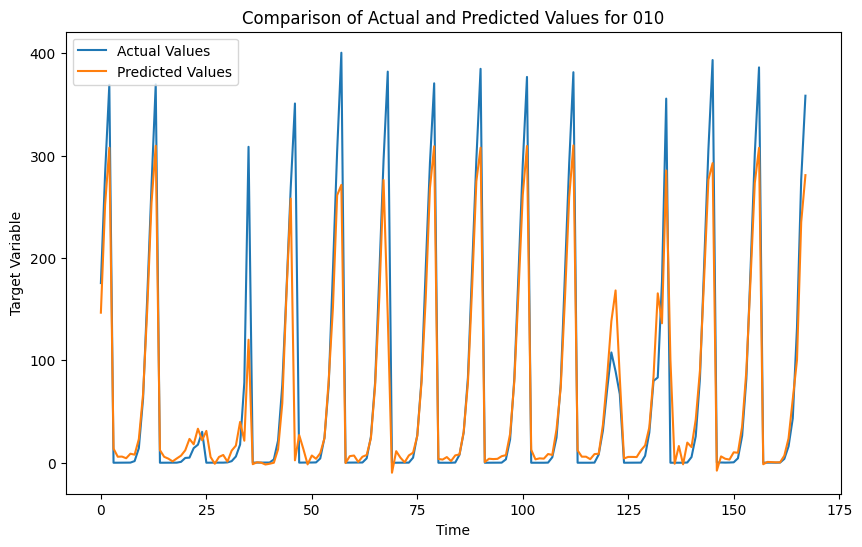

6/6 [==============================] - 0s 12ms/step
{'group': (0, 0, 1), 'r2': 0.6495113449535812, 'mse': 4090.0855903348574, 'rmse': 63.95377698255872, 'mae': 25.697353299920582}
{'group': (0, 1, 0), 'r2': 0.6818191861444658, 'mse': 180164.42738307462, 'rmse': 424.4578040077419, 'mae': 172.30040628936177}
{'group': (0, 1, 1), 'r2': 0.5206574259182031, 'mse': 53258.305801620045, 'rmse': 230.7776111359593, 'mae': 87.73261241808392}
{'group': (0, 2, 1), 'r2': 0.8692724021386904, 'mse': 19.250354886509616, 'rmse': 4.3875226365808775, 'mae': 2.3691888909424392}
{'group': (0, 3, 0), 'r2': 0.5731344919230292, 'mse': 2812662.5170924217, 'rmse': 1677.099435660397, 'mae': 665.5877618690445}
{'group': (0, 3, 1), 'r2': 0.7110708447155554, 'mse': 1391978.03673639, 'rmse': 1179.8211884588231, 'mae': 471.5787190924826}
{'group': (1, 1, 0), 'r2': 0.870327906357944, 'mse': 113.94284142919977, 'rmse': 10.674401221108367, 'mae': 4.546082382031981}
{'group': (1, 3, 0), 'r2': 0.962539964771558, 'mse': 382

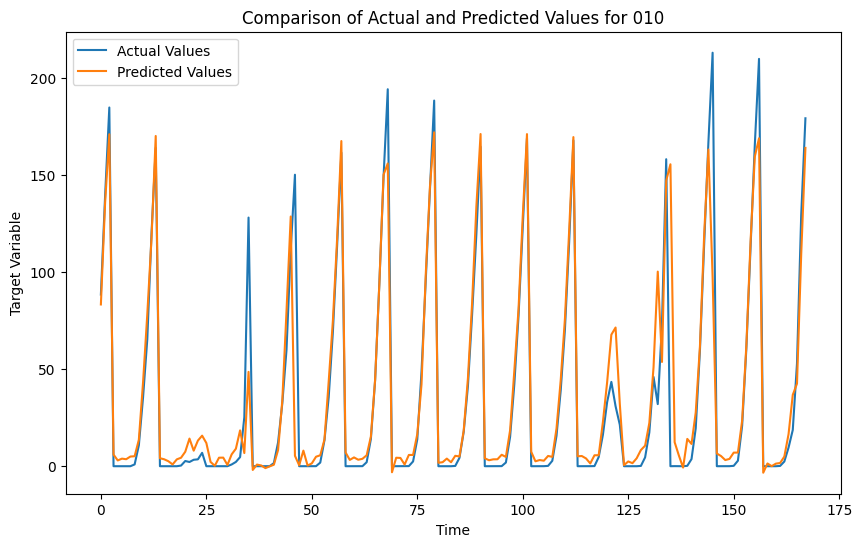

6/6 [==============================] - 0s 9ms/step
{'group': (0, 0, 1), 'r2': 0.6495113449535812, 'mse': 4090.0855903348574, 'rmse': 63.95377698255872, 'mae': 25.697353299920582}
{'group': (0, 1, 0), 'r2': 0.6818191861444658, 'mse': 180164.42738307462, 'rmse': 424.4578040077419, 'mae': 172.30040628936177}
{'group': (0, 1, 1), 'r2': 0.5206574259182031, 'mse': 53258.305801620045, 'rmse': 230.7776111359593, 'mae': 87.73261241808392}
{'group': (0, 2, 1), 'r2': 0.8692724021386904, 'mse': 19.250354886509616, 'rmse': 4.3875226365808775, 'mae': 2.3691888909424392}
{'group': (0, 3, 0), 'r2': 0.5731344919230292, 'mse': 2812662.5170924217, 'rmse': 1677.099435660397, 'mae': 665.5877618690445}
{'group': (0, 3, 1), 'r2': 0.7110708447155554, 'mse': 1391978.03673639, 'rmse': 1179.8211884588231, 'mae': 471.5787190924826}
{'group': (1, 1, 0), 'r2': 0.870327906357944, 'mse': 113.94284142919977, 'rmse': 10.674401221108367, 'mae': 4.546082382031981}
{'group': (1, 3, 0), 'r2': 0.962539964771558, 'mse': 382.

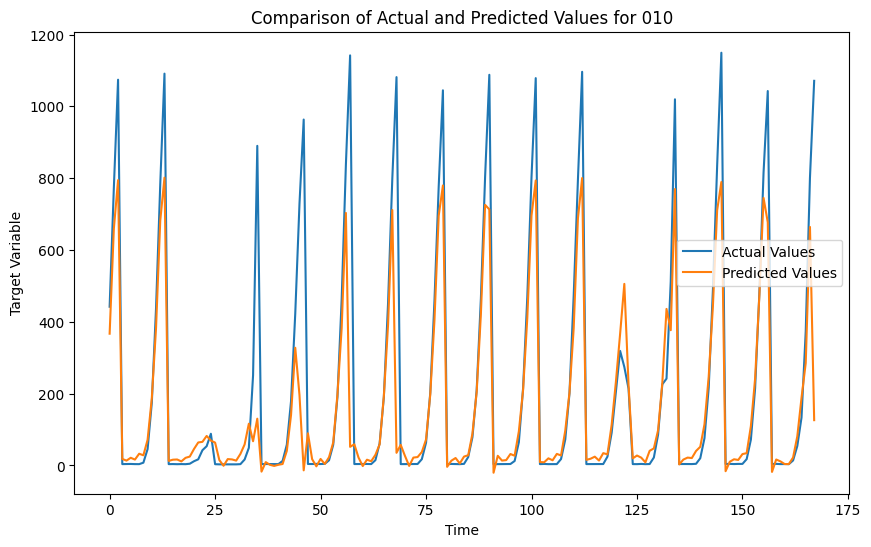

6/6 [==============================] - 0s 9ms/step
{'group': (0, 0, 1), 'r2': 0.6495113449535812, 'mse': 4090.0855903348574, 'rmse': 63.95377698255872, 'mae': 25.697353299920582}
{'group': (0, 1, 0), 'r2': 0.6818191861444658, 'mse': 180164.42738307462, 'rmse': 424.4578040077419, 'mae': 172.30040628936177}
{'group': (0, 1, 1), 'r2': 0.5206574259182031, 'mse': 53258.305801620045, 'rmse': 230.7776111359593, 'mae': 87.73261241808392}
{'group': (0, 2, 1), 'r2': 0.8692724021386904, 'mse': 19.250354886509616, 'rmse': 4.3875226365808775, 'mae': 2.3691888909424392}
{'group': (0, 3, 0), 'r2': 0.5731344919230292, 'mse': 2812662.5170924217, 'rmse': 1677.099435660397, 'mae': 665.5877618690445}
{'group': (0, 3, 1), 'r2': 0.7110708447155554, 'mse': 1391978.03673639, 'rmse': 1179.8211884588231, 'mae': 471.5787190924826}
{'group': (1, 1, 0), 'r2': 0.870327906357944, 'mse': 113.94284142919977, 'rmse': 10.674401221108367, 'mae': 4.546082382031981}
{'group': (1, 3, 0), 'r2': 0.962539964771558, 'mse': 382.

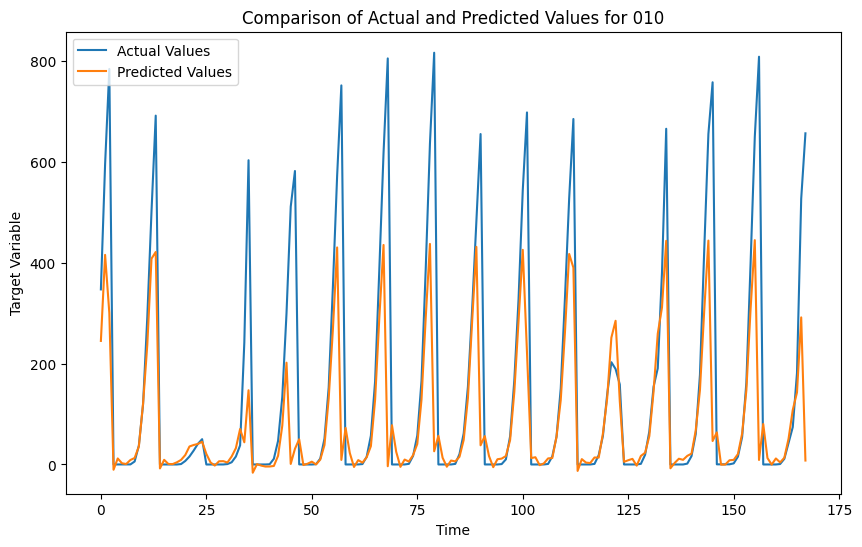

6/6 [==============================] - 0s 9ms/step
{'group': (0, 0, 1), 'r2': 0.6495113449535812, 'mse': 4090.0855903348574, 'rmse': 63.95377698255872, 'mae': 25.697353299920582}
{'group': (0, 1, 0), 'r2': 0.6818191861444658, 'mse': 180164.42738307462, 'rmse': 424.4578040077419, 'mae': 172.30040628936177}
{'group': (0, 1, 1), 'r2': 0.5206574259182031, 'mse': 53258.305801620045, 'rmse': 230.7776111359593, 'mae': 87.73261241808392}
{'group': (0, 2, 1), 'r2': 0.8692724021386904, 'mse': 19.250354886509616, 'rmse': 4.3875226365808775, 'mae': 2.3691888909424392}
{'group': (0, 3, 0), 'r2': 0.5731344919230292, 'mse': 2812662.5170924217, 'rmse': 1677.099435660397, 'mae': 665.5877618690445}
{'group': (0, 3, 1), 'r2': 0.7110708447155554, 'mse': 1391978.03673639, 'rmse': 1179.8211884588231, 'mae': 471.5787190924826}
{'group': (1, 1, 0), 'r2': 0.870327906357944, 'mse': 113.94284142919977, 'rmse': 10.674401221108367, 'mae': 4.546082382031981}
{'group': (1, 3, 0), 'r2': 0.962539964771558, 'mse': 382.

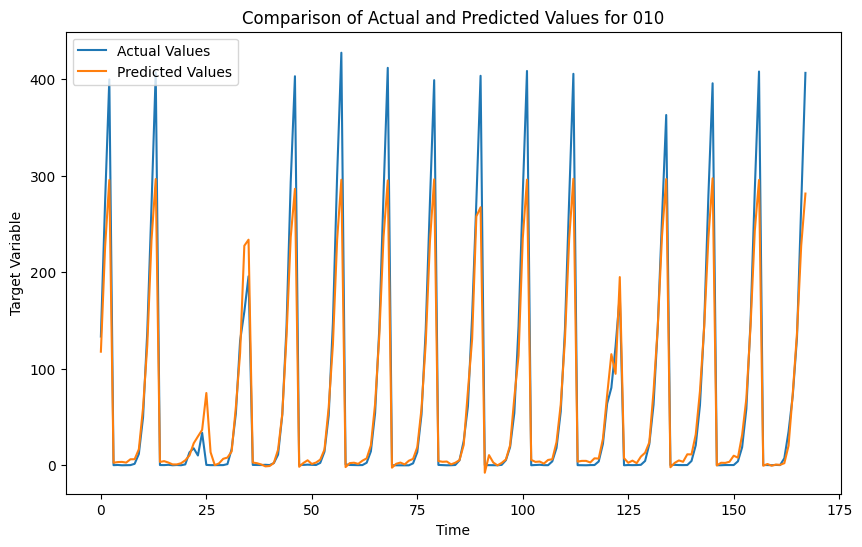

6/6 [==============================] - 0s 10ms/step
{'group': (0, 0, 1), 'r2': 0.6495113449535812, 'mse': 4090.0855903348574, 'rmse': 63.95377698255872, 'mae': 25.697353299920582}
{'group': (0, 1, 0), 'r2': 0.6818191861444658, 'mse': 180164.42738307462, 'rmse': 424.4578040077419, 'mae': 172.30040628936177}
{'group': (0, 1, 1), 'r2': 0.5206574259182031, 'mse': 53258.305801620045, 'rmse': 230.7776111359593, 'mae': 87.73261241808392}
{'group': (0, 2, 1), 'r2': 0.8692724021386904, 'mse': 19.250354886509616, 'rmse': 4.3875226365808775, 'mae': 2.3691888909424392}
{'group': (0, 3, 0), 'r2': 0.5731344919230292, 'mse': 2812662.5170924217, 'rmse': 1677.099435660397, 'mae': 665.5877618690445}
{'group': (0, 3, 1), 'r2': 0.7110708447155554, 'mse': 1391978.03673639, 'rmse': 1179.8211884588231, 'mae': 471.5787190924826}
{'group': (1, 1, 0), 'r2': 0.870327906357944, 'mse': 113.94284142919977, 'rmse': 10.674401221108367, 'mae': 4.546082382031981}
{'group': (1, 3, 0), 'r2': 0.962539964771558, 'mse': 382

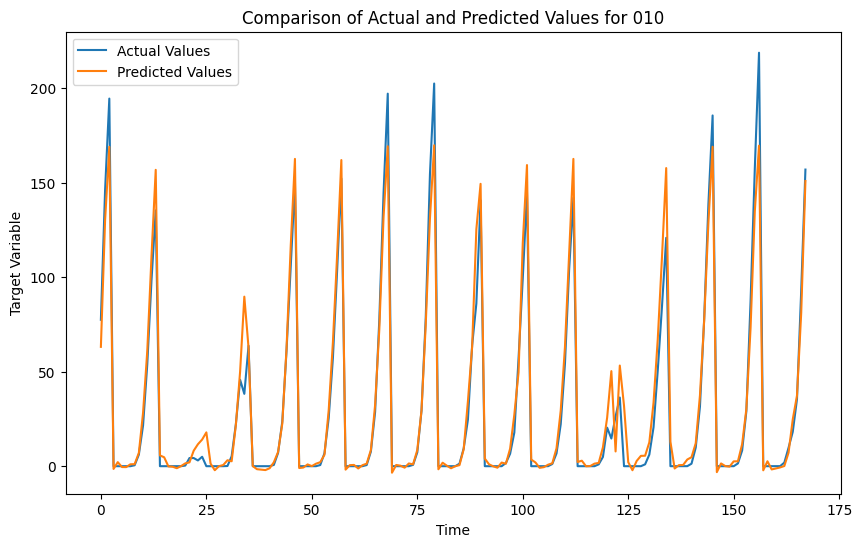

6/6 [==============================] - 0s 10ms/step
{'group': (0, 0, 1), 'r2': 0.6495113449535812, 'mse': 4090.0855903348574, 'rmse': 63.95377698255872, 'mae': 25.697353299920582}
{'group': (0, 1, 0), 'r2': 0.6818191861444658, 'mse': 180164.42738307462, 'rmse': 424.4578040077419, 'mae': 172.30040628936177}
{'group': (0, 1, 1), 'r2': 0.5206574259182031, 'mse': 53258.305801620045, 'rmse': 230.7776111359593, 'mae': 87.73261241808392}
{'group': (0, 2, 1), 'r2': 0.8692724021386904, 'mse': 19.250354886509616, 'rmse': 4.3875226365808775, 'mae': 2.3691888909424392}
{'group': (0, 3, 0), 'r2': 0.5731344919230292, 'mse': 2812662.5170924217, 'rmse': 1677.099435660397, 'mae': 665.5877618690445}
{'group': (0, 3, 1), 'r2': 0.7110708447155554, 'mse': 1391978.03673639, 'rmse': 1179.8211884588231, 'mae': 471.5787190924826}
{'group': (1, 1, 0), 'r2': 0.870327906357944, 'mse': 113.94284142919977, 'rmse': 10.674401221108367, 'mae': 4.546082382031981}
{'group': (1, 3, 0), 'r2': 0.962539964771558, 'mse': 382

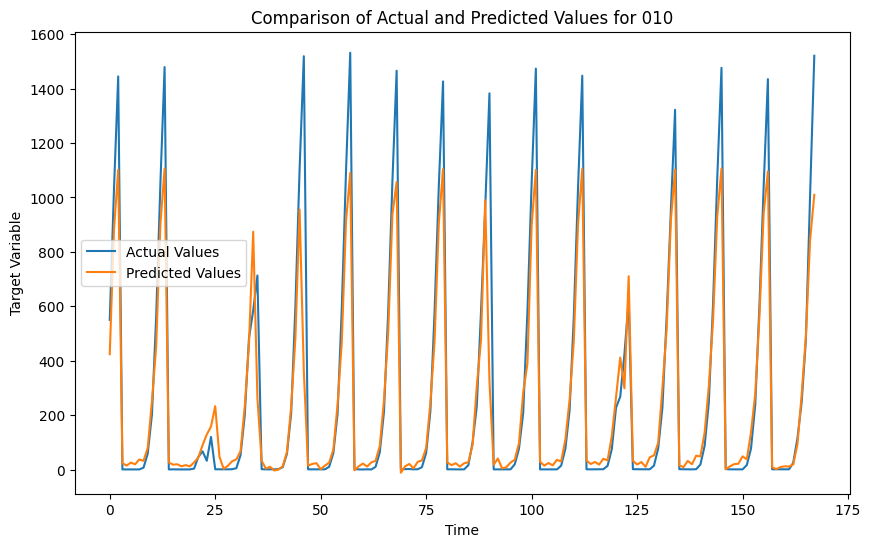

6/6 [==============================] - 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.6495113449535812, 'mse': 4090.0855903348574, 'rmse': 63.95377698255872, 'mae': 25.697353299920582}
{'group': (0, 1, 0), 'r2': 0.6818191861444658, 'mse': 180164.42738307462, 'rmse': 424.4578040077419, 'mae': 172.30040628936177}
{'group': (0, 1, 1), 'r2': 0.5206574259182031, 'mse': 53258.305801620045, 'rmse': 230.7776111359593, 'mae': 87.73261241808392}
{'group': (0, 2, 1), 'r2': 0.8692724021386904, 'mse': 19.250354886509616, 'rmse': 4.3875226365808775, 'mae': 2.3691888909424392}
{'group': (0, 3, 0), 'r2': 0.5731344919230292, 'mse': 2812662.5170924217, 'rmse': 1677.099435660397, 'mae': 665.5877618690445}
{'group': (0, 3, 1), 'r2': 0.7110708447155554, 'mse': 1391978.03673639, 'rmse': 1179.8211884588231, 'mae': 471.5787190924826}
{'group': (1, 1, 0), 'r2': 0.870327906357944, 'mse': 113.94284142919977, 'rmse': 10.674401221108367, 'mae': 4.546082382031981}
{'group': (1, 3, 0), 'r2': 0.962539964771558, 'mse': 382

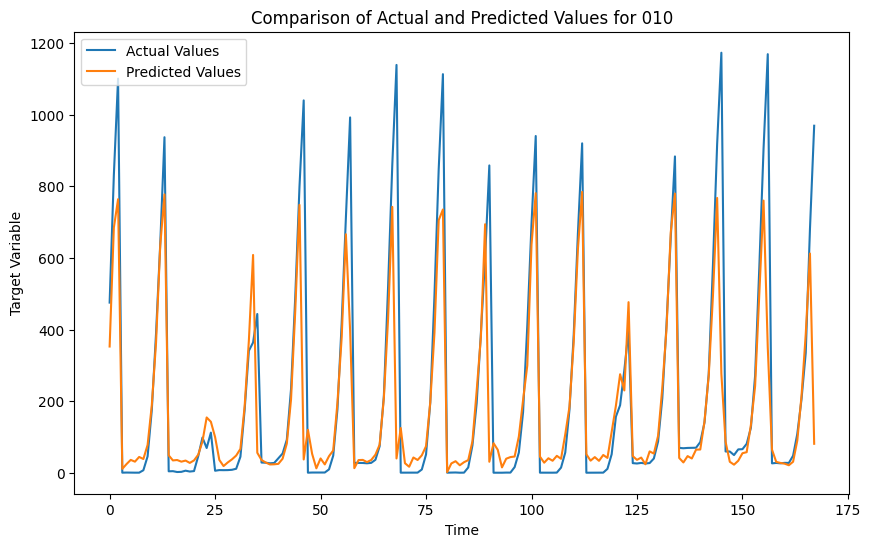

6/6 [==============================] - 0s 9ms/step
{'group': (0, 0, 1), 'r2': 0.6495113449535812, 'mse': 4090.0855903348574, 'rmse': 63.95377698255872, 'mae': 25.697353299920582}
{'group': (0, 1, 0), 'r2': 0.6818191861444658, 'mse': 180164.42738307462, 'rmse': 424.4578040077419, 'mae': 172.30040628936177}
{'group': (0, 1, 1), 'r2': 0.5206574259182031, 'mse': 53258.305801620045, 'rmse': 230.7776111359593, 'mae': 87.73261241808392}
{'group': (0, 2, 1), 'r2': 0.8692724021386904, 'mse': 19.250354886509616, 'rmse': 4.3875226365808775, 'mae': 2.3691888909424392}
{'group': (0, 3, 0), 'r2': 0.5731344919230292, 'mse': 2812662.5170924217, 'rmse': 1677.099435660397, 'mae': 665.5877618690445}
{'group': (0, 3, 1), 'r2': 0.7110708447155554, 'mse': 1391978.03673639, 'rmse': 1179.8211884588231, 'mae': 471.5787190924826}
{'group': (1, 1, 0), 'r2': 0.870327906357944, 'mse': 113.94284142919977, 'rmse': 10.674401221108367, 'mae': 4.546082382031981}
{'group': (1, 3, 0), 'r2': 0.962539964771558, 'mse': 382.

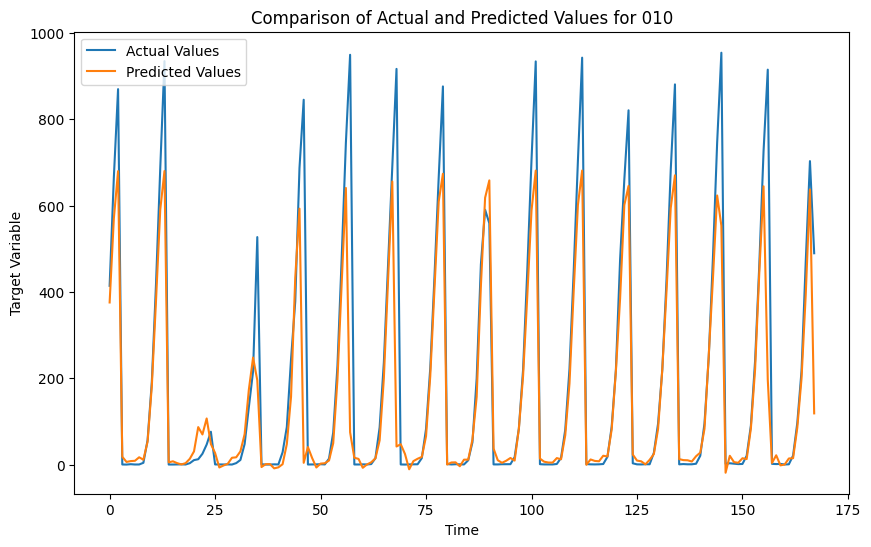

6/6 [==============================] - 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.6495113449535812, 'mse': 4090.0855903348574, 'rmse': 63.95377698255872, 'mae': 25.697353299920582}
{'group': (0, 1, 0), 'r2': 0.6818191861444658, 'mse': 180164.42738307462, 'rmse': 424.4578040077419, 'mae': 172.30040628936177}
{'group': (0, 1, 1), 'r2': 0.5206574259182031, 'mse': 53258.305801620045, 'rmse': 230.7776111359593, 'mae': 87.73261241808392}
{'group': (0, 2, 1), 'r2': 0.8692724021386904, 'mse': 19.250354886509616, 'rmse': 4.3875226365808775, 'mae': 2.3691888909424392}
{'group': (0, 3, 0), 'r2': 0.5731344919230292, 'mse': 2812662.5170924217, 'rmse': 1677.099435660397, 'mae': 665.5877618690445}
{'group': (0, 3, 1), 'r2': 0.7110708447155554, 'mse': 1391978.03673639, 'rmse': 1179.8211884588231, 'mae': 471.5787190924826}
{'group': (1, 1, 0), 'r2': 0.870327906357944, 'mse': 113.94284142919977, 'rmse': 10.674401221108367, 'mae': 4.546082382031981}
{'group': (1, 3, 0), 'r2': 0.962539964771558, 'mse': 382

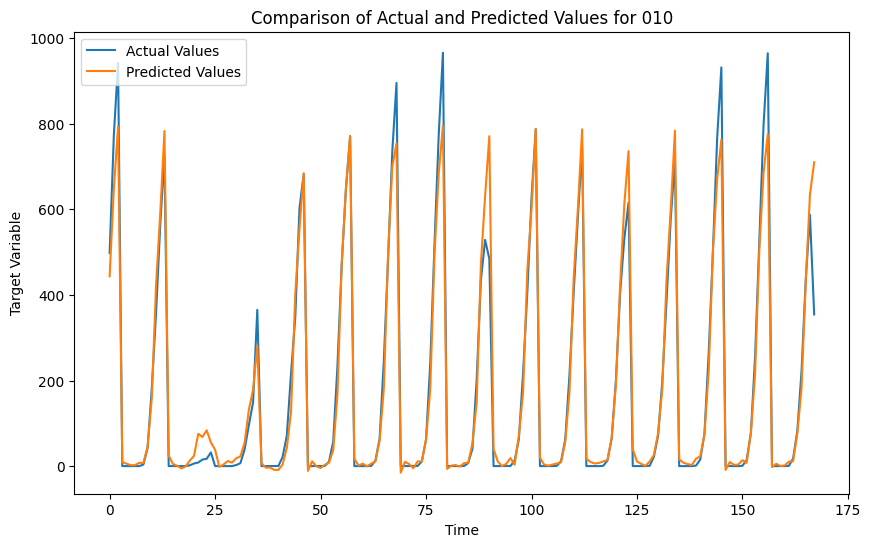

6/6 [==============================] - 0s 10ms/step
{'group': (0, 0, 1), 'r2': 0.6495113449535812, 'mse': 4090.0855903348574, 'rmse': 63.95377698255872, 'mae': 25.697353299920582}
{'group': (0, 1, 0), 'r2': 0.6818191861444658, 'mse': 180164.42738307462, 'rmse': 424.4578040077419, 'mae': 172.30040628936177}
{'group': (0, 1, 1), 'r2': 0.5206574259182031, 'mse': 53258.305801620045, 'rmse': 230.7776111359593, 'mae': 87.73261241808392}
{'group': (0, 2, 1), 'r2': 0.8692724021386904, 'mse': 19.250354886509616, 'rmse': 4.3875226365808775, 'mae': 2.3691888909424392}
{'group': (0, 3, 0), 'r2': 0.5731344919230292, 'mse': 2812662.5170924217, 'rmse': 1677.099435660397, 'mae': 665.5877618690445}
{'group': (0, 3, 1), 'r2': 0.7110708447155554, 'mse': 1391978.03673639, 'rmse': 1179.8211884588231, 'mae': 471.5787190924826}
{'group': (1, 1, 0), 'r2': 0.870327906357944, 'mse': 113.94284142919977, 'rmse': 10.674401221108367, 'mae': 4.546082382031981}
{'group': (1, 3, 0), 'r2': 0.962539964771558, 'mse': 382

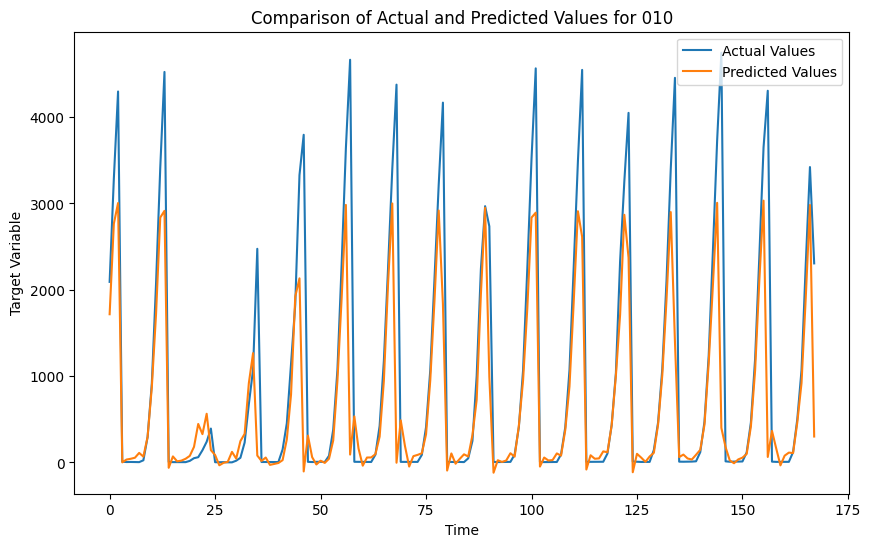

6/6 [==============================] - 0s 8ms/step
{'group': (0, 0, 1), 'r2': 0.6495113449535812, 'mse': 4090.0855903348574, 'rmse': 63.95377698255872, 'mae': 25.697353299920582}
{'group': (0, 1, 0), 'r2': 0.6818191861444658, 'mse': 180164.42738307462, 'rmse': 424.4578040077419, 'mae': 172.30040628936177}
{'group': (0, 1, 1), 'r2': 0.5206574259182031, 'mse': 53258.305801620045, 'rmse': 230.7776111359593, 'mae': 87.73261241808392}
{'group': (0, 2, 1), 'r2': 0.8692724021386904, 'mse': 19.250354886509616, 'rmse': 4.3875226365808775, 'mae': 2.3691888909424392}
{'group': (0, 3, 0), 'r2': 0.5731344919230292, 'mse': 2812662.5170924217, 'rmse': 1677.099435660397, 'mae': 665.5877618690445}
{'group': (0, 3, 1), 'r2': 0.7110708447155554, 'mse': 1391978.03673639, 'rmse': 1179.8211884588231, 'mae': 471.5787190924826}
{'group': (1, 1, 0), 'r2': 0.870327906357944, 'mse': 113.94284142919977, 'rmse': 10.674401221108367, 'mae': 4.546082382031981}
{'group': (1, 3, 0), 'r2': 0.962539964771558, 'mse': 382.

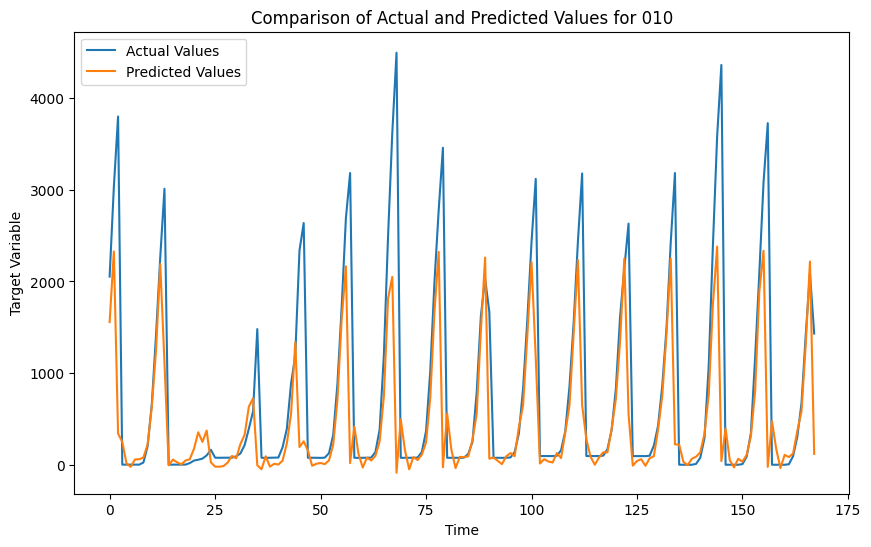

6/6 [==============================] - 0s 8ms/step
{'group': (0, 0, 1), 'r2': 0.6495113449535812, 'mse': 4090.0855903348574, 'rmse': 63.95377698255872, 'mae': 25.697353299920582}
{'group': (0, 1, 0), 'r2': 0.6818191861444658, 'mse': 180164.42738307462, 'rmse': 424.4578040077419, 'mae': 172.30040628936177}
{'group': (0, 1, 1), 'r2': 0.5206574259182031, 'mse': 53258.305801620045, 'rmse': 230.7776111359593, 'mae': 87.73261241808392}
{'group': (0, 2, 1), 'r2': 0.8692724021386904, 'mse': 19.250354886509616, 'rmse': 4.3875226365808775, 'mae': 2.3691888909424392}
{'group': (0, 3, 0), 'r2': 0.5731344919230292, 'mse': 2812662.5170924217, 'rmse': 1677.099435660397, 'mae': 665.5877618690445}
{'group': (0, 3, 1), 'r2': 0.7110708447155554, 'mse': 1391978.03673639, 'rmse': 1179.8211884588231, 'mae': 471.5787190924826}
{'group': (1, 1, 0), 'r2': 0.870327906357944, 'mse': 113.94284142919977, 'rmse': 10.674401221108367, 'mae': 4.546082382031981}
{'group': (1, 3, 0), 'r2': 0.962539964771558, 'mse': 382.

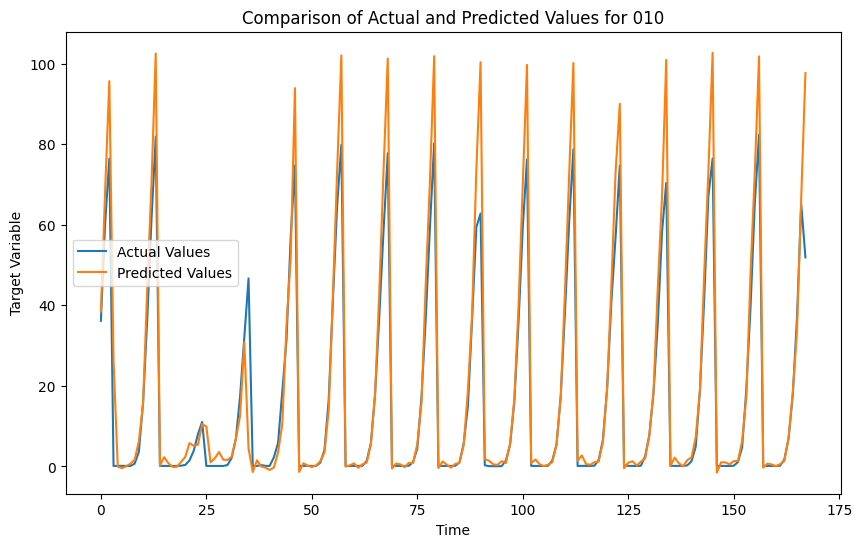

6/6 [==============================] - 0s 10ms/step
{'group': (0, 0, 1), 'r2': 0.6495113449535812, 'mse': 4090.0855903348574, 'rmse': 63.95377698255872, 'mae': 25.697353299920582}
{'group': (0, 1, 0), 'r2': 0.6818191861444658, 'mse': 180164.42738307462, 'rmse': 424.4578040077419, 'mae': 172.30040628936177}
{'group': (0, 1, 1), 'r2': 0.5206574259182031, 'mse': 53258.305801620045, 'rmse': 230.7776111359593, 'mae': 87.73261241808392}
{'group': (0, 2, 1), 'r2': 0.8692724021386904, 'mse': 19.250354886509616, 'rmse': 4.3875226365808775, 'mae': 2.3691888909424392}
{'group': (0, 3, 0), 'r2': 0.5731344919230292, 'mse': 2812662.5170924217, 'rmse': 1677.099435660397, 'mae': 665.5877618690445}
{'group': (0, 3, 1), 'r2': 0.7110708447155554, 'mse': 1391978.03673639, 'rmse': 1179.8211884588231, 'mae': 471.5787190924826}
{'group': (1, 1, 0), 'r2': 0.870327906357944, 'mse': 113.94284142919977, 'rmse': 10.674401221108367, 'mae': 4.546082382031981}
{'group': (1, 3, 0), 'r2': 0.962539964771558, 'mse': 382

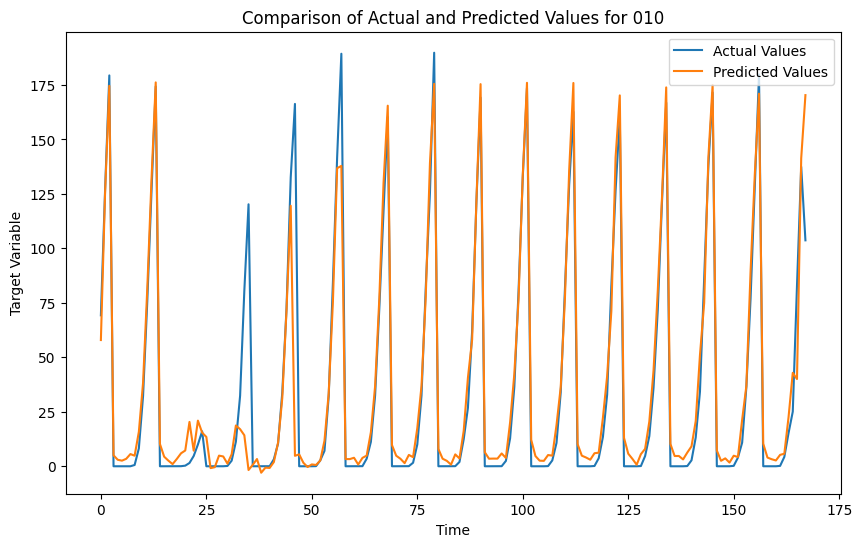

6/6 [==============================] - 0s 8ms/step
{'group': (0, 0, 1), 'r2': 0.6495113449535812, 'mse': 4090.0855903348574, 'rmse': 63.95377698255872, 'mae': 25.697353299920582}
{'group': (0, 1, 0), 'r2': 0.6818191861444658, 'mse': 180164.42738307462, 'rmse': 424.4578040077419, 'mae': 172.30040628936177}
{'group': (0, 1, 1), 'r2': 0.5206574259182031, 'mse': 53258.305801620045, 'rmse': 230.7776111359593, 'mae': 87.73261241808392}
{'group': (0, 2, 1), 'r2': 0.8692724021386904, 'mse': 19.250354886509616, 'rmse': 4.3875226365808775, 'mae': 2.3691888909424392}
{'group': (0, 3, 0), 'r2': 0.5731344919230292, 'mse': 2812662.5170924217, 'rmse': 1677.099435660397, 'mae': 665.5877618690445}
{'group': (0, 3, 1), 'r2': 0.7110708447155554, 'mse': 1391978.03673639, 'rmse': 1179.8211884588231, 'mae': 471.5787190924826}
{'group': (1, 1, 0), 'r2': 0.870327906357944, 'mse': 113.94284142919977, 'rmse': 10.674401221108367, 'mae': 4.546082382031981}
{'group': (1, 3, 0), 'r2': 0.962539964771558, 'mse': 382.

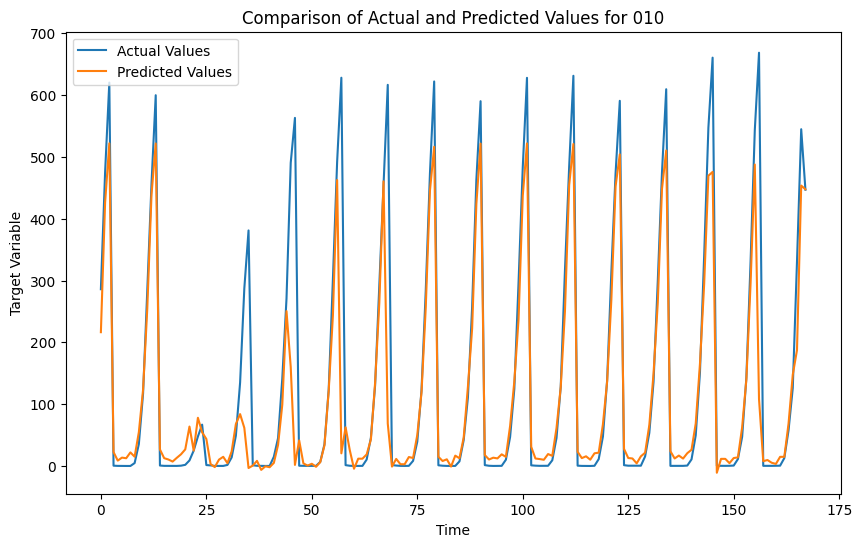

6/6 [==============================] - 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.6495113449535812, 'mse': 4090.0855903348574, 'rmse': 63.95377698255872, 'mae': 25.697353299920582}
{'group': (0, 1, 0), 'r2': 0.6818191861444658, 'mse': 180164.42738307462, 'rmse': 424.4578040077419, 'mae': 172.30040628936177}
{'group': (0, 1, 1), 'r2': 0.5206574259182031, 'mse': 53258.305801620045, 'rmse': 230.7776111359593, 'mae': 87.73261241808392}
{'group': (0, 2, 1), 'r2': 0.8692724021386904, 'mse': 19.250354886509616, 'rmse': 4.3875226365808775, 'mae': 2.3691888909424392}
{'group': (0, 3, 0), 'r2': 0.5731344919230292, 'mse': 2812662.5170924217, 'rmse': 1677.099435660397, 'mae': 665.5877618690445}
{'group': (0, 3, 1), 'r2': 0.7110708447155554, 'mse': 1391978.03673639, 'rmse': 1179.8211884588231, 'mae': 471.5787190924826}
{'group': (1, 1, 0), 'r2': 0.870327906357944, 'mse': 113.94284142919977, 'rmse': 10.674401221108367, 'mae': 4.546082382031981}
{'group': (1, 3, 0), 'r2': 0.962539964771558, 'mse': 382

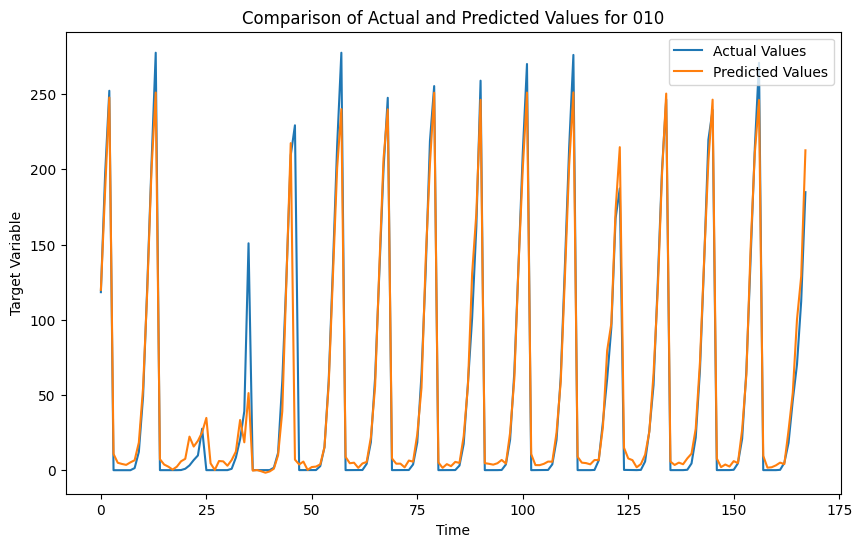

6/6 [==============================] - 0s 9ms/step
{'group': (0, 0, 1), 'r2': 0.6495113449535812, 'mse': 4090.0855903348574, 'rmse': 63.95377698255872, 'mae': 25.697353299920582}
{'group': (0, 1, 0), 'r2': 0.6818191861444658, 'mse': 180164.42738307462, 'rmse': 424.4578040077419, 'mae': 172.30040628936177}
{'group': (0, 1, 1), 'r2': 0.5206574259182031, 'mse': 53258.305801620045, 'rmse': 230.7776111359593, 'mae': 87.73261241808392}
{'group': (0, 2, 1), 'r2': 0.8692724021386904, 'mse': 19.250354886509616, 'rmse': 4.3875226365808775, 'mae': 2.3691888909424392}
{'group': (0, 3, 0), 'r2': 0.5731344919230292, 'mse': 2812662.5170924217, 'rmse': 1677.099435660397, 'mae': 665.5877618690445}
{'group': (0, 3, 1), 'r2': 0.7110708447155554, 'mse': 1391978.03673639, 'rmse': 1179.8211884588231, 'mae': 471.5787190924826}
{'group': (1, 1, 0), 'r2': 0.870327906357944, 'mse': 113.94284142919977, 'rmse': 10.674401221108367, 'mae': 4.546082382031981}
{'group': (1, 3, 0), 'r2': 0.962539964771558, 'mse': 382.

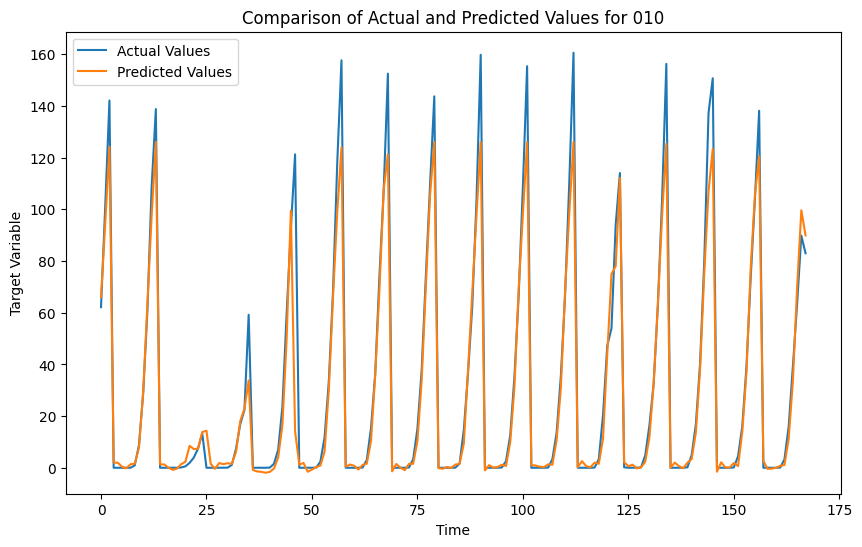

6/6 [==============================] - 0s 8ms/step
{'group': (0, 0, 1), 'r2': 0.6495113449535812, 'mse': 4090.0855903348574, 'rmse': 63.95377698255872, 'mae': 25.697353299920582}
{'group': (0, 1, 0), 'r2': 0.6818191861444658, 'mse': 180164.42738307462, 'rmse': 424.4578040077419, 'mae': 172.30040628936177}
{'group': (0, 1, 1), 'r2': 0.5206574259182031, 'mse': 53258.305801620045, 'rmse': 230.7776111359593, 'mae': 87.73261241808392}
{'group': (0, 2, 1), 'r2': 0.8692724021386904, 'mse': 19.250354886509616, 'rmse': 4.3875226365808775, 'mae': 2.3691888909424392}
{'group': (0, 3, 0), 'r2': 0.5731344919230292, 'mse': 2812662.5170924217, 'rmse': 1677.099435660397, 'mae': 665.5877618690445}
{'group': (0, 3, 1), 'r2': 0.7110708447155554, 'mse': 1391978.03673639, 'rmse': 1179.8211884588231, 'mae': 471.5787190924826}
{'group': (1, 1, 0), 'r2': 0.870327906357944, 'mse': 113.94284142919977, 'rmse': 10.674401221108367, 'mae': 4.546082382031981}
{'group': (1, 3, 0), 'r2': 0.962539964771558, 'mse': 382.

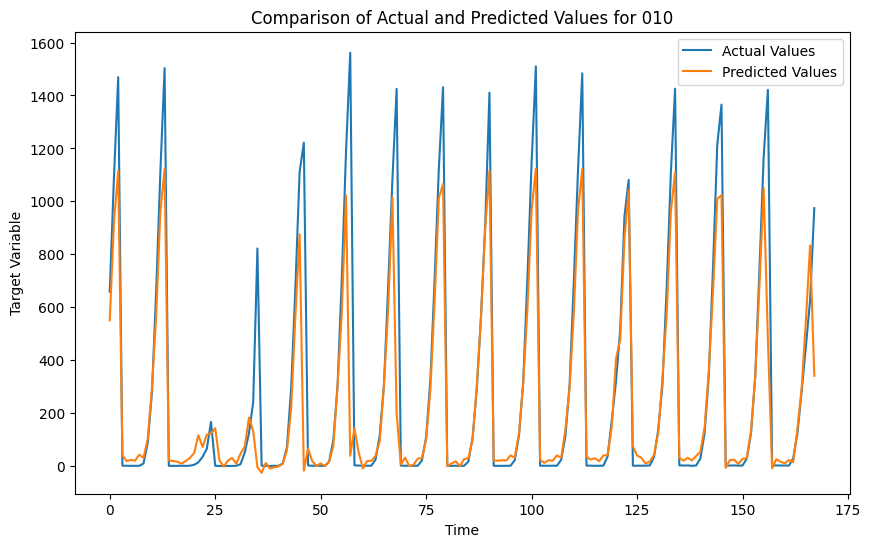

6/6 [==============================] - 0s 9ms/step
{'group': (0, 0, 1), 'r2': 0.6495113449535812, 'mse': 4090.0855903348574, 'rmse': 63.95377698255872, 'mae': 25.697353299920582}
{'group': (0, 1, 0), 'r2': 0.6818191861444658, 'mse': 180164.42738307462, 'rmse': 424.4578040077419, 'mae': 172.30040628936177}
{'group': (0, 1, 1), 'r2': 0.5206574259182031, 'mse': 53258.305801620045, 'rmse': 230.7776111359593, 'mae': 87.73261241808392}
{'group': (0, 2, 1), 'r2': 0.8692724021386904, 'mse': 19.250354886509616, 'rmse': 4.3875226365808775, 'mae': 2.3691888909424392}
{'group': (0, 3, 0), 'r2': 0.5731344919230292, 'mse': 2812662.5170924217, 'rmse': 1677.099435660397, 'mae': 665.5877618690445}
{'group': (0, 3, 1), 'r2': 0.7110708447155554, 'mse': 1391978.03673639, 'rmse': 1179.8211884588231, 'mae': 471.5787190924826}
{'group': (1, 1, 0), 'r2': 0.870327906357944, 'mse': 113.94284142919977, 'rmse': 10.674401221108367, 'mae': 4.546082382031981}
{'group': (1, 3, 0), 'r2': 0.962539964771558, 'mse': 382.

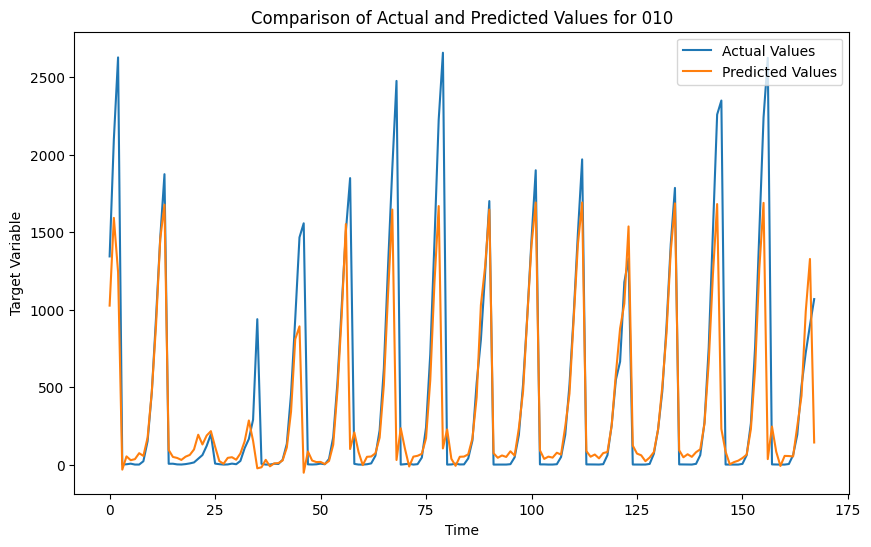

6/6 [==============================] - 0s 9ms/step
{'group': (0, 0, 1), 'r2': 0.6495113449535812, 'mse': 4090.0855903348574, 'rmse': 63.95377698255872, 'mae': 25.697353299920582}
{'group': (0, 1, 0), 'r2': 0.6818191861444658, 'mse': 180164.42738307462, 'rmse': 424.4578040077419, 'mae': 172.30040628936177}
{'group': (0, 1, 1), 'r2': 0.5206574259182031, 'mse': 53258.305801620045, 'rmse': 230.7776111359593, 'mae': 87.73261241808392}
{'group': (0, 2, 1), 'r2': 0.8692724021386904, 'mse': 19.250354886509616, 'rmse': 4.3875226365808775, 'mae': 2.3691888909424392}
{'group': (0, 3, 0), 'r2': 0.5731344919230292, 'mse': 2812662.5170924217, 'rmse': 1677.099435660397, 'mae': 665.5877618690445}
{'group': (0, 3, 1), 'r2': 0.7110708447155554, 'mse': 1391978.03673639, 'rmse': 1179.8211884588231, 'mae': 471.5787190924826}
{'group': (1, 1, 0), 'r2': 0.870327906357944, 'mse': 113.94284142919977, 'rmse': 10.674401221108367, 'mae': 4.546082382031981}
{'group': (1, 3, 0), 'r2': 0.962539964771558, 'mse': 382.

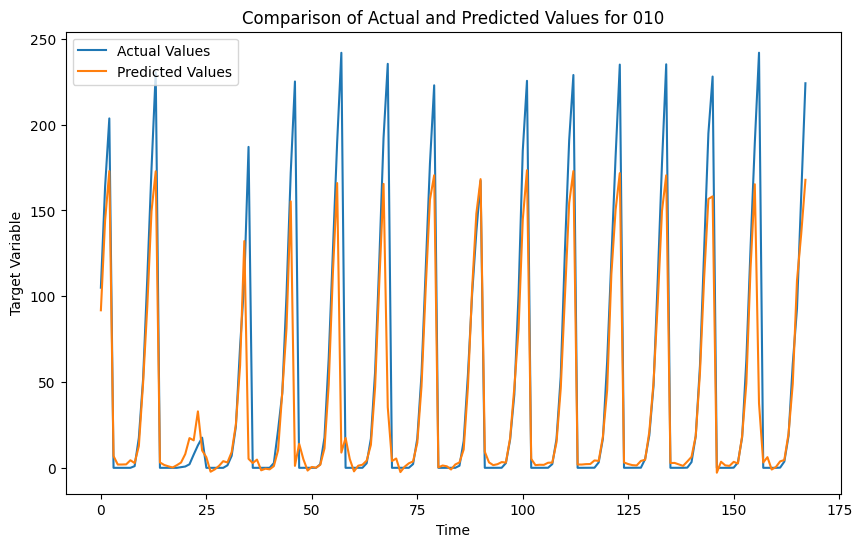

6/6 [==============================] - 0s 12ms/step
{'group': (0, 0, 1), 'r2': 0.6495113449535812, 'mse': 4090.0855903348574, 'rmse': 63.95377698255872, 'mae': 25.697353299920582}
{'group': (0, 1, 0), 'r2': 0.6818191861444658, 'mse': 180164.42738307462, 'rmse': 424.4578040077419, 'mae': 172.30040628936177}
{'group': (0, 1, 1), 'r2': 0.5206574259182031, 'mse': 53258.305801620045, 'rmse': 230.7776111359593, 'mae': 87.73261241808392}
{'group': (0, 2, 1), 'r2': 0.8692724021386904, 'mse': 19.250354886509616, 'rmse': 4.3875226365808775, 'mae': 2.3691888909424392}
{'group': (0, 3, 0), 'r2': 0.5731344919230292, 'mse': 2812662.5170924217, 'rmse': 1677.099435660397, 'mae': 665.5877618690445}
{'group': (0, 3, 1), 'r2': 0.7110708447155554, 'mse': 1391978.03673639, 'rmse': 1179.8211884588231, 'mae': 471.5787190924826}
{'group': (1, 1, 0), 'r2': 0.870327906357944, 'mse': 113.94284142919977, 'rmse': 10.674401221108367, 'mae': 4.546082382031981}
{'group': (1, 3, 0), 'r2': 0.962539964771558, 'mse': 382

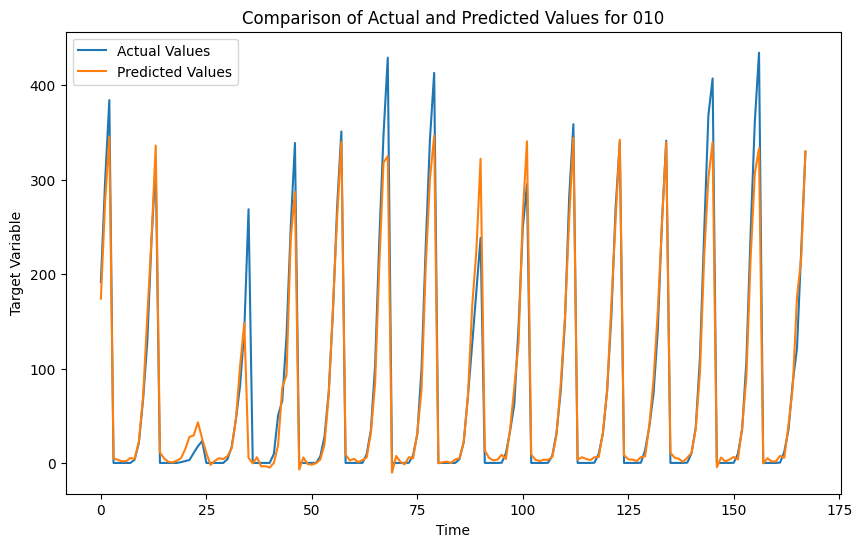

6/6 [==============================] - 0s 9ms/step
{'group': (0, 0, 1), 'r2': 0.6495113449535812, 'mse': 4090.0855903348574, 'rmse': 63.95377698255872, 'mae': 25.697353299920582}
{'group': (0, 1, 0), 'r2': 0.6818191861444658, 'mse': 180164.42738307462, 'rmse': 424.4578040077419, 'mae': 172.30040628936177}
{'group': (0, 1, 1), 'r2': 0.5206574259182031, 'mse': 53258.305801620045, 'rmse': 230.7776111359593, 'mae': 87.73261241808392}
{'group': (0, 2, 1), 'r2': 0.8692724021386904, 'mse': 19.250354886509616, 'rmse': 4.3875226365808775, 'mae': 2.3691888909424392}
{'group': (0, 3, 0), 'r2': 0.5731344919230292, 'mse': 2812662.5170924217, 'rmse': 1677.099435660397, 'mae': 665.5877618690445}
{'group': (0, 3, 1), 'r2': 0.7110708447155554, 'mse': 1391978.03673639, 'rmse': 1179.8211884588231, 'mae': 471.5787190924826}
{'group': (1, 1, 0), 'r2': 0.870327906357944, 'mse': 113.94284142919977, 'rmse': 10.674401221108367, 'mae': 4.546082382031981}
{'group': (1, 3, 0), 'r2': 0.962539964771558, 'mse': 382.

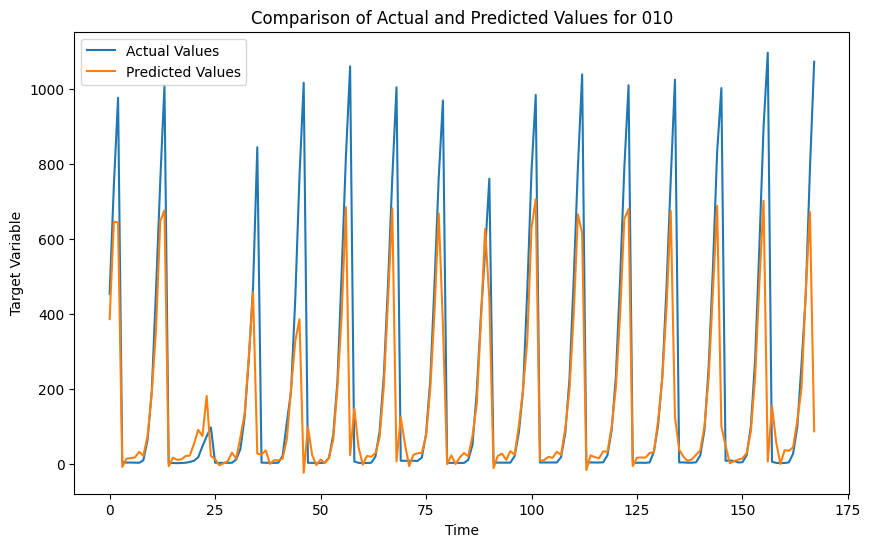

6/6 [==============================] - 0s 10ms/step
{'group': (0, 0, 1), 'r2': 0.6495113449535812, 'mse': 4090.0855903348574, 'rmse': 63.95377698255872, 'mae': 25.697353299920582}
{'group': (0, 1, 0), 'r2': 0.6818191861444658, 'mse': 180164.42738307462, 'rmse': 424.4578040077419, 'mae': 172.30040628936177}
{'group': (0, 1, 1), 'r2': 0.5206574259182031, 'mse': 53258.305801620045, 'rmse': 230.7776111359593, 'mae': 87.73261241808392}
{'group': (0, 2, 1), 'r2': 0.8692724021386904, 'mse': 19.250354886509616, 'rmse': 4.3875226365808775, 'mae': 2.3691888909424392}
{'group': (0, 3, 0), 'r2': 0.5731344919230292, 'mse': 2812662.5170924217, 'rmse': 1677.099435660397, 'mae': 665.5877618690445}
{'group': (0, 3, 1), 'r2': 0.7110708447155554, 'mse': 1391978.03673639, 'rmse': 1179.8211884588231, 'mae': 471.5787190924826}
{'group': (1, 1, 0), 'r2': 0.870327906357944, 'mse': 113.94284142919977, 'rmse': 10.674401221108367, 'mae': 4.546082382031981}
{'group': (1, 3, 0), 'r2': 0.962539964771558, 'mse': 382

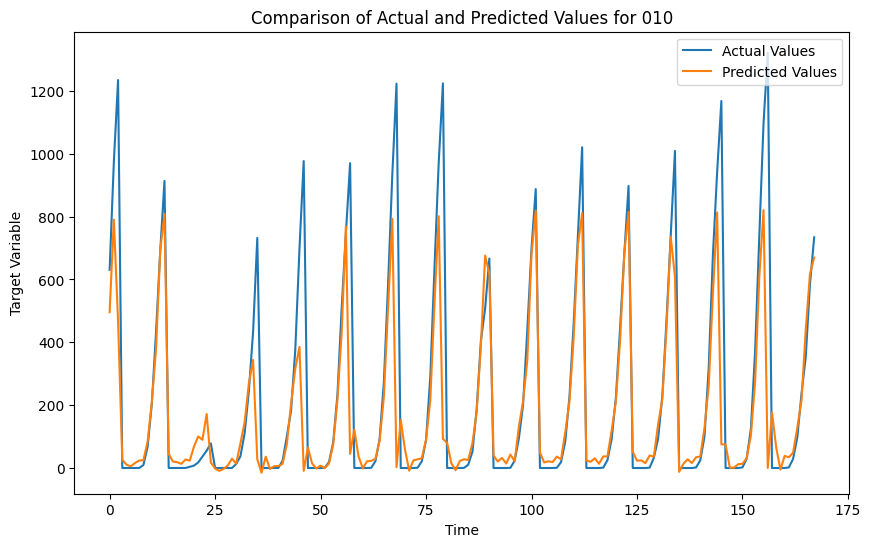

In [14]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from keras.models import load_model
import matplotlib.pyplot as plt

cols = ['eic_count', 'installed_capacity', 'temperature', 'dewpoint',
        'rain', 'snowfall', 'surface_pressure', 'cloudcover_total', 'windspeed_10m',
        'winddirection_10m', 'shortwave_radiation', 'direct_solar_radiation',
        'diffuse_radiation', 'lowest_price_per_mwh', 'highest_price_per_mwh',
        'elect_prices', 'target']



cluster_data = clustering[clustering['Cluster'] == 2]

n_future = 1  # Number of days we want to look into the future based on the past days.
n_past = 48 

# Initialize your scaler and model
scaler = StandardScaler()  # Assuming this should be fitted with training data elsewhere


# Process for each group in Cluster 2
results = []
for group, group_data in cluster_data.groupby(['county', 'product_type', 'is_business']):
    df = group_data[cols].astype(float)
    df_scaled= scaler.fit(df)
    df_scaled = scaler.transform(df)

    testX = []
    testY = []
    for i in range(n_past, len(df_scaled) - n_future + 1):
        testX.append(df_scaled[i - n_past:i])
        testY.append(df_scaled[i + n_future - 1:i + n_future, -1])  # Assuming the last column is still the target

    testX, testY = np.array(testX), np.array(testY)



    n_days_for_prediction = 168



    target_scaler = StandardScaler()
    target_scaler.fit(df[['target']])


# Predict on the last n_days_for_prediction
    prediction_scaled = model.predict(testX[-n_days_for_prediction:])
    prediction = target_scaler.inverse_transform(prediction_scaled)
    actual = target_scaler.inverse_transform(testY[-n_days_for_prediction:])

# Calculate the metrics
    r2 = r2_score(actual, prediction)
    mse = mean_squared_error(actual, prediction)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(actual, prediction)
    results.append({
        'group': group,
        'r2': r2,
        'mse': mse,
        'rmse': rmse,
        'mae': mae
    })
    
    for result in results:
        print(result)


# Plotting
    plt.figure(figsize=(10,6))
    plt.plot(actual, label='Actual Values')
    plt.plot(prediction, label='Predicted Values')
    plt.title(f'Comparison of Actual and Predicted Values for 010')
    plt.xlabel('Time')
    plt.ylabel('Target Variable')
    plt.legend()
    plt.show()


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}


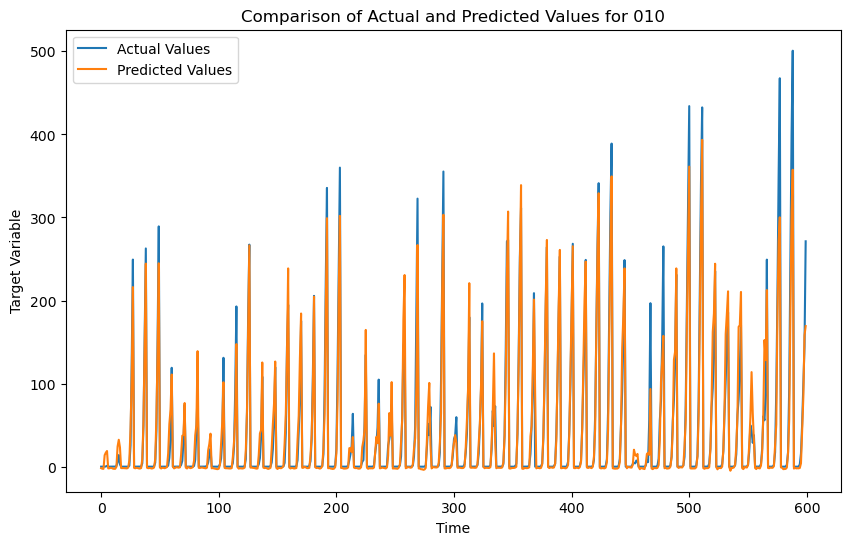

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}


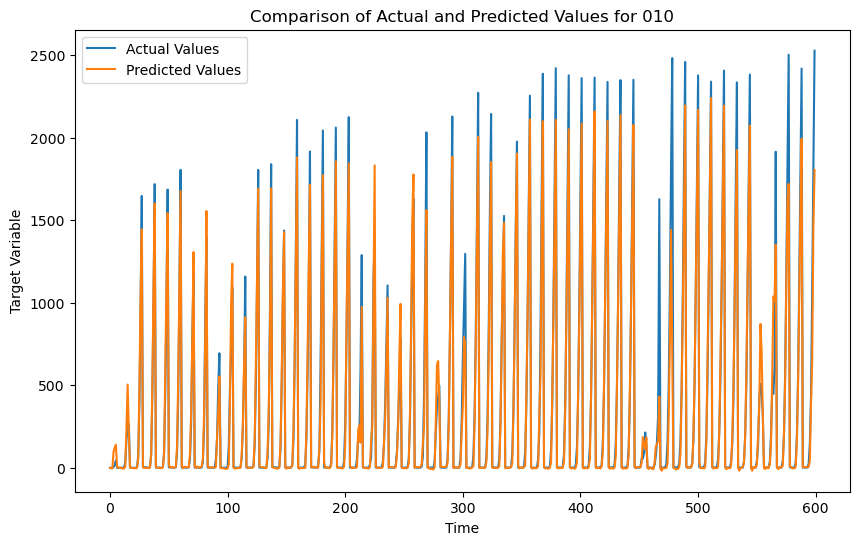

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}


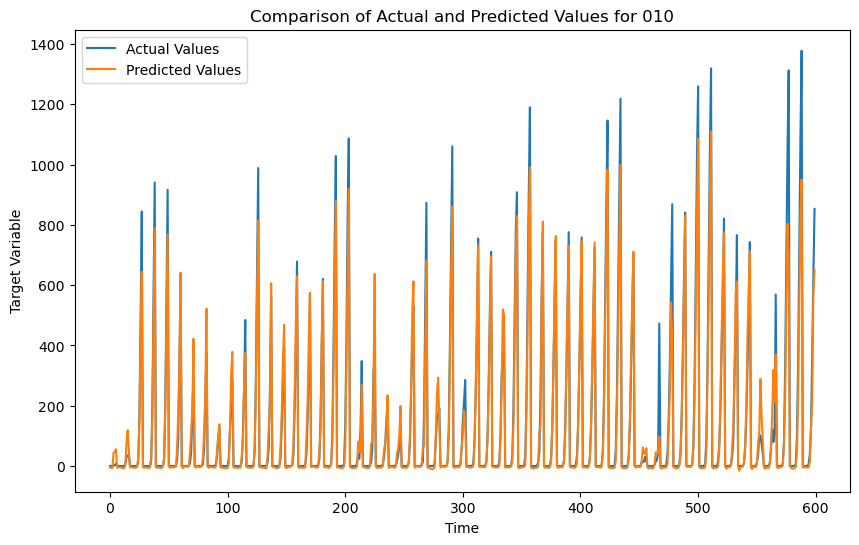

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}


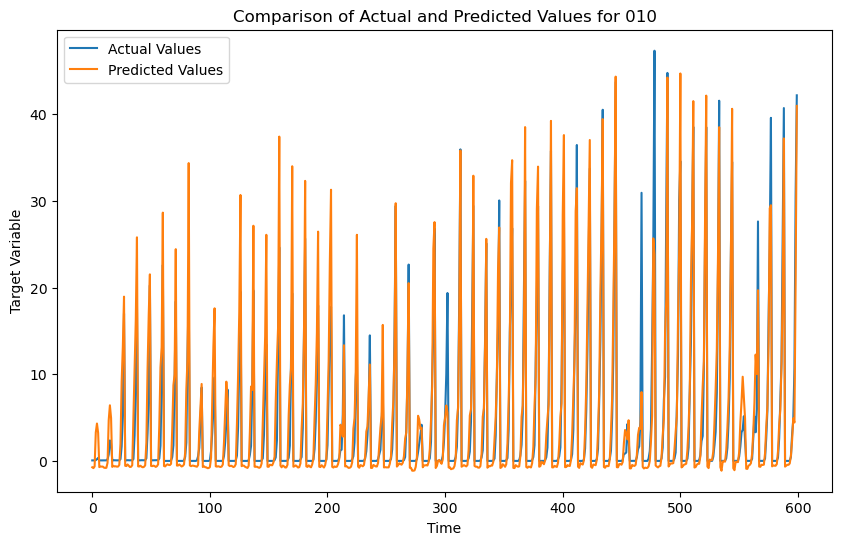

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}


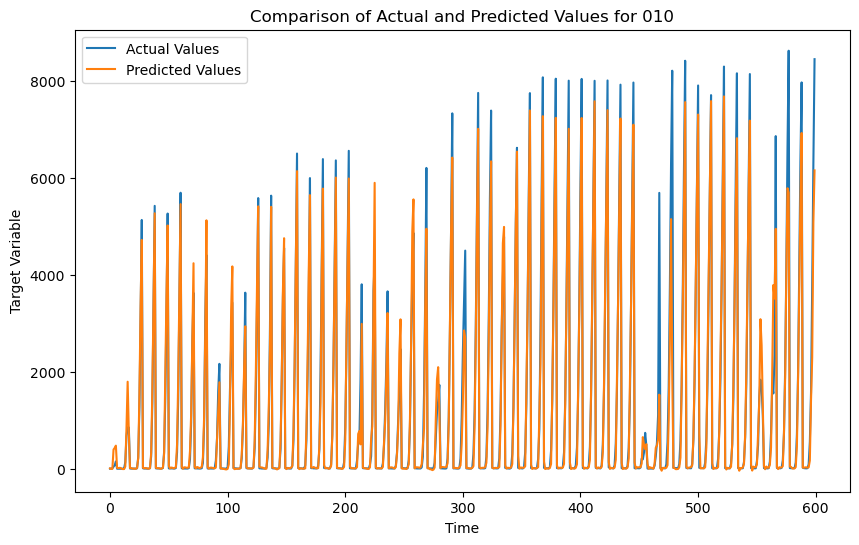

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}


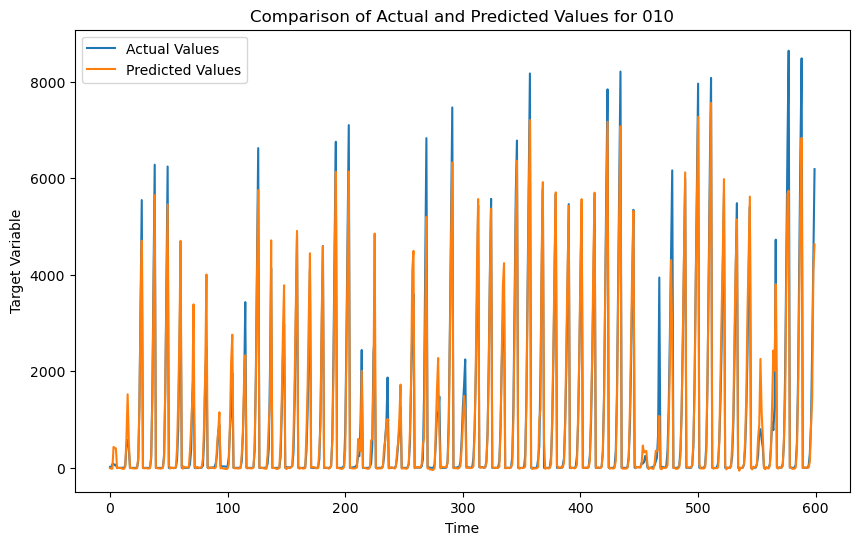

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}


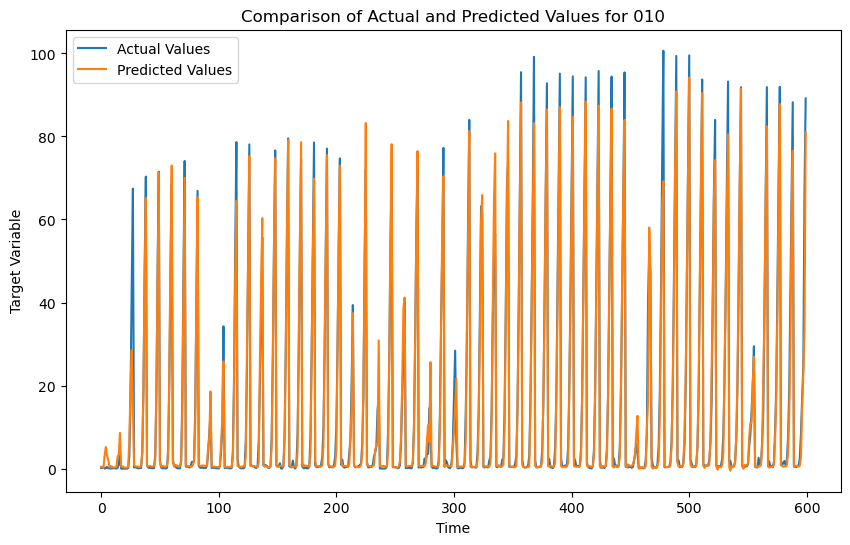

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

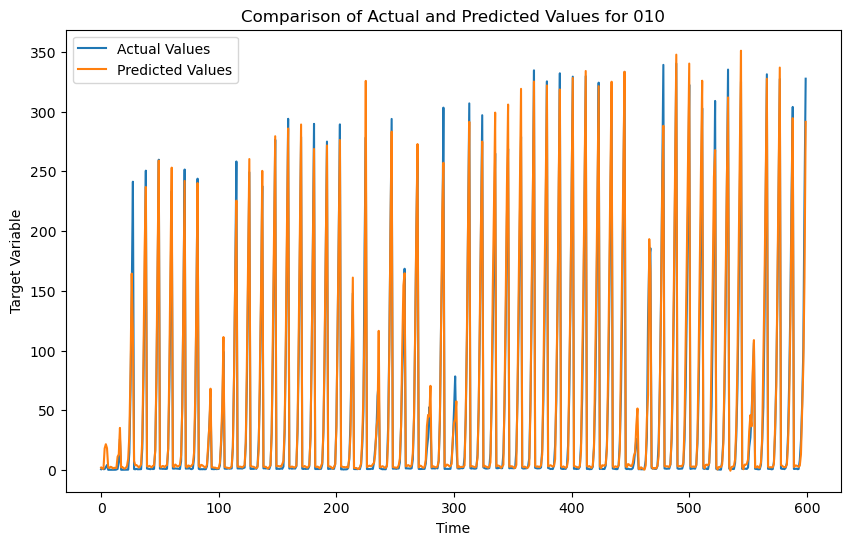


 1/19 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

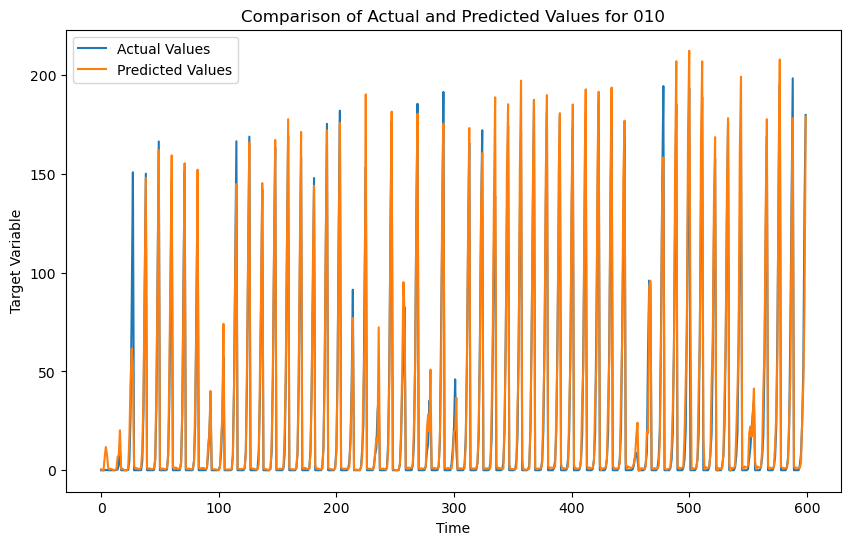


 1/19 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

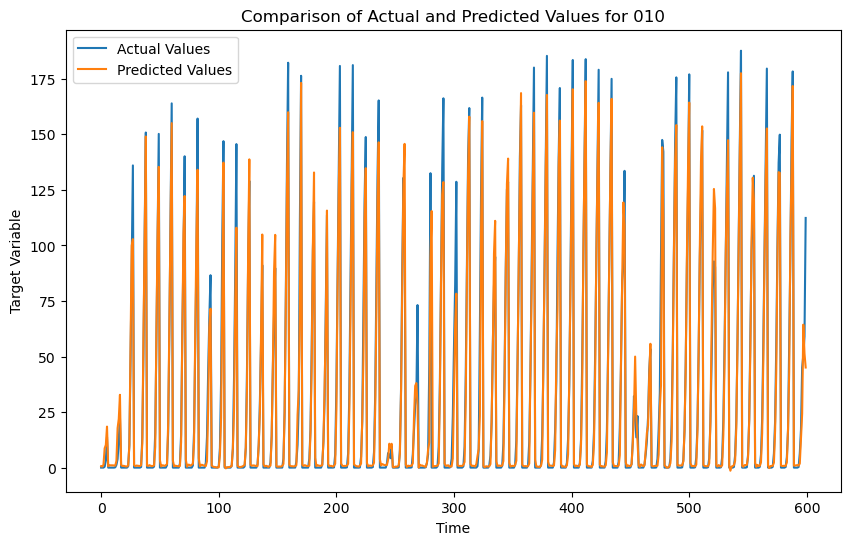


 1/19 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

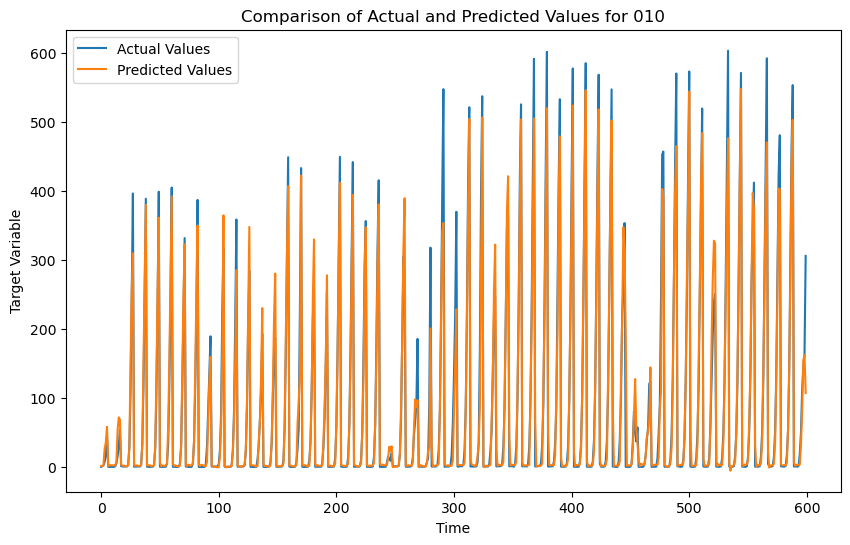

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

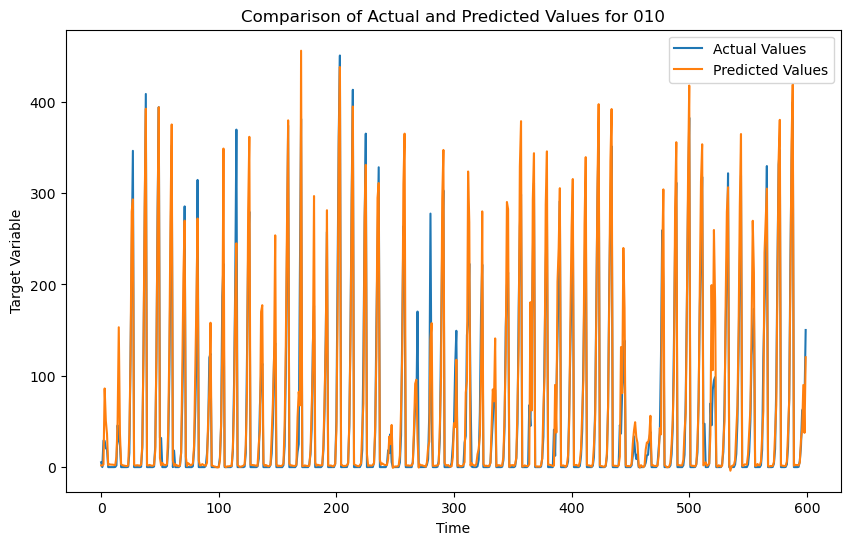


 1/19 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

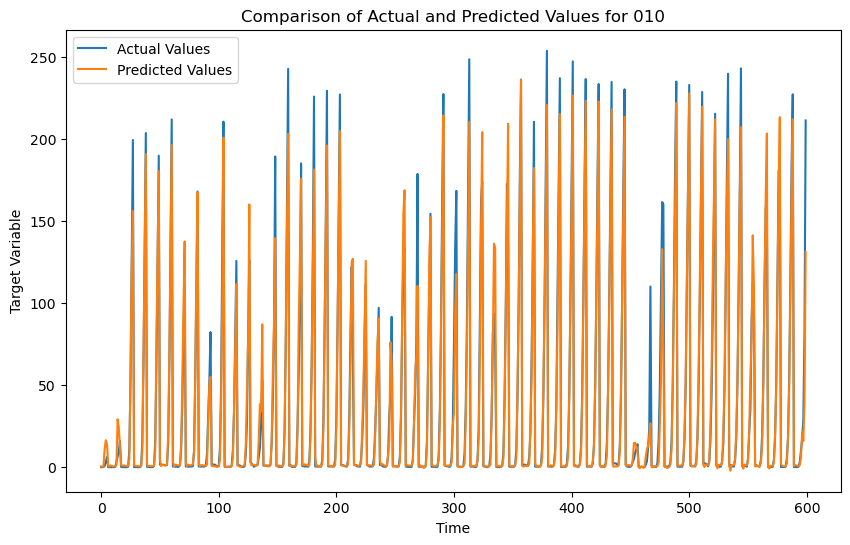

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

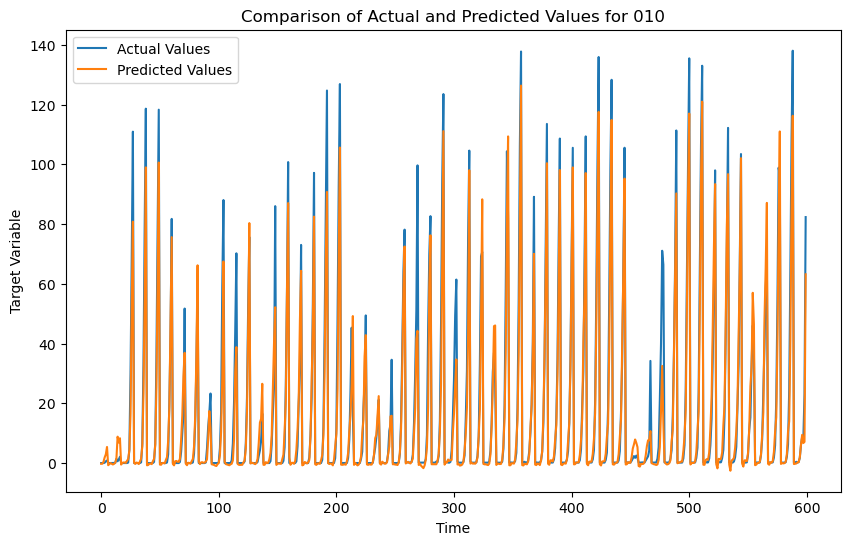

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

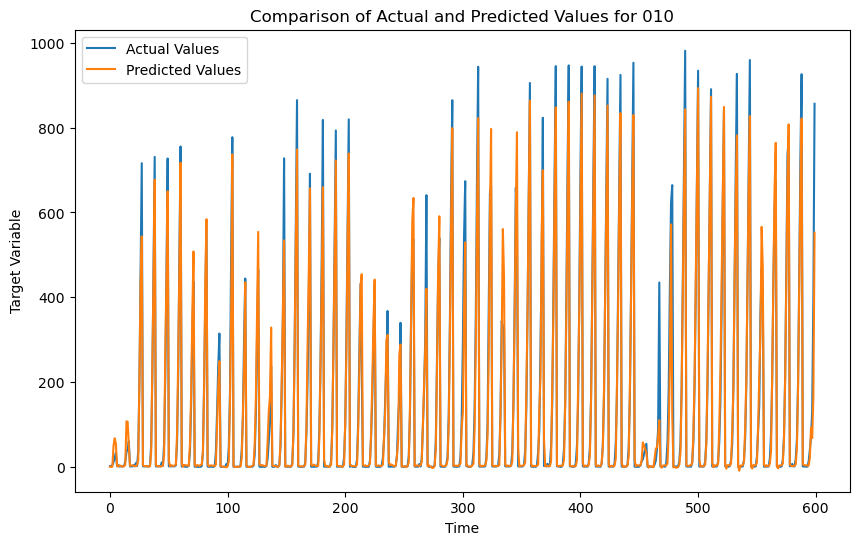

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

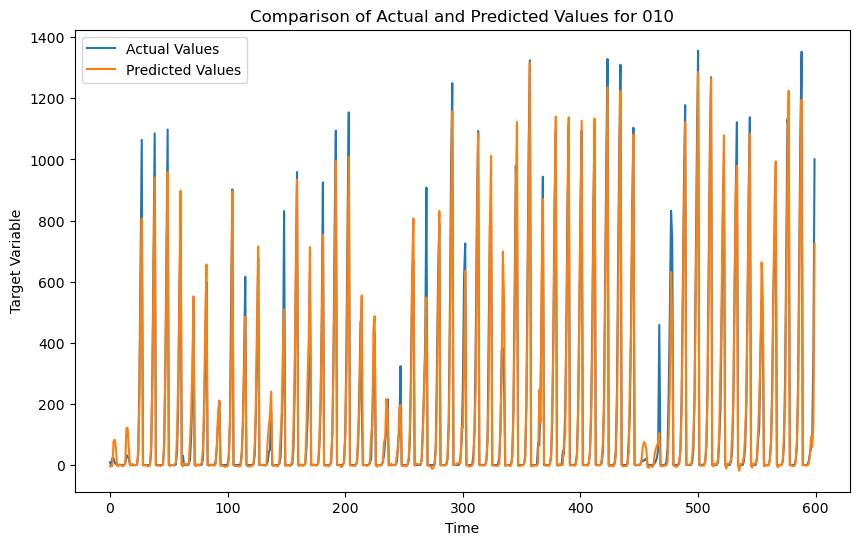


 1/19 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

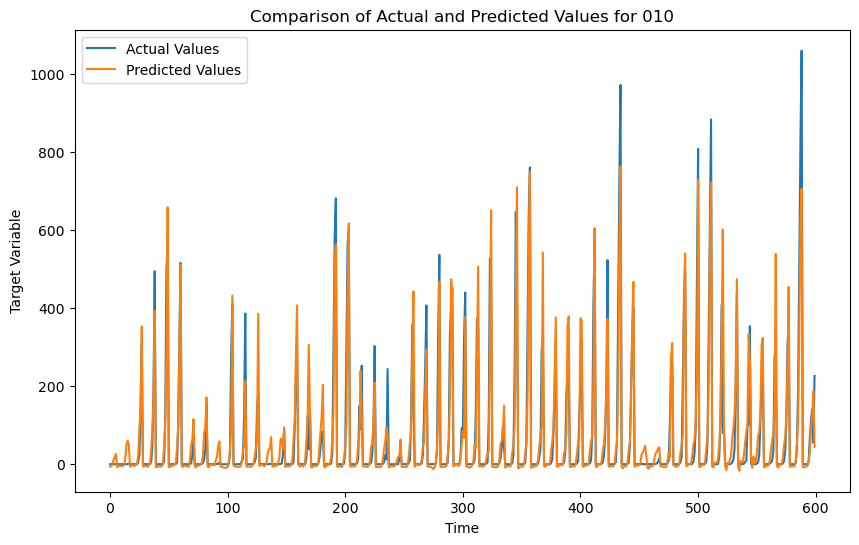


 1/19 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

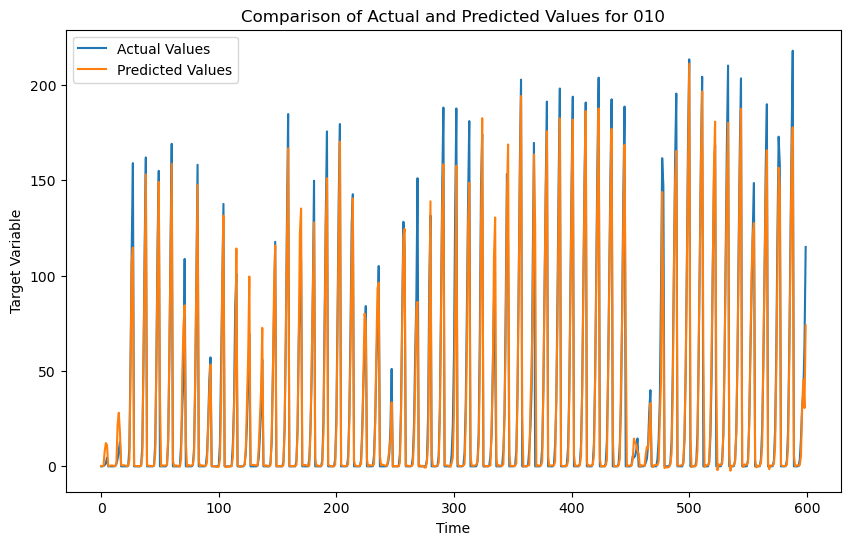


 1/19 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

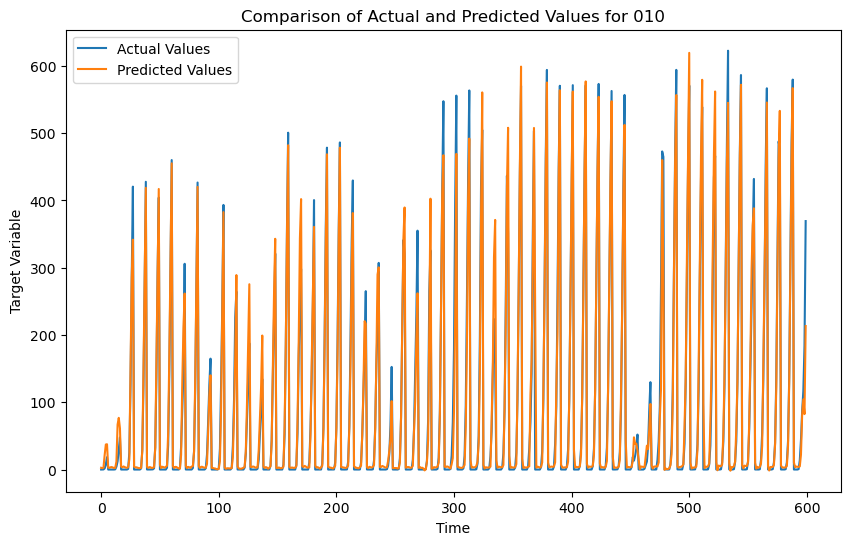

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

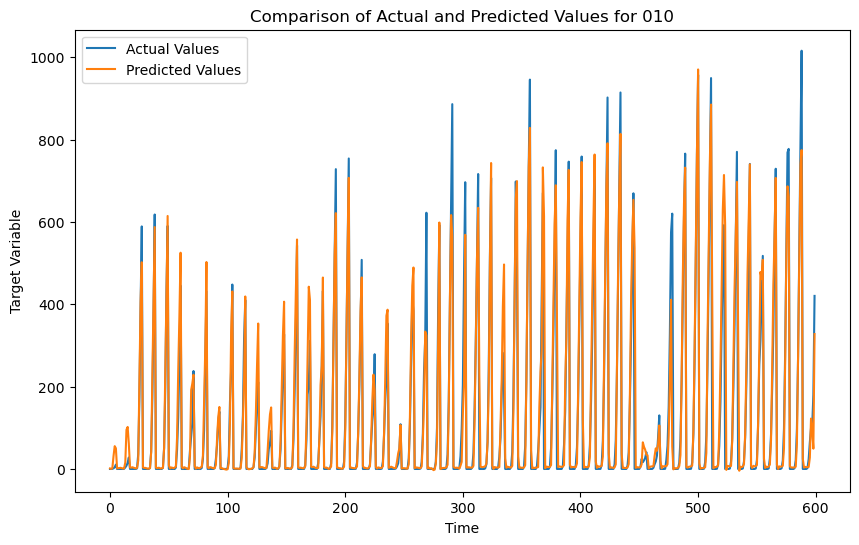


 1/19 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

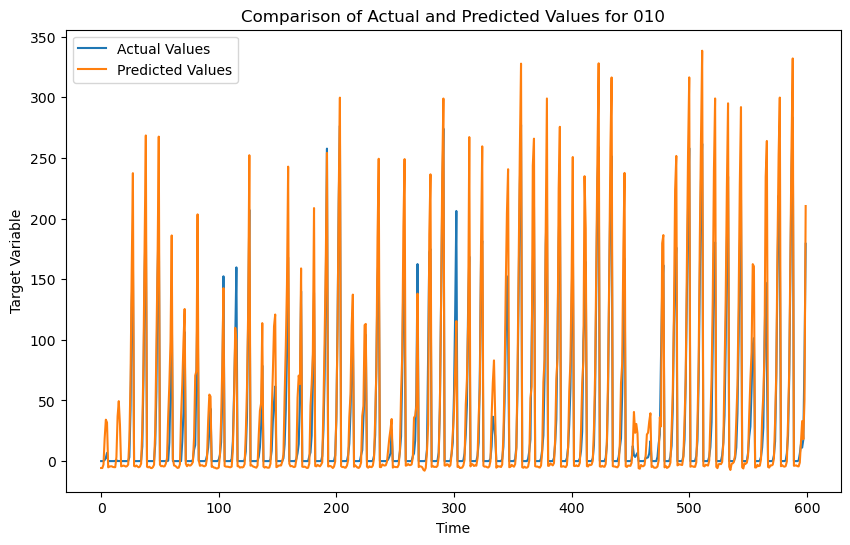

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

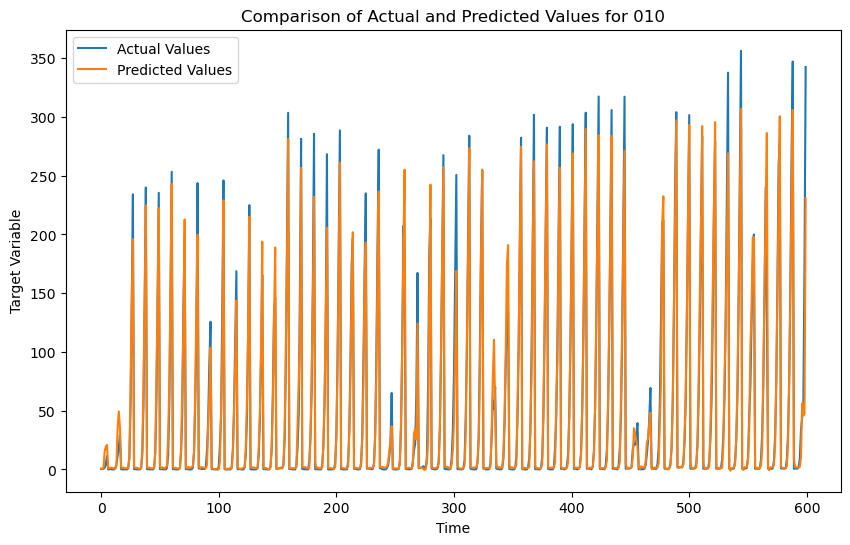

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

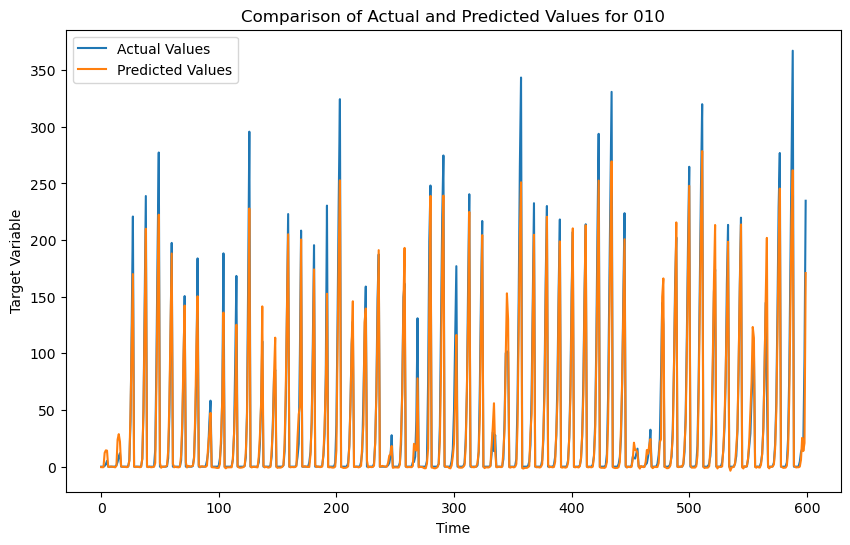

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

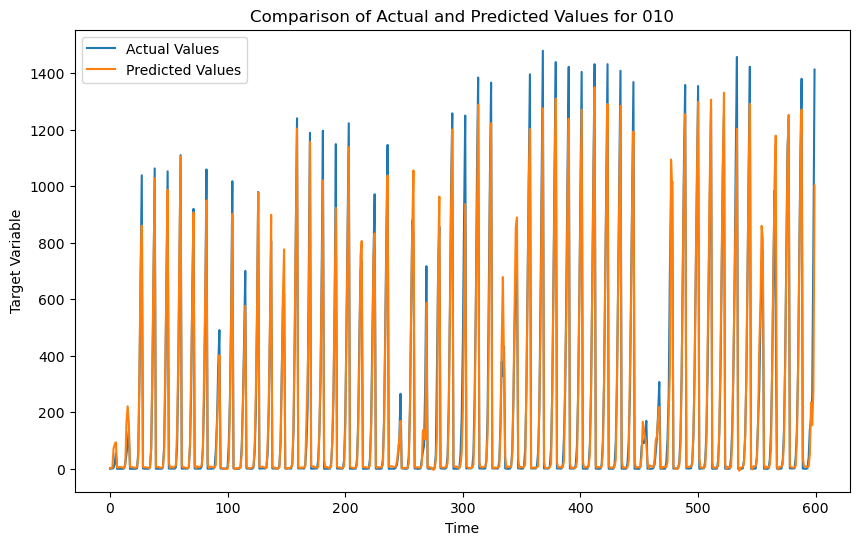


 1/19 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

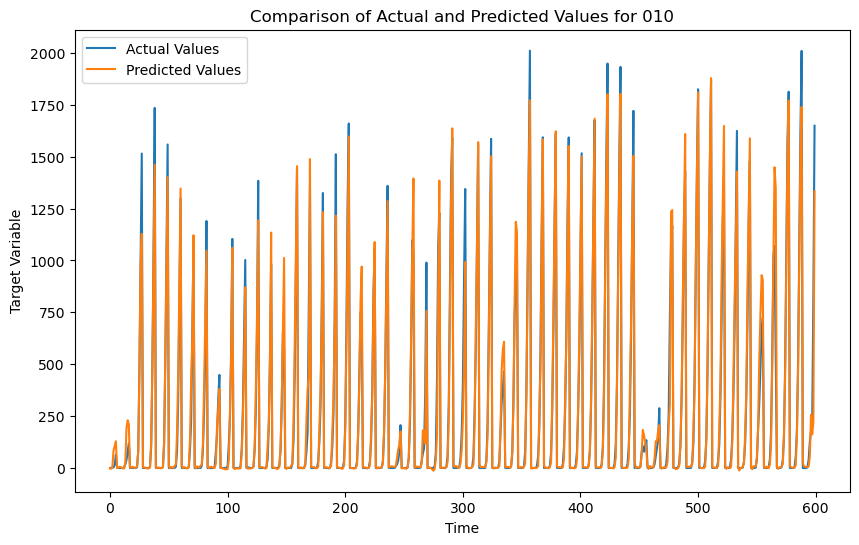

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

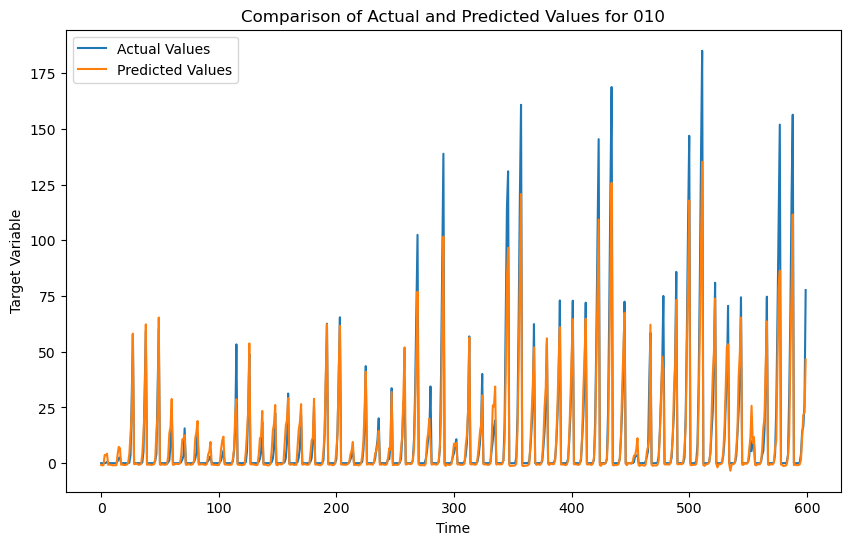

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

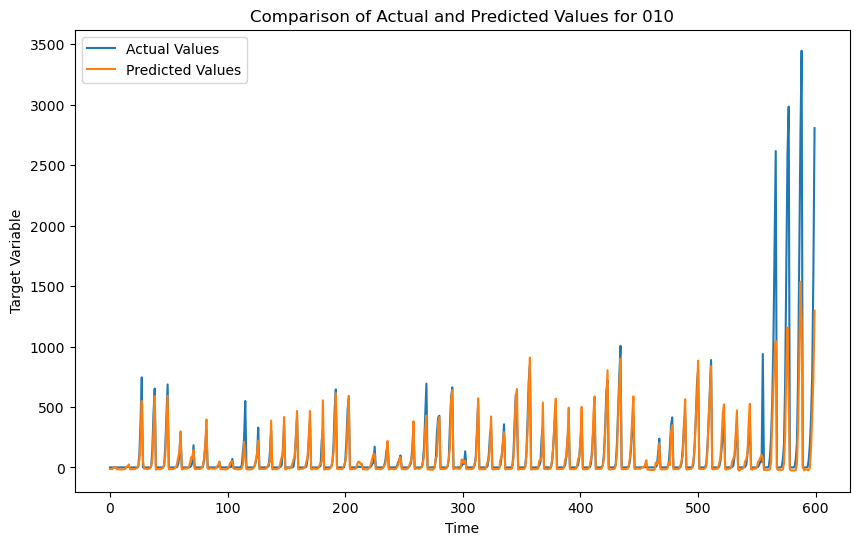

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

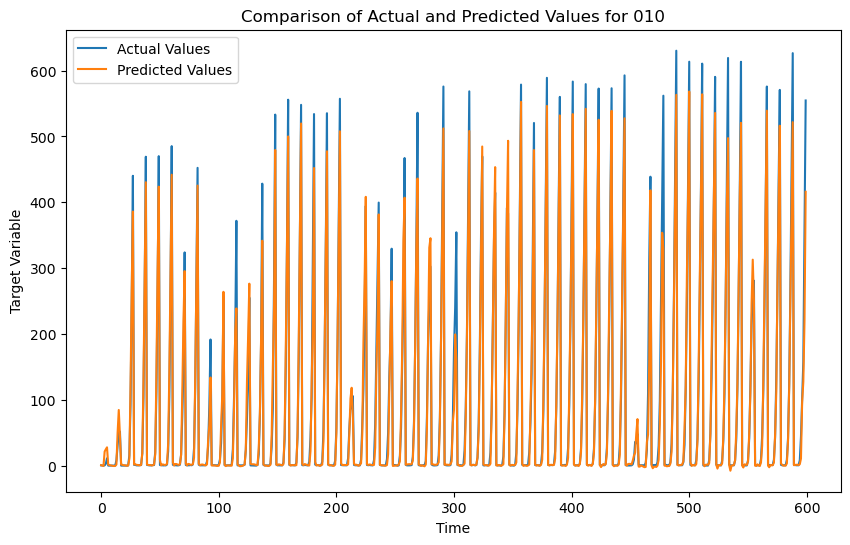

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

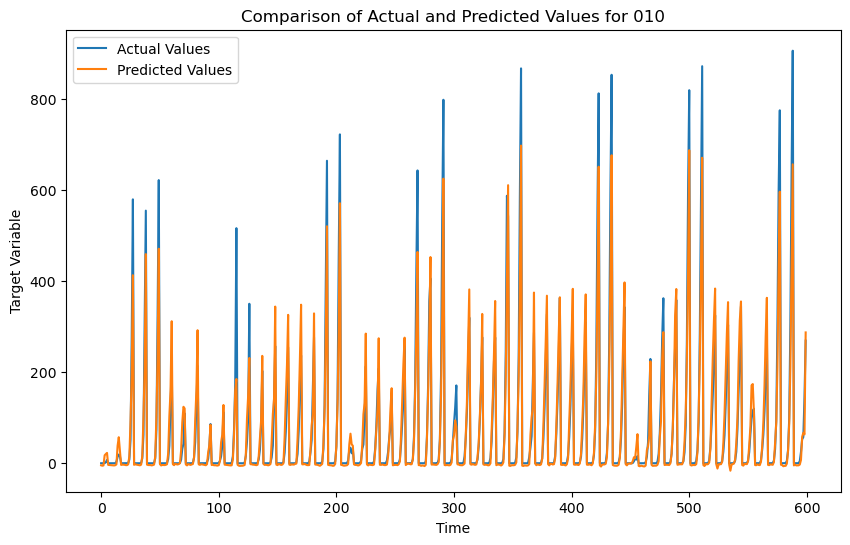


 1/19 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

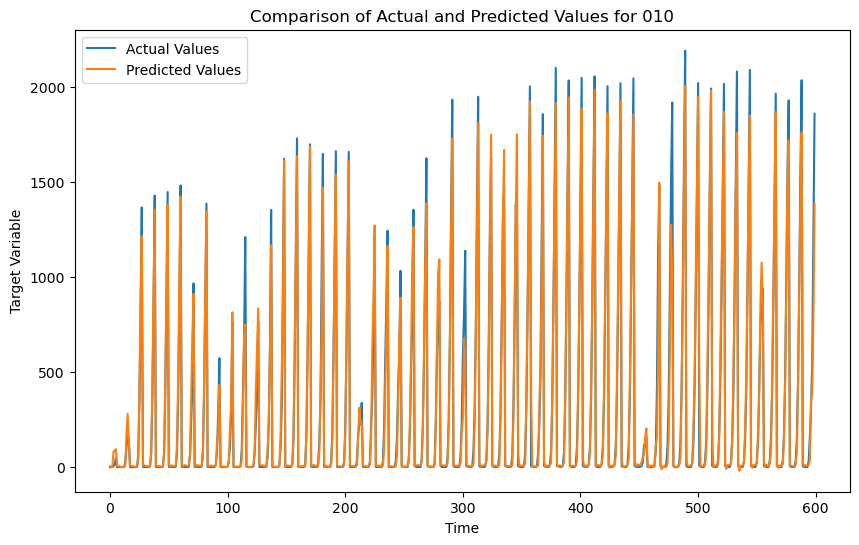


 1/19 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

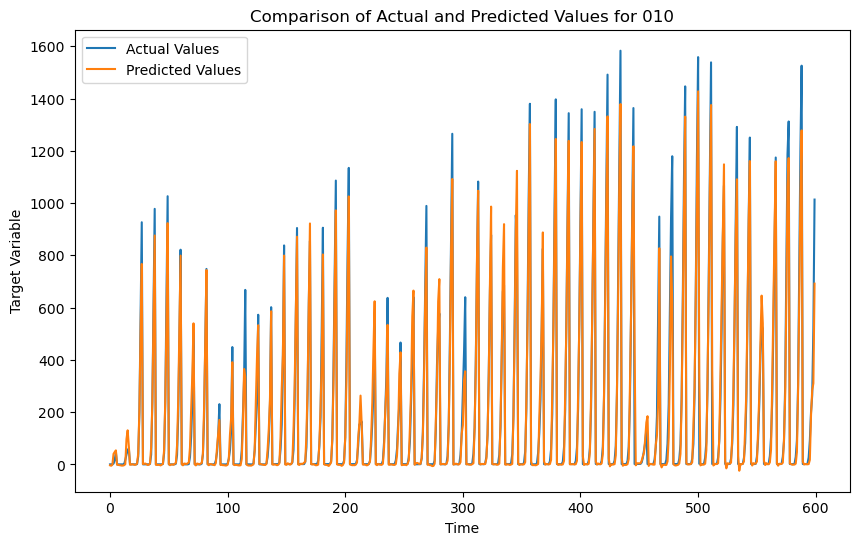

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

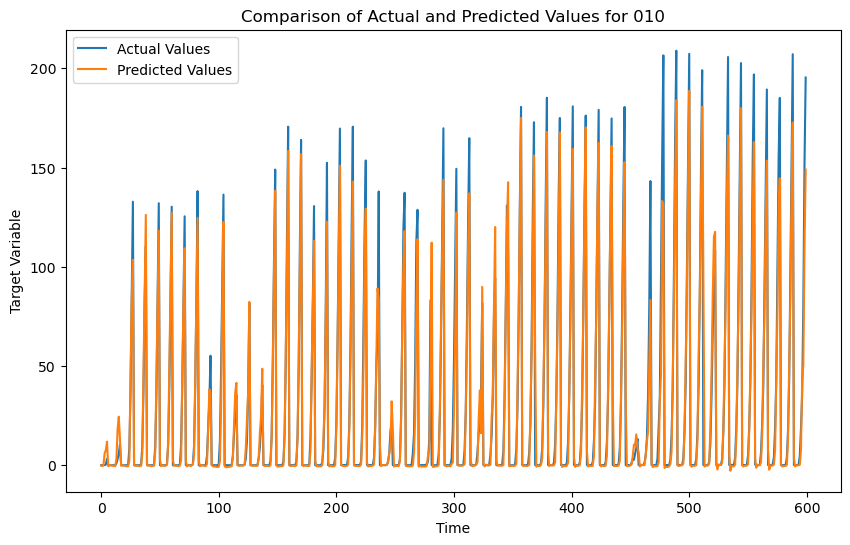

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

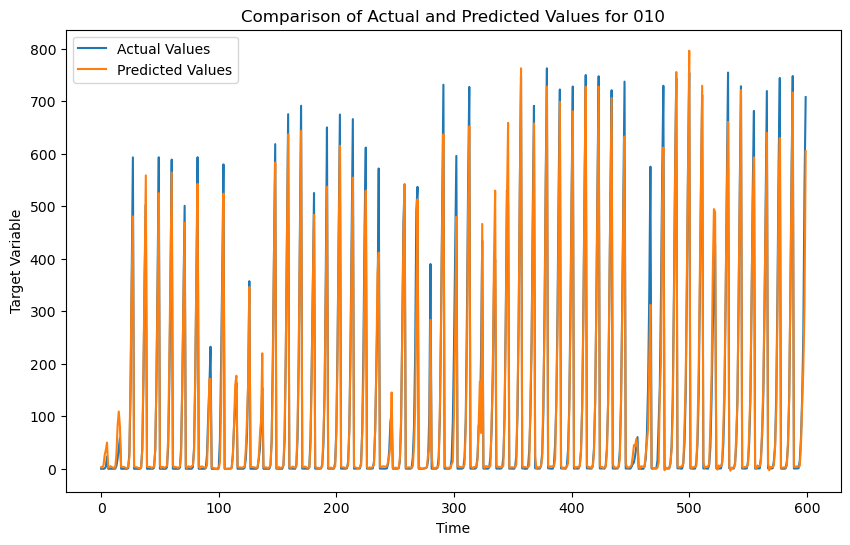

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

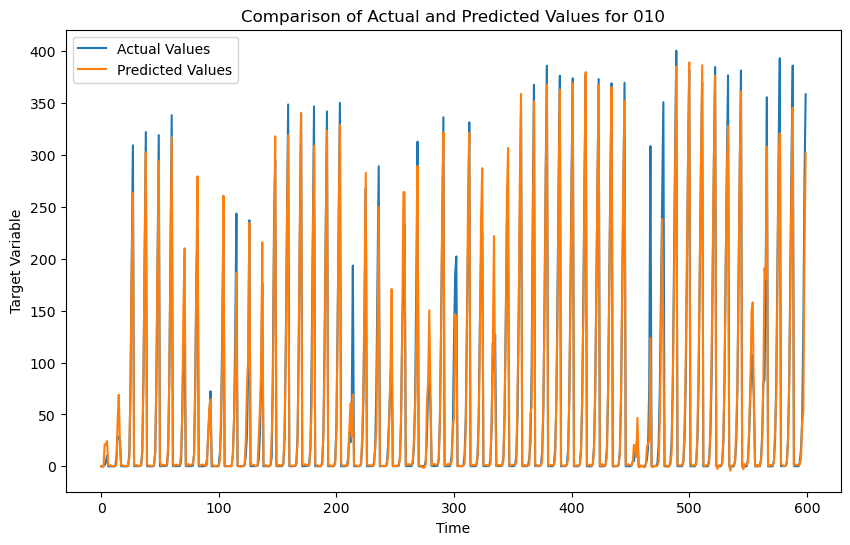

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

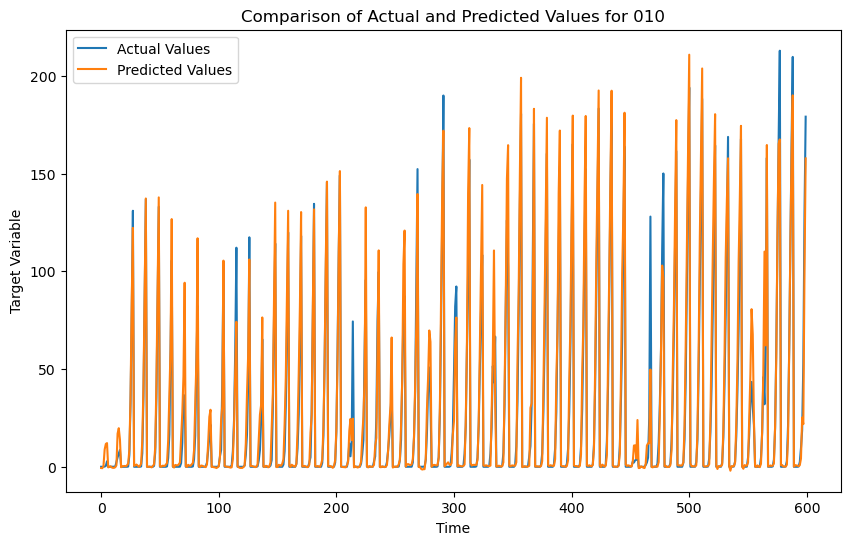

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

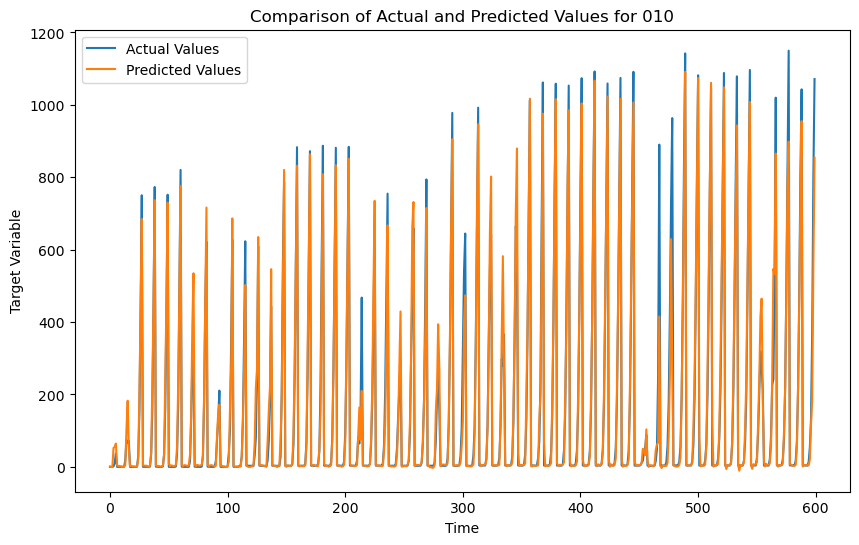


 1/19 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

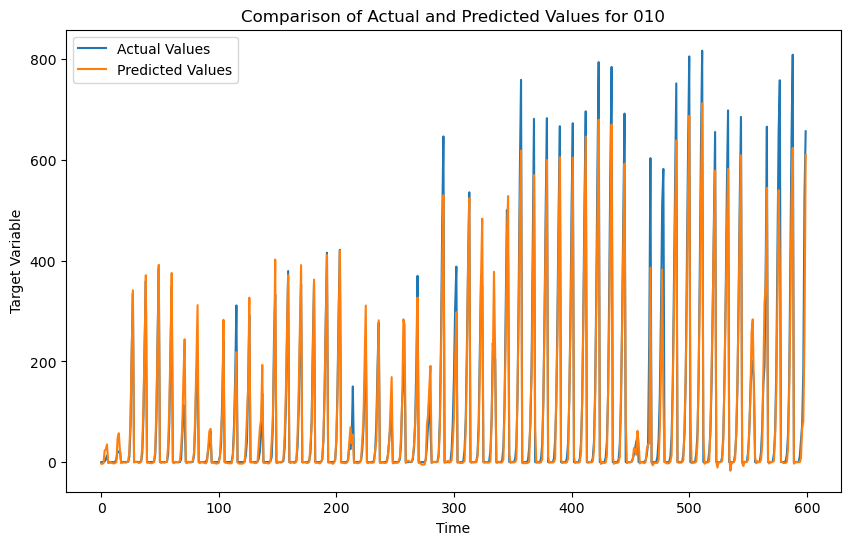


 1/19 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

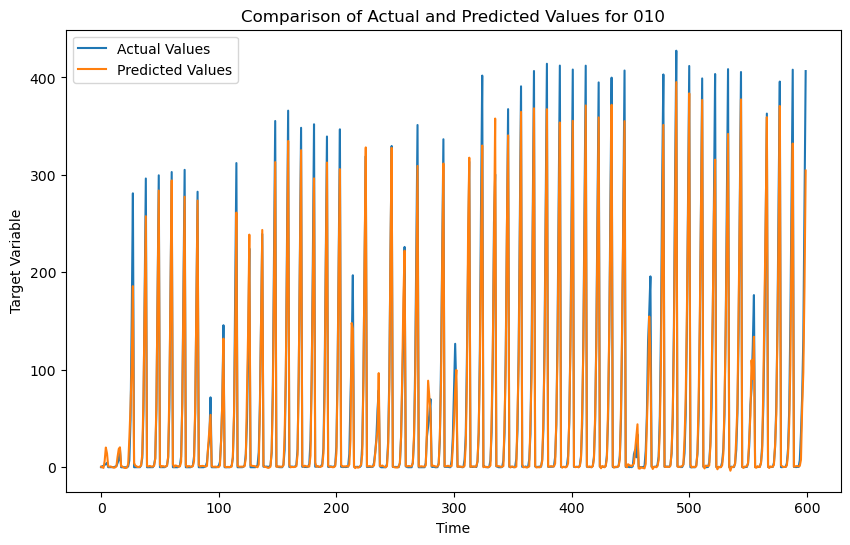


 1/19 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

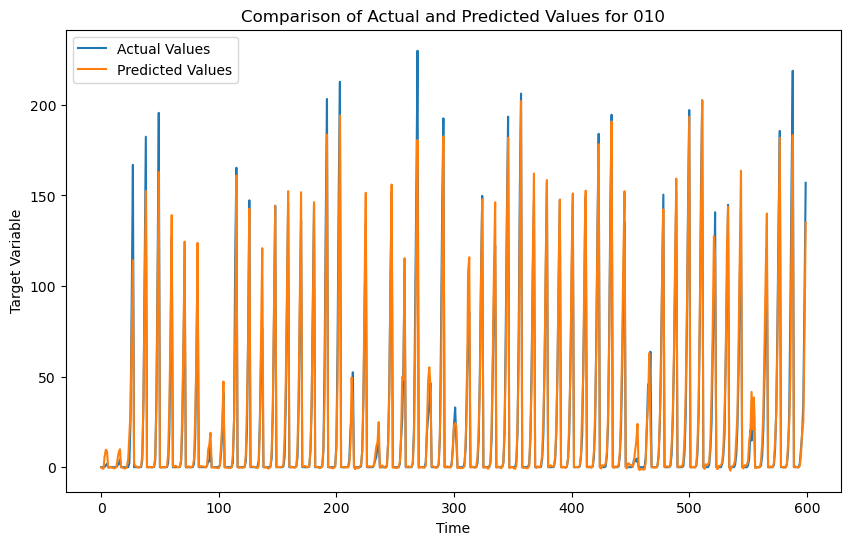

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

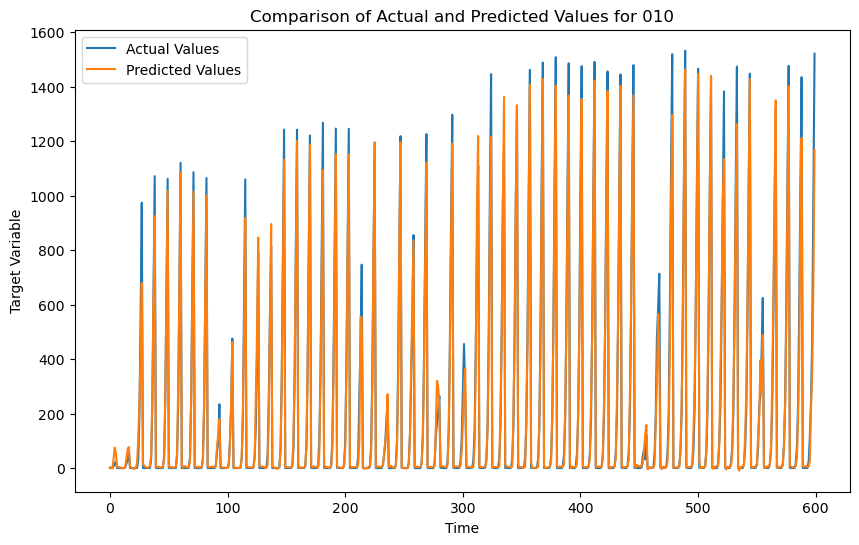

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

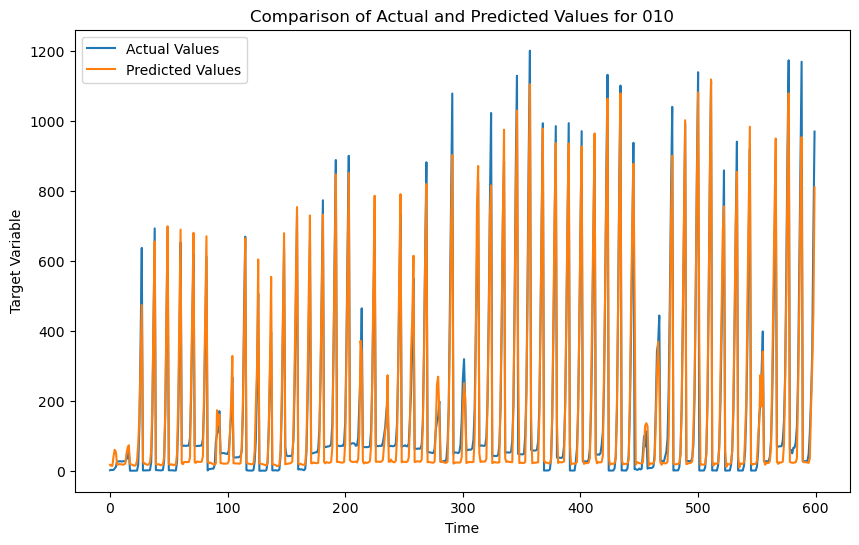


 1/19 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

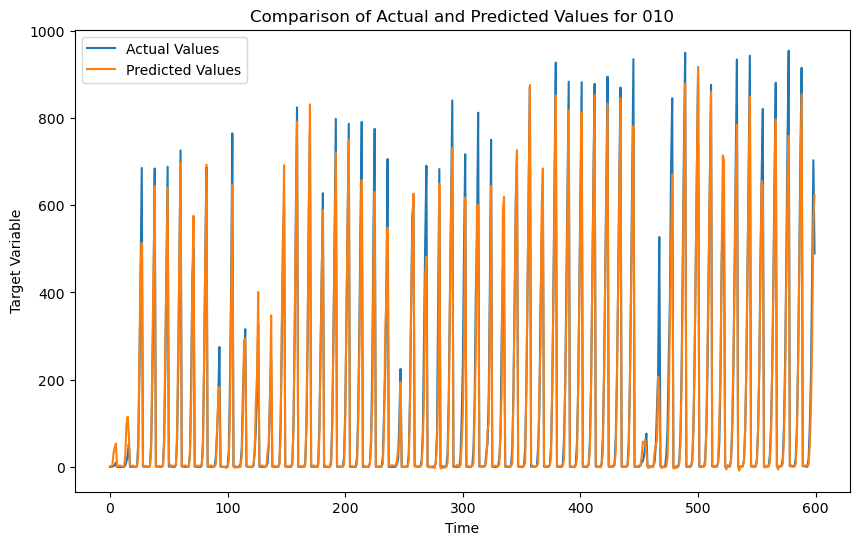


 1/19 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

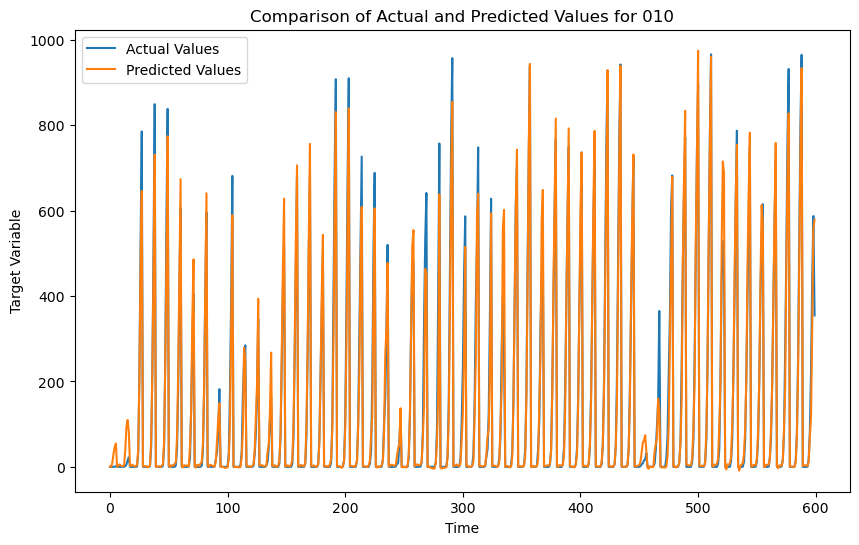


 1/19 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

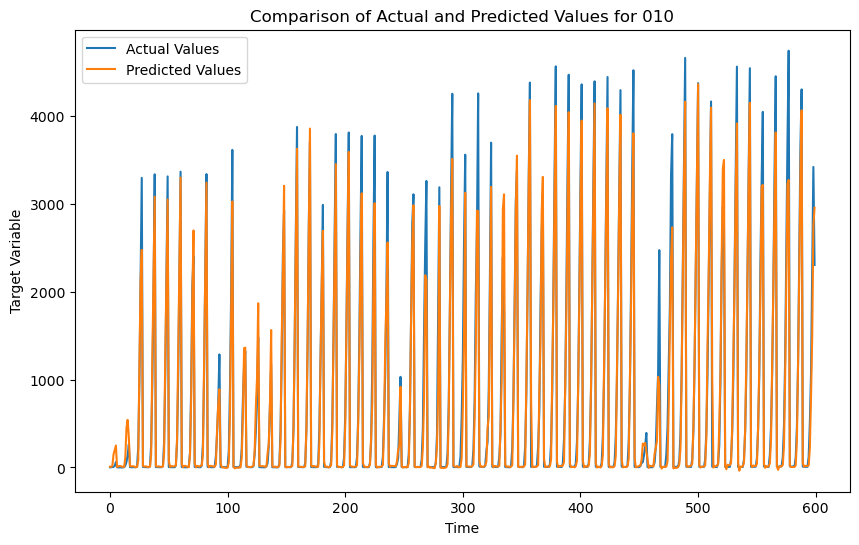


 1/19 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

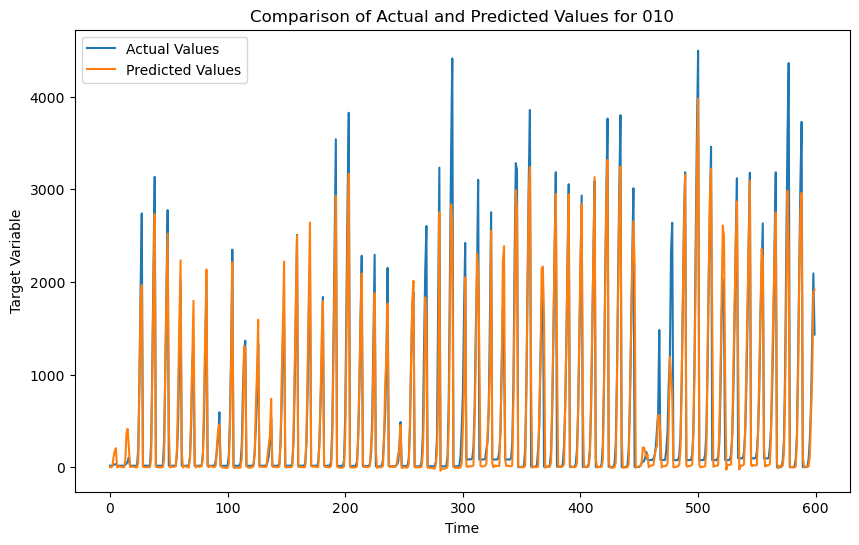

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

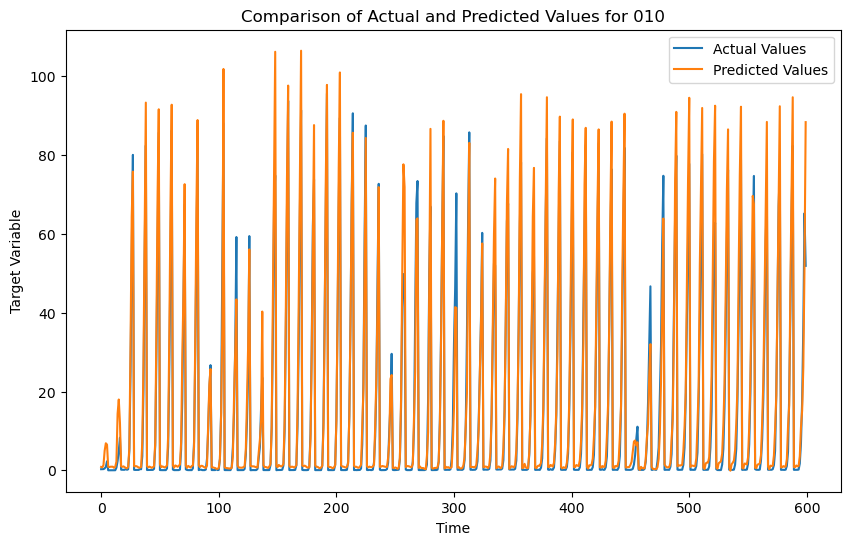


 1/19 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

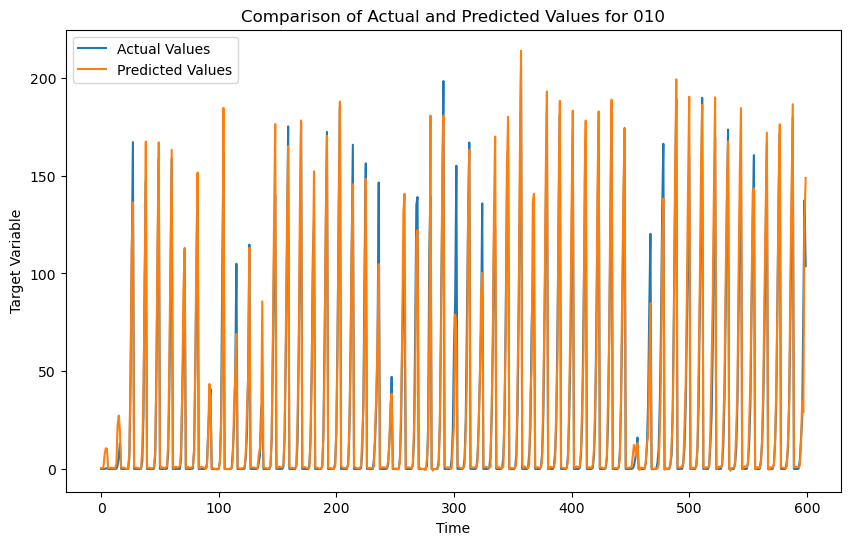


 1/19 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

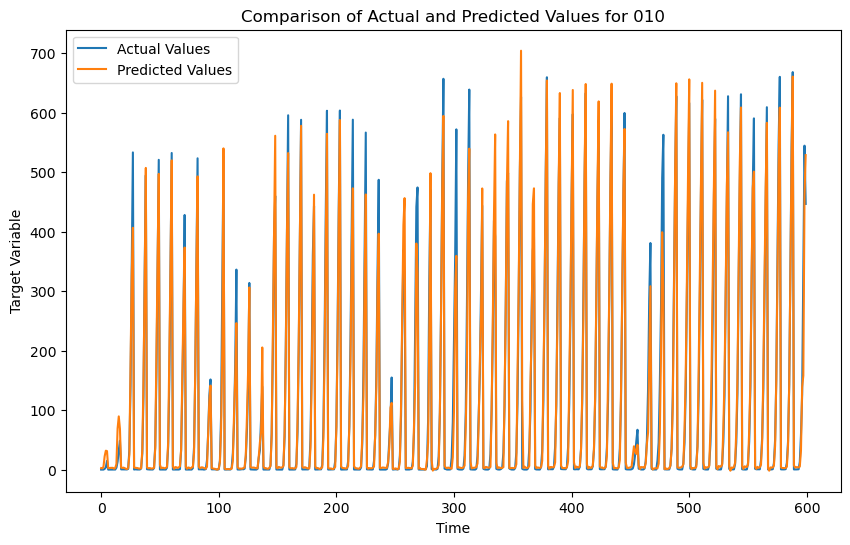

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

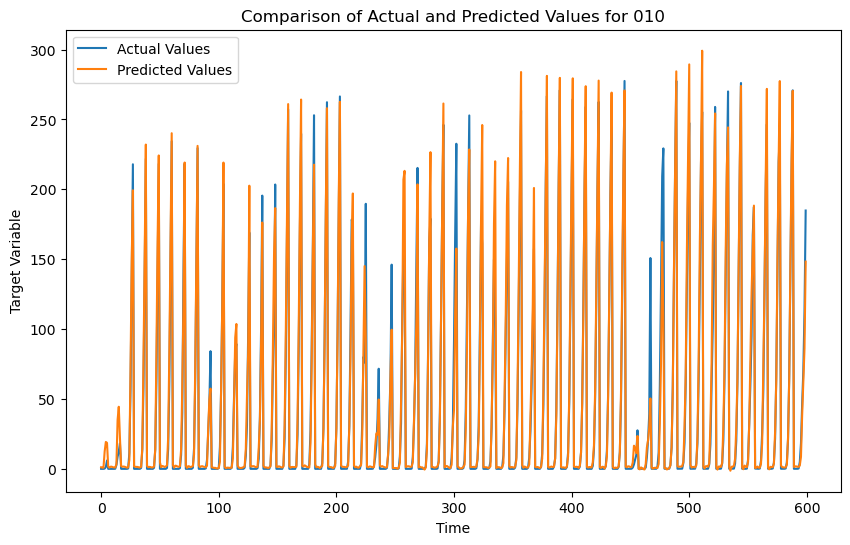


 1/19 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

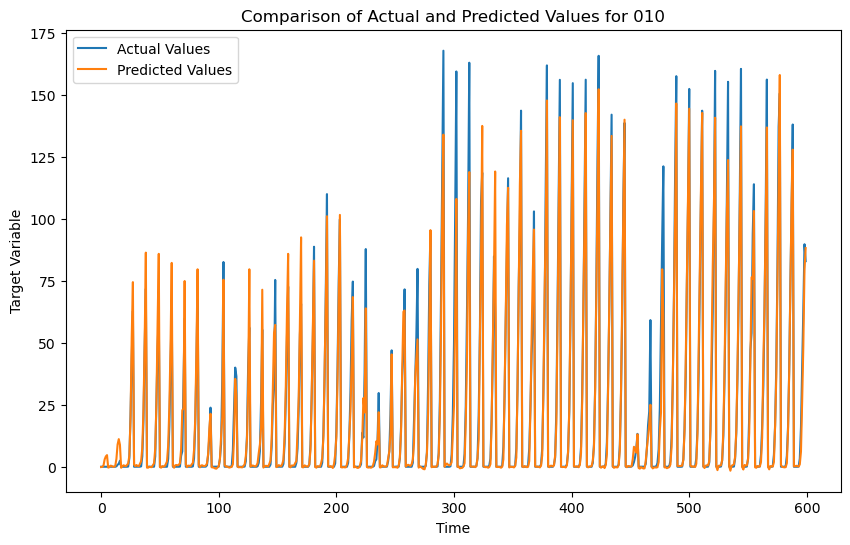


 1/19 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

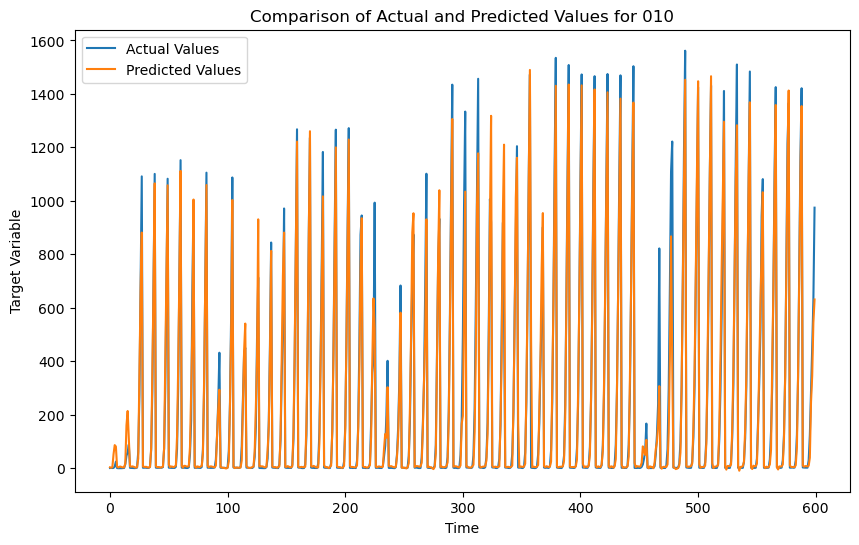


 1/19 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

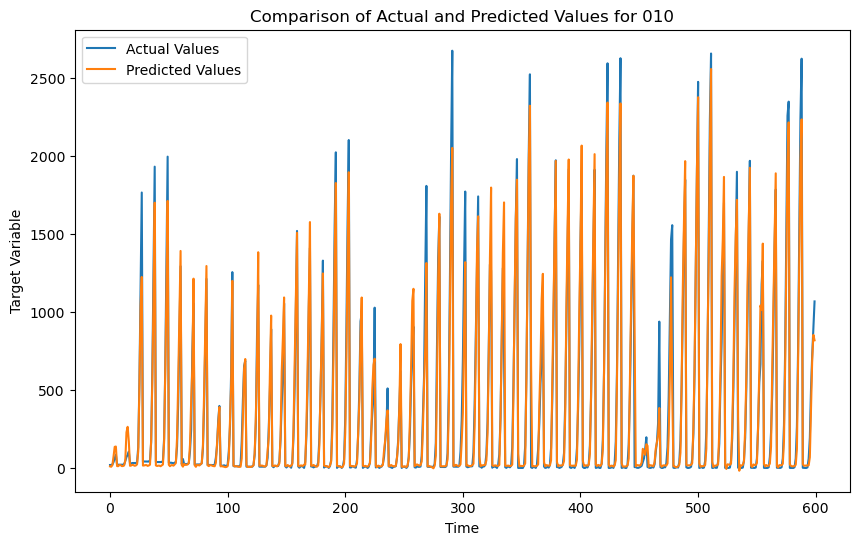

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

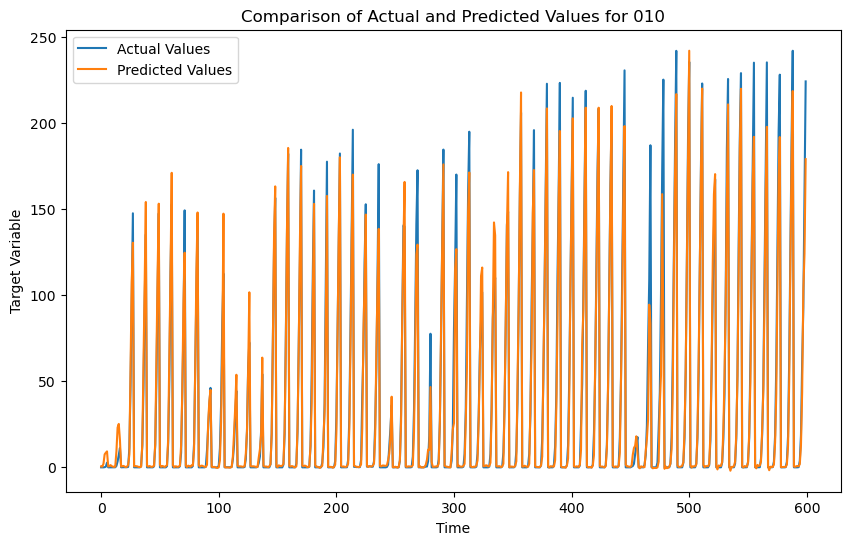


 1/19 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

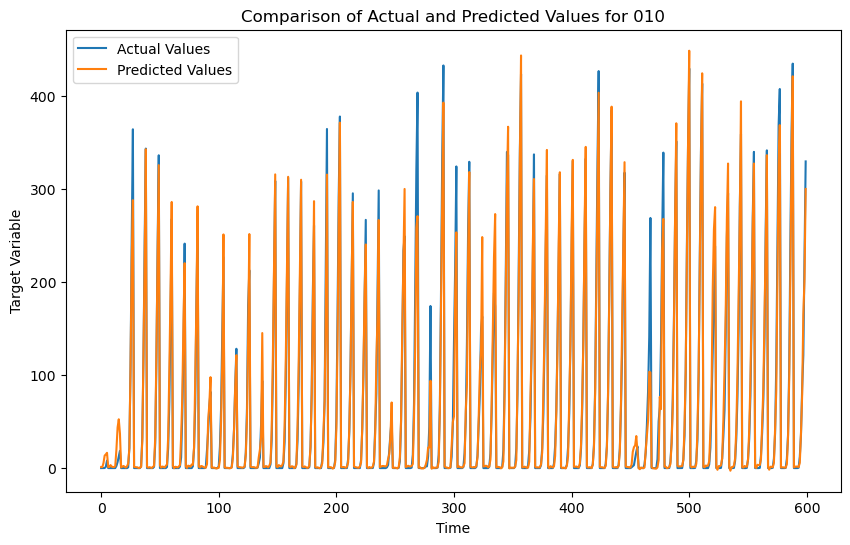


 1/19 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

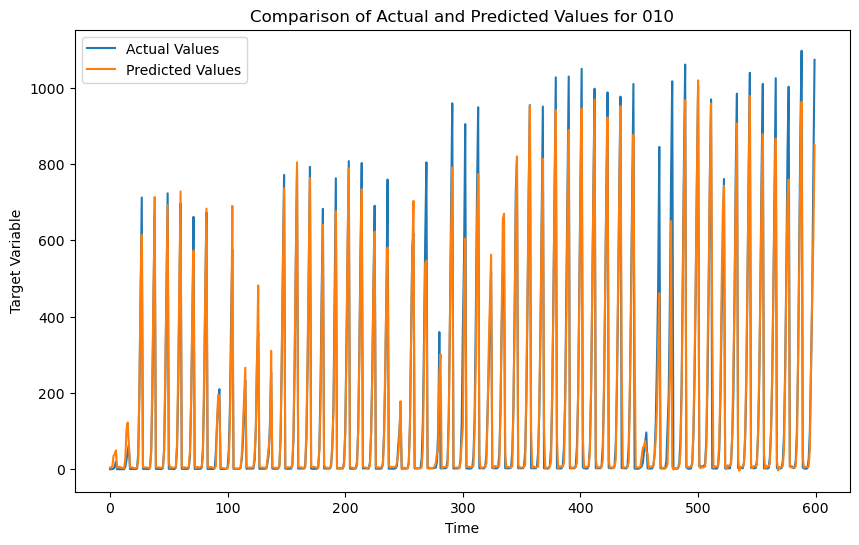


 1/19 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

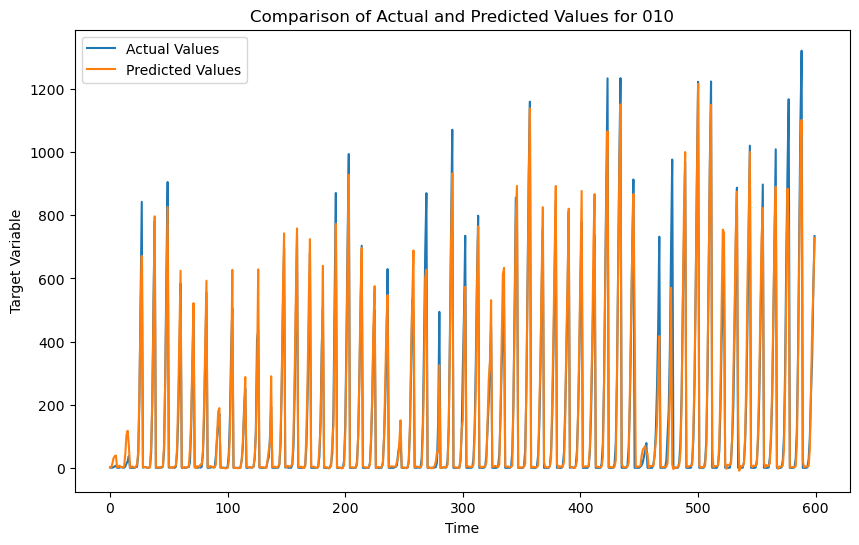

In [16]:


cluster_data = clustering[clustering['Cluster'] == 2]



# Initialize your scaler and model
scaler = StandardScaler()  # Assuming this should be fitted with training data elsewhere


# Process for each group in Cluster 2
results = []
for group, group_data in cluster_data.groupby(['county', 'product_type', 'is_business']):
    df = group_data[cols].astype(float)
    df_scaled= scaler.fit(df)
    df_scaled = scaler.transform(df)

    testX = []
    testY = []
    for i in range(n_past, len(df_scaled) - n_future + 1):
        testX.append(df_scaled[i - n_past:i])
        testY.append(df_scaled[i + n_future - 1:i + n_future, -1])  # Assuming the last column is still the target

    testX, testY = np.array(testX), np.array(testY)



    n_days_for_prediction = 600



    target_scaler = StandardScaler()
    target_scaler.fit(df[['target']])


# Predict on the last n_days_for_prediction
    prediction_scaled = model.predict(testX[-n_days_for_prediction:])
    prediction = target_scaler.inverse_transform(prediction_scaled)
    actual = target_scaler.inverse_transform(testY[-n_days_for_prediction:])

# Calculate the metrics
    r2 = r2_score(actual, prediction)
    mse = mean_squared_error(actual, prediction)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(actual, prediction)
    results.append({
        'group': group,
        'r2': r2,
        'mse': mse,
        'rmse': rmse,
        'mae': mae
    })
    
    for result in results:
        print(result)


# Plotting
    plt.figure(figsize=(10,6))
    plt.plot(actual, label='Actual Values')
    plt.plot(prediction, label='Predicted Values')
    plt.title(f'Comparison of Actual and Predicted Values for 010')
    plt.xlabel('Time')
    plt.ylabel('Target Variable')
    plt.legend()
    plt.show()

In [18]:
model.save('model_cluster2_production.h5')

# cluster1

In [17]:
grouped_data = data.groupby(['product_type','is_business','county'])

df1 = grouped_data.get_group((2,0,0))

train_size = int(len(df1) * 0.8)
train_df = df1[:train_size]
test_df = df1[train_size:]
cluster=pd.read_csv('../clustering/clutser_client_production_pdf.csv')
clustering=pd.merge(data,cluster, on=['product_type','is_business','county'],how='inner')

trainX shape == (5547, 48, 17).
trainY shape == (5547, 1).
Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 48, 10)            1120      
                                                                 
 dropout_3 (Dropout)         (None, 48, 10)            0         
                                                                 
 lstm_1 (LSTM)               (None, 10)                840       
                                                                 
 dropout_4 (Dropout)         (None, 10)                0         
                                                                 
 dense_3 (Dense)             (None, 1)                 11        
                                                                 
Total params: 1,971
Trainable params: 1,971
Non-trainable params: 0
___________________________________________________________

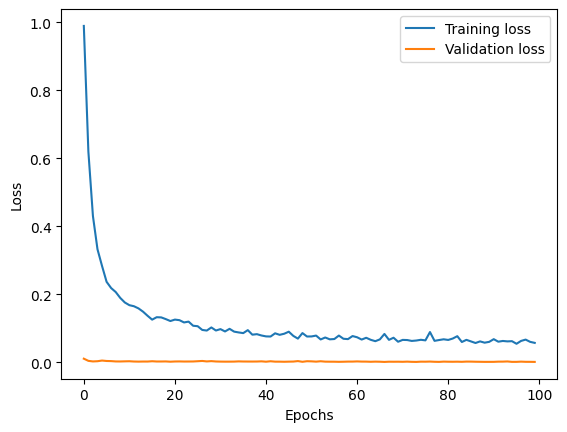

In [19]:
from keras.regularizers import l2 , l1
from keras.regularizers import L1L2  
# Define the columns for training
cols = ['eic_count', 'installed_capacity', 'temperature', 'dewpoint',
        'rain', 'snowfall', 'surface_pressure', 'cloudcover_total', 'windspeed_10m',
        'winddirection_10m', 'shortwave_radiation', 'direct_solar_radiation',
        'diffuse_radiation', 'lowest_price_per_mwh', 'highest_price_per_mwh',
        'elect_prices', 'target']

# Initialize an empty DataFrame to store the scaled data
scaled_data = pd.DataFrame()

df_for_training = train_df[cols].astype(float)
scaler = StandardScaler()
df_for_training_scaled = scaler.fit_transform(df_for_training)

trainX = []
trainY = []
n_future = 1  # Number of days we want to look into the future based on the past days.
n_past = 48 # Number of past days we want to use to predict the future.

for i in range(n_past, len(df_for_training_scaled) - n_future + 1):
    trainX.append(df_for_training_scaled[i - n_past:i])
    trainY.append(df_for_training_scaled[i + n_future - 1:i + n_future, -1])  # Target column is the last one

trainX, trainY = np.array(trainX), np.array(trainY)

print('trainX shape == {}.'.format(trainX.shape))
print('trainY shape == {}.'.format(trainY.shape))


model1 = Sequential()
# Adjusted the activation function to 'tanh', which is also the default if not specified
model1.add(LSTM(10, input_shape=(trainX.shape[1], trainX.shape[2]), return_sequences=True))
model1.add(Dropout(1e-5))
# Uncomment and adjust other layers as needed, ensuring activation functions and configurations are compatible
#model.add(GRU(64 ,activation='tanh', return_sequences=True))
#model.add(GRU(32, activation='tanh', return_sequences=True))
model1.add(LSTM(10, activation='tanh', return_sequences=False))

#model.add(GRU(32, return_sequences=False,  kernel_regularizer=L1L2(l1=0.01, l2=0.01))) # Activation defaults to 'tanh'
model1.add(Dropout(0.2))

model1.add(Dense(1))  # Output dimension is 1 as we're predicting a single value
model1.compile(optimizer='adam', loss='mse')
model1.summary()


history=model1.fit(trainX, trainY, epochs=100, batch_size=10, validation_split=0.1, verbose=1)





plt.plot(history.history['loss'], label='Training loss')
plt.plot(history.history['val_loss'], label='Validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()






6/6 [==============================] - 0s 4ms/step


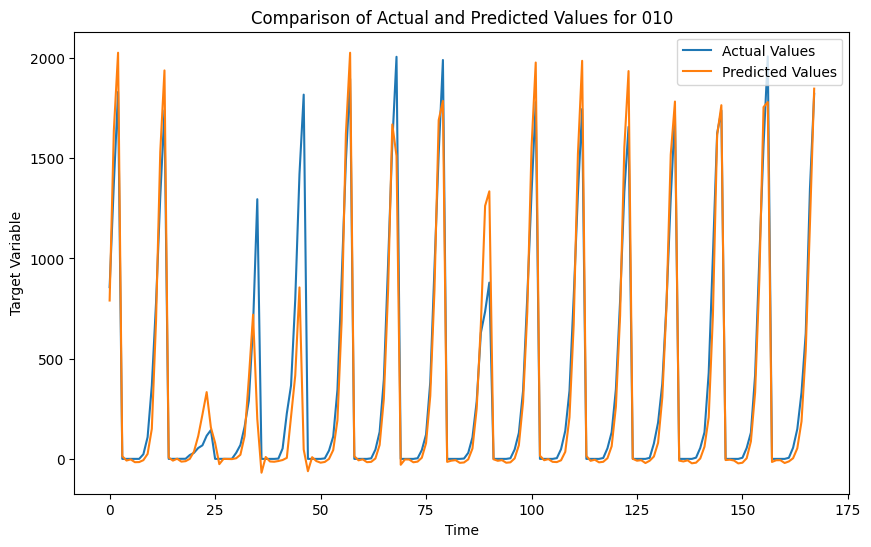

R2 Score: 0.882425794260963
MSE: 41957.34625488547
RMSE: 204.83492440227442
MAE: 93.52798201513788



In [31]:
df_test = test_df[cols].astype(float)

# Use the scaler from the training to transform the test data
df_test_scaled1= scaler.fit(df_test)
df_test_scaled = scaler.transform(df_test)

# Initialize the lists for testX and testY
testX = []
testY = []


# Prepare testX and testY
for i in range(n_past, len(df_test_scaled) - n_future + 1):
    testX.append(df_test_scaled[i - n_past:i])
    testY.append(df_test_scaled[i + n_future - 1:i + n_future, -1])  # Assuming the last column is still the target

testX, testY = np.array(testX), np.array(testY)



n_days_for_prediction = 168


target_scaler = StandardScaler()
target_scaler.fit(df_test[['target']])


# Predict on the last n_days_for_prediction
prediction_scaled = model1.predict(testX[-n_days_for_prediction:])
prediction = target_scaler.inverse_transform(prediction_scaled)
actual = target_scaler.inverse_transform(testY[-n_days_for_prediction:])
actual = np.repeat(actual, prediction.shape[1], axis=-1)


# Calculate the metrics
r2 = r2_score(actual, prediction)
mse = mean_squared_error(actual, prediction)
rmse = np.sqrt(mse)
mae = mean_absolute_error(actual, prediction)

# Plotting
plt.figure(figsize=(10,6))
plt.plot(actual, label='Actual Values')
plt.plot(prediction, label='Predicted Values')
plt.title(f'Comparison of Actual and Predicted Values for 010')
plt.xlabel('Time')
plt.ylabel('Target Variable')
plt.legend()
plt.show()


print(f"R2 Score: {r2}")
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")
print(f"MAE: {mae}\n")

6/6 [==============================] - 1s 6ms/step
{'group': (0, 2, 0), 'r2': 0.2922274277812985, 'mse': 26.993691730591177, 'rmse': 5.195545373740006, 'mae': 2.86655410860414}


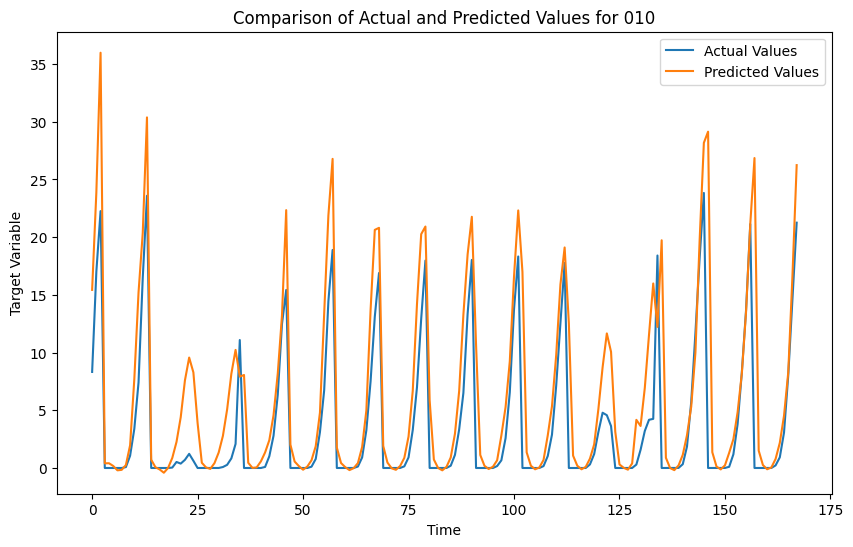

6/6 [==============================] - 0s 6ms/step
{'group': (0, 2, 0), 'r2': 0.2922274277812985, 'mse': 26.993691730591177, 'rmse': 5.195545373740006, 'mae': 2.86655410860414}
{'group': (15, 0, 1), 'r2': 0.7475559828399755, 'mse': 1321.7071736483335, 'rmse': 36.355290861831016, 'mae': 15.571454746650087}


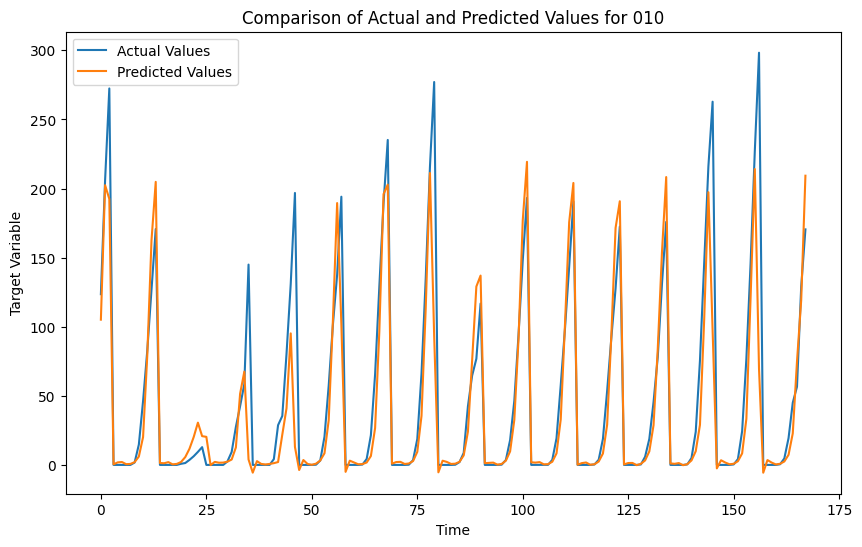

In [30]:
cluster_data = clustering[clustering['Cluster'] == 1]



# Initialize your scaler and model
scaler = StandardScaler()  # Assuming this should be fitted with training data elsewhere


# Process for each group in Cluster 2
results = []
for group, group_data in cluster_data.groupby(['county', 'product_type', 'is_business']):
    df = group_data[cols].astype(float)
    df_scaled= scaler.fit(df)
    df_scaled = scaler.transform(df)

    testX = []
    testY = []
    for i in range(n_past, len(df_scaled) - n_future + 1):
        testX.append(df_scaled[i - n_past:i])
        testY.append(df_scaled[i + n_future - 1:i + n_future, -1])  # Assuming the last column is still the target

    testX, testY = np.array(testX), np.array(testY)



    n_days_for_prediction = 168



    target_scaler = StandardScaler()
    target_scaler.fit(df[['target']])


# Predict on the last n_days_for_prediction
    prediction_scaled = model1.predict(testX[-n_days_for_prediction:])
    prediction = target_scaler.inverse_transform(prediction_scaled)
    actual = target_scaler.inverse_transform(testY[-n_days_for_prediction:])

# Calculate the metrics
    r2 = r2_score(actual, prediction)
    mse = mean_squared_error(actual, prediction)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(actual, prediction)
    results.append({
        'group': group,
        'r2': r2,
        'mse': mse,
        'rmse': rmse,
        'mae': mae
    })
    
    for result in results:
        print(result)


# Plotting
    plt.figure(figsize=(10,6))
    plt.plot(actual, label='Actual Values')
    plt.plot(prediction, label='Predicted Values')
    plt.title(f'Comparison of Actual and Predicted Values for 010')
    plt.xlabel('Time')
    plt.ylabel('Target Variable')
    plt.legend()
    plt.show()

In [23]:
model1.save('model_cluster1_production.h5')

# cluster3

In [26]:


grouped_data = data.groupby(['product_type','is_business','county'])


df1 = grouped_data.get_group((3,1,8))

train_size = int(len(df1) * 0.8)
train_df = df1[:train_size]
test_df = df1[train_size:]


trainX shape == (5547, 48, 17).
trainY shape == (5547, 1).
Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_6 (GRU)                 (None, 48, 56)            12600     
                                                                 
 gru_7 (GRU)                 (None, 56)                19152     
                                                                 
 dropout_5 (Dropout)         (None, 56)                0         
                                                                 
 dense_4 (Dense)             (None, 1)                 57        
                                                                 
Total params: 31,809
Trainable params: 31,809
Non-trainable params: 0
_________________________________________________________________
Epoch 1/100
250/250 [==============================] - 7s 16ms/step - loss: 0.6075 - val_loss: 0.0340
Epoch 2/100
250/250 [

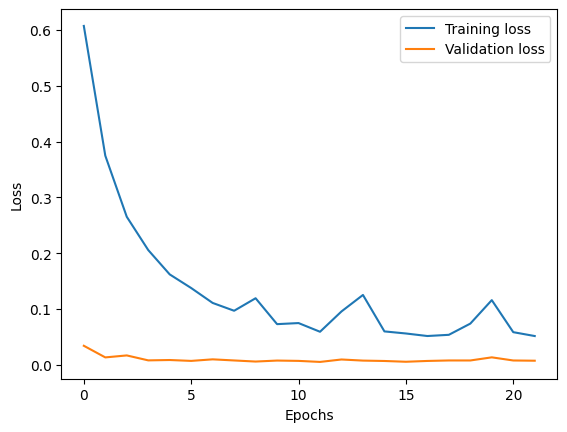

In [27]:
from keras.regularizers import l2 , l1
from keras.regularizers import L1L2  
from keras.callbacks import EarlyStopping
# Define the columns for training
cols = ['eic_count', 'installed_capacity', 'temperature', 'dewpoint',
        'rain', 'snowfall', 'surface_pressure', 'cloudcover_total', 'windspeed_10m',
        'winddirection_10m', 'shortwave_radiation', 'direct_solar_radiation',
        'diffuse_radiation', 'lowest_price_per_mwh', 'highest_price_per_mwh',
        'elect_prices', 'target']

# Initialize an empty DataFrame to store the scaled data
scaled_data = pd.DataFrame()

df_for_training = train_df[cols].astype(float)
scaler = StandardScaler()
df_for_training_scaled = scaler.fit_transform(df_for_training)

trainX = []
trainY = []
n_future = 1  # Number of days we want to look into the future based on the past days.
n_past = 48 # Number of past days we want to use to predict the future.

for i in range(n_past, len(df_for_training_scaled) - n_future + 1):
    trainX.append(df_for_training_scaled[i - n_past:i])
    trainY.append(df_for_training_scaled[i + n_future - 1:i + n_future, -1])  # Target column is the last one

trainX, trainY = np.array(trainX), np.array(trainY)

print('trainX shape == {}.'.format(trainX.shape))
print('trainY shape == {}.'.format(trainY.shape))


model2 = Sequential()
# Adjusted the activation function to 'tanh', which is also the default if not specified
model2.add(GRU(56, input_shape=(trainX.shape[1], trainX.shape[2]), return_sequences=True))

# Uncomment and adjust other layers as needed, ensuring activation functions and configurations are compatible
#model.add(GRU(64 ,activation='tanh', return_sequences=True))
#model.add(GRU(32, activation='tanh', return_sequences=True))
model2.add(GRU(56, activation='tanh', return_sequences=False))

model2.add(Dropout(0.2))

model2.add(Dense(1))  # Output dimension is 1 as we're predicting a single value
model2.compile(optimizer='adam', loss='mse')
model2.summary()
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

history = model2.fit(trainX, trainY, epochs=100, batch_size=20, validation_split=0.1, verbose=1, callbacks=[early_stopping])







plt.plot(history.history['loss'], label='Training loss')
plt.plot(history.history['val_loss'], label='Validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

6/6 [==============================] - 1s 14ms/step


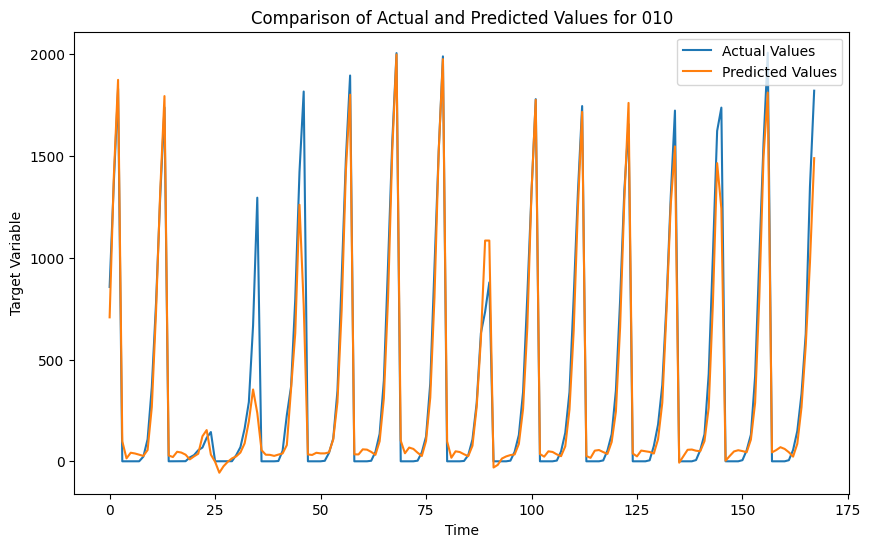

R2 Score: 0.9370168161235963
MSE: 22476.080000087888
RMSE: 149.92024546433976
MAE: 75.85834279851686



In [28]:
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score


df_test = test_df[cols].astype(float)

# Use the scaler from the training to transform the test data
df_test_scaled1= scaler.fit(df_test)
df_test_scaled = scaler.transform(df_test)

# Initialize the lists for testX and testY
testX = []
testY = []


# Prepare testX and testY
for i in range(n_past, len(df_test_scaled) - n_future + 1):
    testX.append(df_test_scaled[i - n_past:i])
    testY.append(df_test_scaled[i + n_future - 1:i + n_future, -1])  # Assuming the last column is still the target

testX, testY = np.array(testX), np.array(testY)



n_days_for_prediction = 168



target_scaler = StandardScaler()
target_scaler.fit(df_test[['target']])


# Predict on the last n_days_for_prediction
prediction_scaled = model2.predict(testX[-n_days_for_prediction:])
prediction = target_scaler.inverse_transform(prediction_scaled)
actual = target_scaler.inverse_transform(testY[-n_days_for_prediction:])



# Calculate the metrics
r2 = r2_score(actual, prediction)
mse = mean_squared_error(actual, prediction)
rmse = np.sqrt(mse)
mae = mean_absolute_error(actual, prediction)

# Plotting
plt.figure(figsize=(10,6))
plt.plot(actual, label='Actual Values')
plt.plot(prediction, label='Predicted Values')
plt.title(f'Comparison of Actual and Predicted Values for 010')
plt.xlabel('Time')
plt.ylabel('Target Variable')
plt.legend()
plt.show()


print(f"R2 Score: {r2}")
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")
print(f"MAE: {mae}\n")

In [29]:
model2.save('model_cluster3_production.h5')

# cluster 5

In [32]:



grouped_data = data.groupby(['product_type','is_business','county'])


df = grouped_data.get_group((1,1,4))

train_size = int(len(df) * 0.8)
train_df = df[:train_size]
test_df = df[train_size:]


In [33]:
from keras.models import Sequential
from keras.layers import Dense, Dropout, LSTM
from keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint
cols = ['eic_count', 'installed_capacity', 'temperature', 'dewpoint',
        'rain', 'snowfall', 'surface_pressure', 'cloudcover_total', 'windspeed_10m',
        'winddirection_10m', 'shortwave_radiation', 'direct_solar_radiation',
        'diffuse_radiation', 'lowest_price_per_mwh', 'highest_price_per_mwh',
        'elect_prices', 'target']

# Initialize an empty DataFrame to store the scaled data
scaled_data = pd.DataFrame()

df_for_training = train_df[cols].astype(float)
scaler = StandardScaler()
df_for_training_scaled = scaler.fit_transform(df_for_training)

trainX = []
trainY = []
n_future = 1  # Number of days we want to look into the future based on the past days.
n_past = 72# Number of past days we want to use to predict the future.

for i in range(n_past, len(df_for_training_scaled) - n_future + 1):
    trainX.append(df_for_training_scaled[i - n_past:i])
    trainY.append(df_for_training_scaled[i + n_future - 1:i + n_future, -1])  # Target column is the last one

x_data, y_data = np.array(trainX), np.array(trainY)

print('trainX shape == {}.'.format(x_data.shape))
print('trainY shape == {}.'.format(y_data.shape))


model3 = Sequential()
    # Adding the first layer
model3.add(LSTM(64, input_shape=(x_data.shape[1], x_data.shape[2]), return_sequences=True))
    # Adding the second layer 
model3.add(LSTM(32, return_sequences=True))
    # Adding a dropout value in order to prevent overfiting

    # Adding the third layer
model3.add(LSTM(16))
model3.add(Dropout(0.2))
    # Adding the output layer. 6 nodes are selected because the data has 6 features
model3.add(Dense(1))
    
    # Choosing the optimizer
optimizer = Adam(lr=0.001)
    
    # Compiling the model
model3.compile(loss='mean_squared_error', optimizer=optimizer, metrics=['mean_squared_error'])
    
    # Fitting the model
history = model3.fit(x_data, y_data, validation_split=0.2, epochs=50, batch_size=10)

trainX shape == (4449, 72, 17).
trainY shape == (4449, 1).
Epoch 1/50


c:\Users\Ghada\anaconda3\envs\gpu\lib\site-packages\keras\optimizers\optimizer_v2\adam.py:114: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


356/356 [==============================] - 15s 25ms/step - loss: 0.8115 - mean_squared_error: 0.8115 - val_loss: 0.0088 - val_mean_squared_error: 0.0088
Epoch 2/50
356/356 [==============================] - 12s 33ms/step - loss: 0.4014 - mean_squared_error: 0.4014 - val_loss: 0.0317 - val_mean_squared_error: 0.0317
Epoch 3/50
356/356 [==============================] - 11s 30ms/step - loss: 0.2744 - mean_squared_error: 0.2744 - val_loss: 0.0063 - val_mean_squared_error: 0.0063
Epoch 4/50
356/356 [==============================] - 9s 24ms/step - loss: 0.2130 - mean_squared_error: 0.2130 - val_loss: 0.0072 - val_mean_squared_error: 0.0072
Epoch 5/50
356/356 [==============================] - 13s 37ms/step - loss: 0.1695 - mean_squared_error: 0.1695 - val_loss: 0.0155 - val_mean_squared_error: 0.0155
Epoch 6/50
356/356 [==============================] - 10s 27ms/step - loss: 0.1434 - mean_squared_error: 0.1434 - val_loss: 0.0218 - val_mean_squared_error: 0.0218
Epoch 7/50
356/356 [========

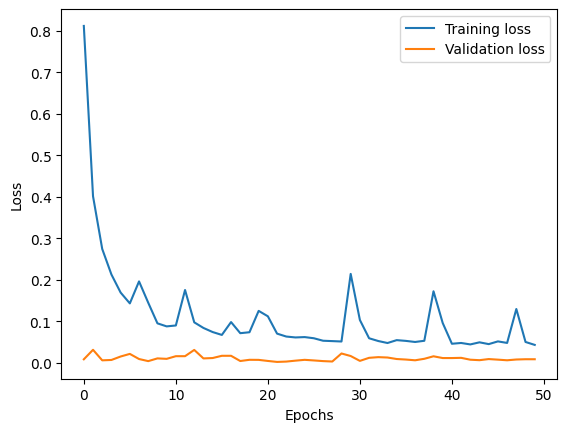

In [35]:
plt.plot(history.history['loss'], label='Training loss')
plt.plot(history.history['val_loss'], label='Validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

2/2 [==============================] - 2s 12ms/step


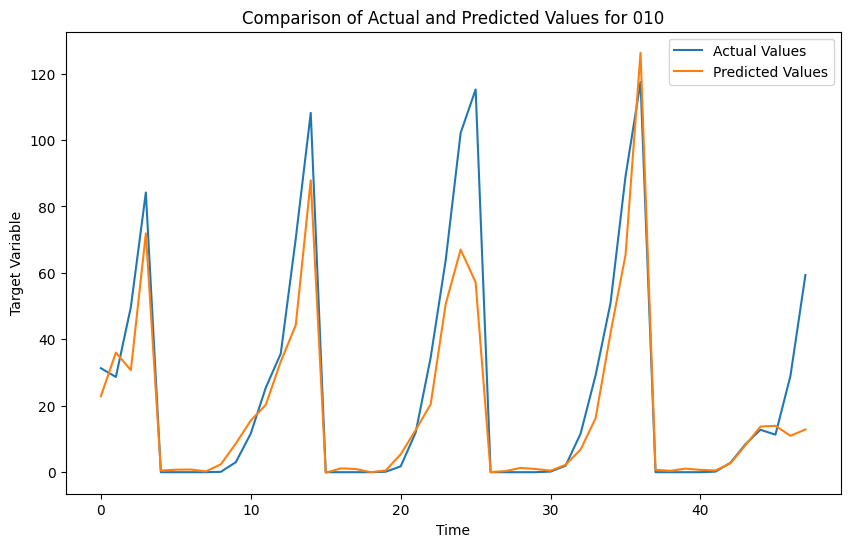

R2 Score: 0.827191651831134
MSE: 212.94344834806495
RMSE: 14.592581963040843
MAE: 7.85082369853594



In [34]:
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score


df_test = test_df[cols].astype(float)

# Use the scaler from the training to transform the test data
df_test_scaled1= scaler.fit(df_test)
df_test_scaled = scaler.transform(df_test)

# Initialize the lists for testX and testY
testX = []
testY = []


# Prepare testX and testY
for i in range(n_past, len(df_test_scaled) - n_future + 1):
    testX.append(df_test_scaled[i - n_past:i])
    testY.append(df_test_scaled[i + n_future - 1:i + n_future, -1])  # Assuming the last column is still the target

testX, testY = np.array(testX), np.array(testY)



n_days_for_prediction = 48



target_scaler = StandardScaler()
target_scaler.fit(df_test[['target']])


# Predict on the last n_days_for_prediction
prediction_scaled = model3.predict(testX[-n_days_for_prediction:])
prediction = target_scaler.inverse_transform(prediction_scaled)
actual = target_scaler.inverse_transform(testY[-n_days_for_prediction:])


# Calculate the metrics
r2 = r2_score(actual, prediction)
mse = mean_squared_error(actual, prediction)
rmse = np.sqrt(mse)
mae = mean_absolute_error(actual, prediction)

# Plotting
plt.figure(figsize=(10,6))
plt.plot(actual, label='Actual Values')
plt.plot(prediction, label='Predicted Values')
plt.title(f'Comparison of Actual and Predicted Values for 010')
plt.xlabel('Time')
plt.ylabel('Target Variable')
plt.legend()
plt.show()


print(f"R2 Score: {r2}")
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")
print(f"MAE: {mae}\n")

In [54]:
model3.save('model_cluster5_production.h5')

# cluster 4

In [38]:


df = grouped_data.get_group((0,1,11))

train_size = int(len(df) * 0.8)
train_df = df[:train_size]
test_df = df[train_size:]


trainX shape == (4200, 48, 17).
trainY shape == (4200, 1).
Epoch 1/50


c:\Users\Ghada\anaconda3\envs\gpu\lib\site-packages\keras\optimizers\optimizer_v2\adam.py:114: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


378/378 [==============================] - 8s 13ms/step - loss: 0.0198 - mean_squared_error: 0.0198 - val_loss: 4.9409e-04 - val_mean_squared_error: 4.9409e-04
Epoch 2/50
378/378 [==============================] - 4s 11ms/step - loss: 0.0140 - mean_squared_error: 0.0140 - val_loss: 3.9404e-04 - val_mean_squared_error: 3.9404e-04
Epoch 3/50
378/378 [==============================] - 4s 12ms/step - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 3.0871e-04 - val_mean_squared_error: 3.0871e-04
Epoch 4/50
378/378 [==============================] - 5s 14ms/step - loss: 0.0108 - mean_squared_error: 0.0108 - val_loss: 2.9931e-04 - val_mean_squared_error: 2.9931e-04
Epoch 5/50
378/378 [==============================] - 4s 11ms/step - loss: 0.0103 - mean_squared_error: 0.0103 - val_loss: 3.3515e-04 - val_mean_squared_error: 3.3515e-04
Epoch 6/50
378/378 [==============================] - 5s 14ms/step - loss: 0.0099 - mean_squared_error: 0.0099 - val_loss: 1.7268e-04 - val_mean_squared_err

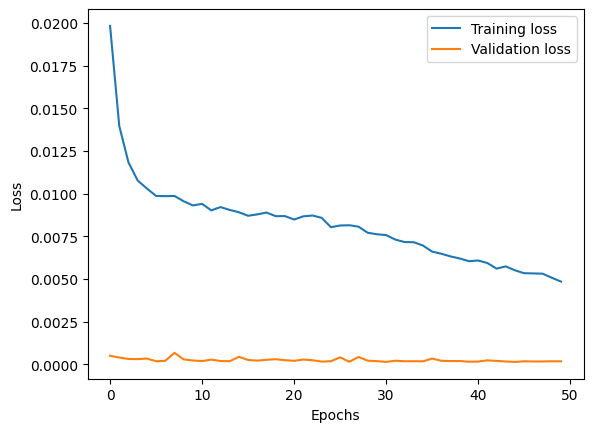

In [48]:
from sklearn.preprocessing import MinMaxScaler
cols = ['eic_count', 'installed_capacity', 'temperature', 'dewpoint',
        'rain', 'snowfall', 'surface_pressure', 'cloudcover_total', 'windspeed_10m',
        'winddirection_10m', 'shortwave_radiation', 'direct_solar_radiation',
        'diffuse_radiation', 'lowest_price_per_mwh', 'highest_price_per_mwh',
        'elect_prices', 'target']

# Initialize an empty DataFrame to store the scaled data
scaled_data = pd.DataFrame()

df_for_training = train_df[cols].astype(float)
scaler = MinMaxScaler()  
df_for_training_scaled = scaler.fit_transform(df_for_training)

trainX = []
trainY = []
n_future = 1  # Number of days we want to look into the future based on the past days.
n_past = 48# Number of past days we want to use to predict the future.

for i in range(n_past, len(df_for_training_scaled) - n_future + 1):
    trainX.append(df_for_training_scaled[i - n_past:i])
    trainY.append(df_for_training_scaled[i + n_future - 1:i + n_future, -1])  # Target column is the last one

x_data, y_data = np.array(trainX), np.array(trainY)

print('trainX shape == {}.'.format(x_data.shape))
print('trainY shape == {}.'.format(y_data.shape))


model4 = Sequential()
    # Adding the first layer
model4.add(GRU(32, input_shape=(x_data.shape[1], x_data.shape[2]), return_sequences=True))
    # Adding the second layer 
model4.add(GRU(32, return_sequences=False))
model4.add(Dropout(0.2))
    # Adding the output layer. 6 nodes are selected because the data has 6 features
model4.add(Dense(1))
    
    # Choosing the optimizer
optimizer = Adam(lr=0.0001)
    
    # Compiling the model
model4.compile(loss='mean_squared_error', optimizer=optimizer, metrics=['mean_squared_error'])
    
    # Fitting the model
history = model4.fit(x_data, y_data, validation_split=0.1, epochs=50, batch_size=10)



plt.plot(history.history['loss'], label='Training loss')
plt.plot(history.history['val_loss'], label='Validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

6/6 [==============================] - 1s 8ms/step
{'group': (2, 1, 1), 'r2': 0.765440045230233, 'mse': 0.5798718344785864, 'rmse': 0.7614931611502407, 'mae': 0.5075097226895325}


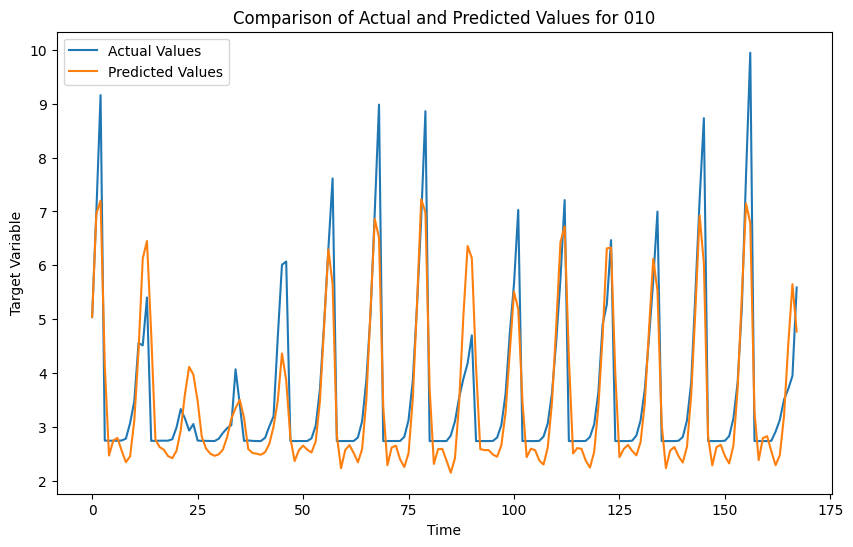

6/6 [==============================] - 0s 10ms/step
{'group': (2, 1, 1), 'r2': 0.765440045230233, 'mse': 0.5798718344785864, 'rmse': 0.7614931611502407, 'mae': 0.5075097226895325}
{'group': (11, 0, 1), 'r2': 0.7213850665363281, 'mse': 6.8654085848062705, 'rmse': 2.6201924709467947, 'mae': 1.9070744438149043}


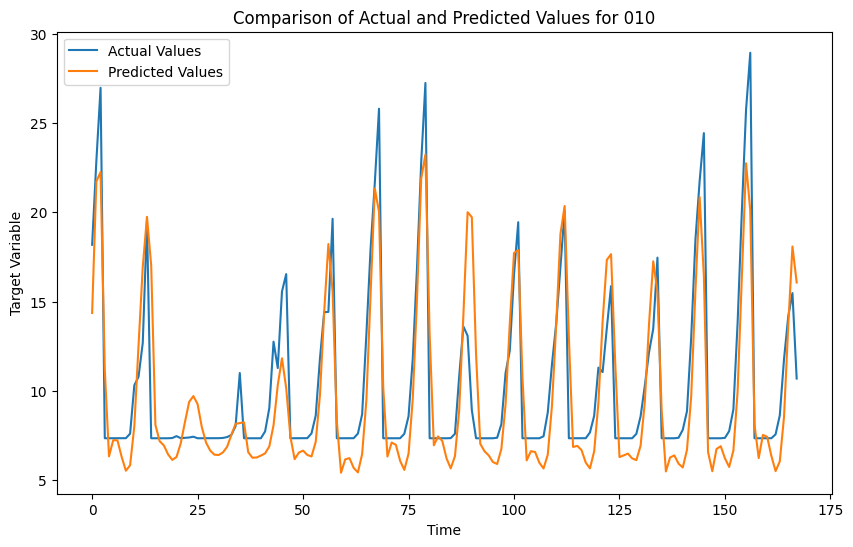

In [49]:

cluster_data = clustering[clustering['Cluster'] == 4]



# Initialize your scaler and model
scaler = MinMaxScaler()  # Assuming this should be fitted with training data elsewhere


# Process for each group in Cluster 2
results = []
for group, group_data in cluster_data.groupby(['county', 'product_type', 'is_business']):
    df = group_data[cols].astype(float)
    df_scaled= scaler.fit(df)
    df_scaled = scaler.transform(df)

    testX = []
    testY = []
    for i in range(n_past, len(df_scaled) - n_future + 1):
        testX.append(df_scaled[i - n_past:i])
        testY.append(df_scaled[i + n_future - 1:i + n_future, -1])  # Assuming the last column is still the target

    testX, testY = np.array(testX), np.array(testY)



    n_days_for_prediction = 168



    target_scaler = StandardScaler()
    target_scaler.fit(df[['target']])


# Predict on the last n_days_for_prediction
    prediction_scaled = model4.predict(testX[-n_days_for_prediction:])
    prediction = target_scaler.inverse_transform(prediction_scaled)
    actual = target_scaler.inverse_transform(testY[-n_days_for_prediction:])

# Calculate the metrics
    r2 = r2_score(actual, prediction)
    mse = mean_squared_error(actual, prediction)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(actual, prediction)
    results.append({
        'group': group,
        'r2': r2,
        'mse': mse,
        'rmse': rmse,
        'mae': mae
    })
    
    for result in results:
        print(result)


# Plotting
    plt.figure(figsize=(10,6))
    plt.plot(actual, label='Actual Values')
    plt.plot(prediction, label='Predicted Values')
    plt.title(f'Comparison of Actual and Predicted Values for 010')
    plt.xlabel('Time')
    plt.ylabel('Target Variable')
    plt.legend()
    plt.show()

In [55]:
model4.save('model_cluster4_production.h5') 

# cluster 6

In [50]:





df = grouped_data.get_group((2,1,11))

train_size = int(len(df) * 0.8)
train_df = df[:train_size]
test_df = df[train_size:]


In [51]:
import tensorflow as tf

print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))



Num GPUs Available:  1


trainX shape == (4351, 48, 17).
trainY shape == (4351, 1).
Model: "sequential_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_19 (GRU)                (None, 48, 128)           56448     
                                                                 
 gru_20 (GRU)                (None, 48, 64)            37248     
                                                                 
 gru_21 (GRU)                (None, 48, 32)            9408      
                                                                 
 gru_22 (GRU)                (None, 32)                6336      
                                                                 
 dropout_15 (Dropout)        (None, 32)                0         
                                                                 
 dense_14 (Dense)            (None, 1)                 33        
                                                            

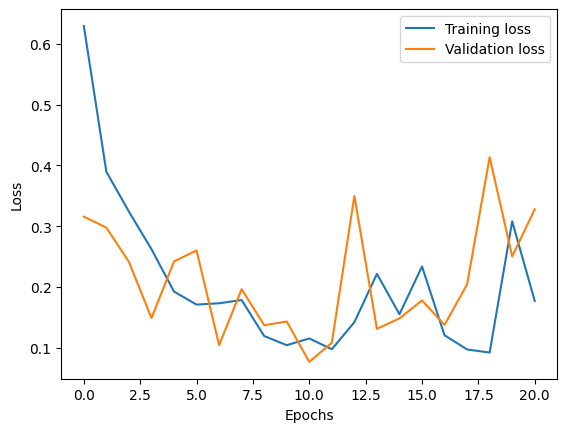

In [64]:
from keras.regularizers import l2 , l1
from keras.regularizers import L1L2  
from keras.callbacks import EarlyStopping
# Define the columns for training
cols = ['eic_count', 'installed_capacity', 'temperature', 'dewpoint',
        'rain', 'snowfall', 'surface_pressure', 'cloudcover_total', 'windspeed_10m',
        'winddirection_10m', 'shortwave_radiation', 'direct_solar_radiation',
        'diffuse_radiation', 'lowest_price_per_mwh', 'highest_price_per_mwh',
        'elect_prices', 'target']

# Initialize an empty DataFrame to store the scaled data
scaled_data = pd.DataFrame()

df_for_training = train_df[cols].astype(float)
scaler = StandardScaler()
df_for_training_scaled = scaler.fit_transform(df_for_training)

trainX = []
trainY = []
n_future = 1  # Number of days we want to look into the future based on the past days.
n_past = 48 # Number of past days we want to use to predict the future.

for i in range(n_past, len(df_for_training_scaled) - n_future + 1):
    trainX.append(df_for_training_scaled[i - n_past:i])
    trainY.append(df_for_training_scaled[i + n_future - 1:i + n_future, -1])  # Target column is the last one

trainX, trainY = np.array(trainX), np.array(trainY)

print('trainX shape == {}.'.format(trainX.shape))
print('trainY shape == {}.'.format(trainY.shape))


model5 = Sequential()
# Adjusted the activation function to 'tanh', which is also the default if not specified
model5.add(GRU(128, input_shape=(trainX.shape[1], trainX.shape[2]), return_sequences=True))
model5.add(GRU(64, activation='tanh', return_sequences=True))
model5.add(GRU(32, activation='tanh', return_sequences=True))
model5.add(GRU(32, activation='tanh', return_sequences=False))
model5.add(Dropout(0.2))

model5.add(Dense(1))  # Output dimension is 1 as we're predicting a single value
model5.compile(optimizer='adam', loss='mse')
model5.summary()
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

history = model5.fit(trainX, trainY, epochs=100, batch_size=20, validation_split=0.1, verbose=1, callbacks=[early_stopping])







plt.plot(history.history['loss'], label='Training loss')
plt.plot(history.history['val_loss'], label='Validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


6/6 [==============================] - 1s 11ms/step


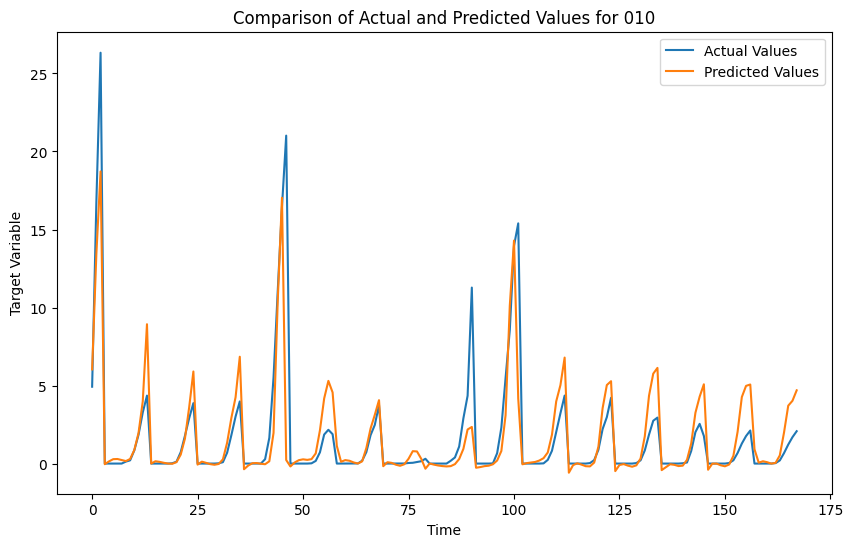

R2 Score: 0.6120370315222246
MSE: 5.516791882877667
RMSE: 2.3487851930046024
MAE: 0.9682607145698912



In [65]:
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score


df_test = test_df[cols].astype(float)

# Use the scaler from the training to transform the test data
df_test_scaled1= scaler.fit(df_test)
df_test_scaled = scaler.transform(df_test)

# Initialize the lists for testX and testY
testX = []
testY = []


# Prepare testX and testY
for i in range(n_past, len(df_test_scaled) - n_future + 1):
    testX.append(df_test_scaled[i - n_past:i])
    testY.append(df_test_scaled[i + n_future - 1:i + n_future, -1])  # Assuming the last column is still the target

testX, testY = np.array(testX), np.array(testY)



n_days_for_prediction = 168


target_scaler = StandardScaler()
target_scaler.fit(df_test[['target']])


# Predict on the last n_days_for_prediction
prediction_scaled = model5.predict(testX[-n_days_for_prediction:])
prediction = target_scaler.inverse_transform(prediction_scaled)
actual = target_scaler.inverse_transform(testY[-n_days_for_prediction:])


# Calculate the metrics
r2 = r2_score(actual, prediction)
mse = mean_squared_error(actual, prediction)
rmse = np.sqrt(mse)
mae = mean_absolute_error(actual, prediction)

# Plotting
plt.figure(figsize=(10,6))
plt.plot(actual, label='Actual Values')
plt.plot(prediction, label='Predicted Values')
plt.title(f'Comparison of Actual and Predicted Values for 010')
plt.xlabel('Time')
plt.ylabel('Target Variable')
plt.legend()
plt.show()


print(f"R2 Score: {r2}")
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")
print(f"MAE: {mae}\n")

In [66]:
model5.save('model_cluster6_production.h5')

# Cluster 7

In [67]:

df = grouped_data.get_group((3,1,13))

train_size = int(len(df) * 0.8)
train_df = df[:train_size]
test_df = df[train_size:]

trainX shape == (5547, 48, 17).
trainY shape == (5547, 1).
Model: "sequential_17"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_26 (GRU)                (None, 48, 10)            870       
                                                                 
 gru_27 (GRU)                (None, 5)                 255       
                                                                 
 dropout_17 (Dropout)        (None, 5)                 0         
                                                                 
 dense_16 (Dense)            (None, 1)                 6         
                                                                 
Total params: 1,131
Trainable params: 1,131
Non-trainable params: 0
_________________________________________________________________
Epoch 1/100
500/500 [==============================] - 10s 13ms/step - loss: 1.3223 - val_loss: 0.2425
Epoch 2/100
500/500 [

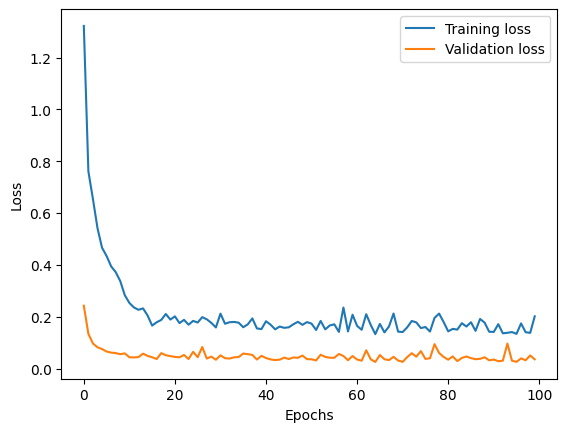

In [75]:
from keras.regularizers import l2 , l1
from keras.regularizers import L1L2  
# Define the columns for training
cols = ['eic_count', 'installed_capacity', 'temperature', 'dewpoint',
        'rain', 'snowfall', 'surface_pressure', 'cloudcover_total', 'windspeed_10m',
        'winddirection_10m', 'shortwave_radiation', 'direct_solar_radiation',
        'diffuse_radiation', 'lowest_price_per_mwh', 'highest_price_per_mwh',
        'elect_prices', 'target']

# Initialize an empty DataFrame to store the scaled data
scaled_data = pd.DataFrame()

df_for_training = train_df[cols].astype(float)
scaler = StandardScaler()
df_for_training_scaled = scaler.fit_transform(df_for_training)

trainX = []
trainY = []
n_future = 1  # Number of days we want to look into the future based on the past days.
n_past = 48 # Number of past days we want to use to predict the future.

for i in range(n_past, len(df_for_training_scaled) - n_future + 1):
    trainX.append(df_for_training_scaled[i - n_past:i])
    trainY.append(df_for_training_scaled[i + n_future - 1:i + n_future, -1])  # Target column is the last one

trainX, trainY = np.array(trainX), np.array(trainY)

print('trainX shape == {}.'.format(trainX.shape))
print('trainY shape == {}.'.format(trainY.shape))


model6 = Sequential()

model6.add(GRU(10, input_shape=(trainX.shape[1], trainX.shape[2]), return_sequences=True, kernel_regularizer=L1L2(l1=0.01, l2=0.01)))

model6.add(GRU(5, activation='tanh', return_sequences=False))
model6.add(Dropout(0.2))
model6.add(Dense(1))  
model6.compile(optimizer='adam', loss='mse')
model6.summary()


history=model6.fit(trainX, trainY, epochs=100, batch_size=10, validation_split=0.1, verbose=1)





plt.plot(history.history['loss'], label='Training loss')
plt.plot(history.history['val_loss'], label='Validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

6/6 [==============================] - 2s 10ms/step


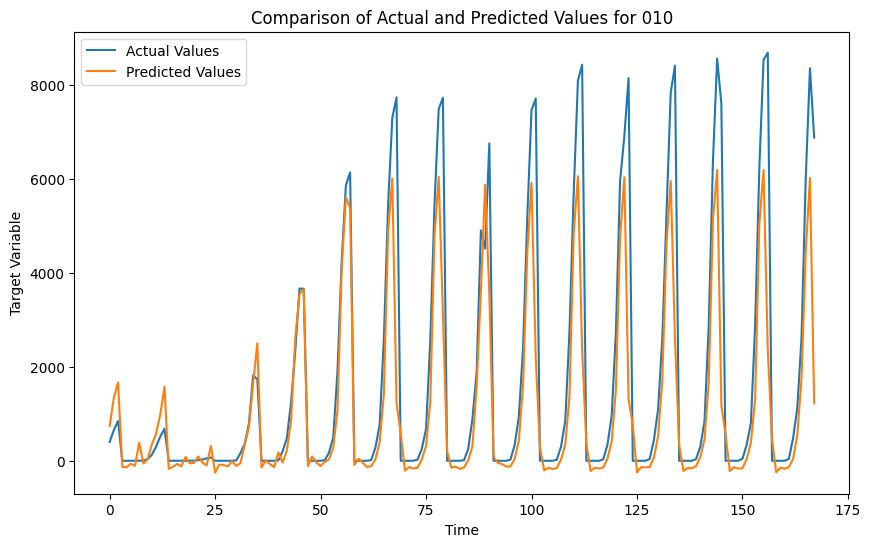

R2 Score: 0.6736660286038016
MSE: 2396092.577674378
RMSE: 1547.9317096288125
MAE: 743.7859910888671



In [76]:
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score


df_test = test_df[cols].astype(float)

# Use the scaler from the training to transform the test data
df_test_scaled1= scaler.fit(df_test)
df_test_scaled = scaler.transform(df_test)

# Initialize the lists for testX and testY
testX = []
testY = []


# Prepare testX and testY
for i in range(n_past, len(df_test_scaled) - n_future + 1):
    testX.append(df_test_scaled[i - n_past:i])
    testY.append(df_test_scaled[i + n_future - 1:i + n_future, -1])  # Assuming the last column is still the target

testX, testY = np.array(testX), np.array(testY)



n_days_for_prediction = 168


target_scaler = StandardScaler()
target_scaler.fit(df_test[['target']])


# Predict on the last n_days_for_prediction
prediction_scaled = model6.predict(testX[-n_days_for_prediction:])
prediction = target_scaler.inverse_transform(prediction_scaled)
actual = target_scaler.inverse_transform(testY[-n_days_for_prediction:])


# Calculate the metrics
r2 = r2_score(actual, prediction)
mse = mean_squared_error(actual, prediction)
rmse = np.sqrt(mse)
mae = mean_absolute_error(actual, prediction)

# Plotting
plt.figure(figsize=(10,6))
plt.plot(actual, label='Actual Values')
plt.plot(prediction, label='Predicted Values')
plt.title(f'Comparison of Actual and Predicted Values for 010')
plt.xlabel('Time')
plt.ylabel('Target Variable')
plt.legend()
plt.show()


print(f"R2 Score: {r2}")
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")
print(f"MAE: {mae}\n")

In [77]:
model6.save('model_cluster7_production.h5')